In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno


In [64]:
EEG_df = pd.read_csv('emotions.csv')

In [65]:
# Display basic info
print("="*50)
print("Data Head:")
print(EEG_df.head())

Data Head:
   # mean_0_a  mean_1_a  mean_2_a  mean_3_a  mean_4_a  mean_d_0_a  mean_d_1_a  \
0        4.62      30.3    -356.0      15.6      26.3       1.070       0.411   
1       28.80      33.1      32.0      25.8      22.8       6.550       1.680   
2        8.90      29.4    -416.0      16.7      23.7      79.900       3.360   
3       14.90      31.6    -143.0      19.8      24.3      -0.584      -0.284   
4       28.30      31.3      45.2      27.3      24.5      34.800      -5.790   

   mean_d_2_a  mean_d_3_a  mean_d_4_a  ...  fft_741_b  fft_742_b  fft_743_b  \
0      -15.70        2.06        3.15  ...       23.5       20.3       20.3   
1        2.88        3.83       -4.82  ...      -23.3      -21.8      -21.8   
2       90.20       89.90        2.03  ...      462.0     -233.0     -233.0   
3        8.82        2.30       -1.97  ...      299.0     -243.0     -243.0   
4        3.06       41.40        5.52  ...       12.0       38.1       38.1   

   fft_744_b  fft_745_b  ff

In [5]:
print("="*50)
print("\nData Info:")
print(EEG_df.info())


Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2132 entries, 0 to 2131
Columns: 2549 entries, # mean_0_a to label
dtypes: float64(2548), object(1)
memory usage: 41.5+ MB
None


In [6]:
print("\nDescriptive Statistics:")
print(EEG_df.describe(include='all'))
print("="*50)


Descriptive Statistics:
         # mean_0_a     mean_1_a     mean_2_a     mean_3_a     mean_4_a  \
count   2132.000000  2132.000000  2132.000000  2132.000000  2132.000000   
unique          NaN          NaN          NaN          NaN          NaN   
top             NaN          NaN          NaN          NaN          NaN   
freq            NaN          NaN          NaN          NaN          NaN   
mean      15.256914    27.012462  -104.975629    13.605898    24.150483   
std       15.284621     9.265141   206.271960    16.874676    14.187340   
min      -61.300000  -114.000000  -970.000000  -137.000000  -217.000000   
25%        6.577500    26.075000  -195.000000     4.857500    23.600000   
50%       14.100000    30.000000    14.950000    15.400000    25.200000   
75%       27.700000    31.400000    29.600000    26.500000    26.800000   
max      304.000000    42.300000   661.000000   206.000000   213.000000   

         mean_d_0_a   mean_d_1_a   mean_d_2_a   mean_d_3_a   mean_d_4_a  .

In [7]:
X = EEG_df.drop(columns=['label'])
y = EEG_df['label']

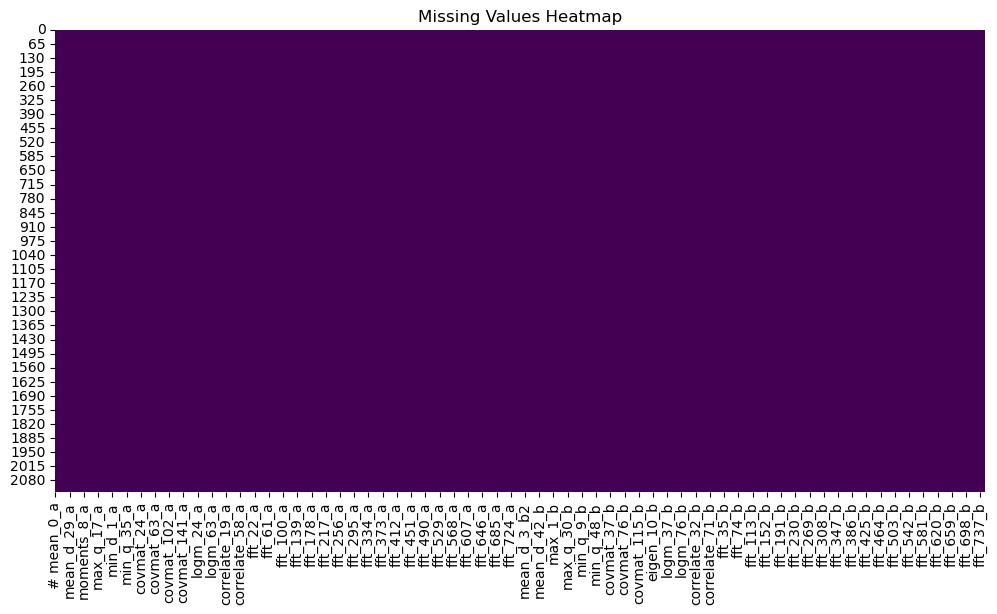

No missing values found!


In [8]:
# 2. Missing Values Visualization
plt.figure(figsize=(12, 6))
sns.heatmap(EEG_df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

missing_values = EEG_df.isnull().sum()
missing_values = missing_values[missing_values > 0]  # Only show columns with missing values

if len(missing_values) > 0:
    missing_values.plot(kind='bar', figsize=(10, 5))
    plt.title("Missing Values per Column")
    plt.ylabel("Count")
    plt.show()
else:
    print("No missing values found!")

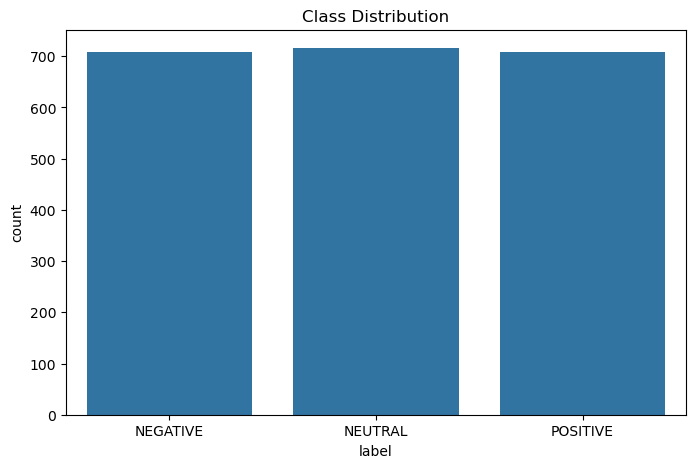

In [9]:
# 3. Target Distribution (if 'label' exists)
if 'label' in EEG_df.columns:
    plt.figure(figsize=(8, 5))
    sns.countplot(data=EEG_df, x='label')
    plt.title("Class Distribution")
    plt.show()

In [10]:
# 4. Numerical Feature Analysis
num_cols = EEG_df.select_dtypes(include=np.number).columns

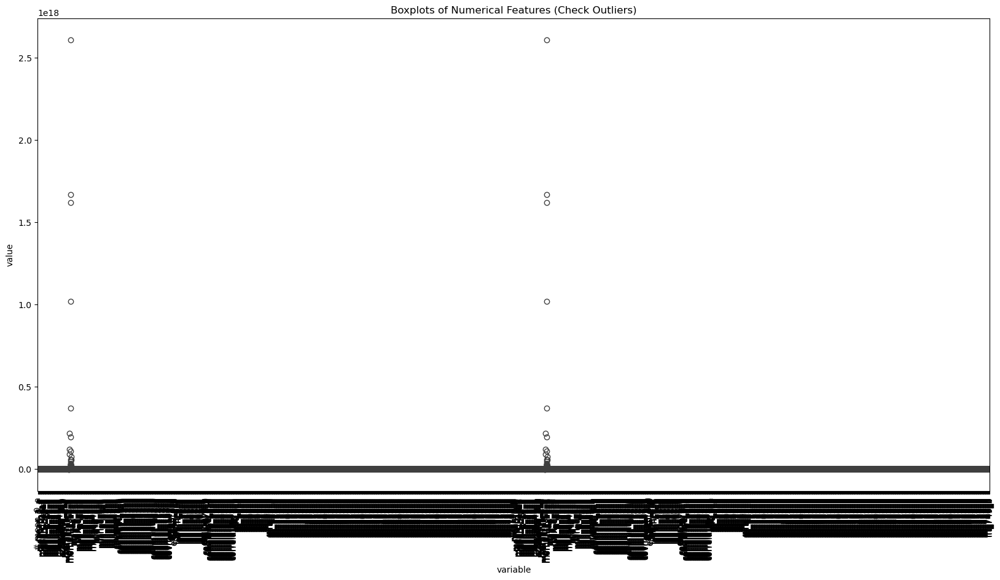

In [11]:
# Boxplots for Outliers
plt.figure(figsize=(20, 10))
sns.boxplot(data=EEG_df[num_cols].melt(), x='variable', y='value')
plt.xticks(rotation=90)
plt.title("Boxplots of Numerical Features (Check Outliers)")
plt.show()

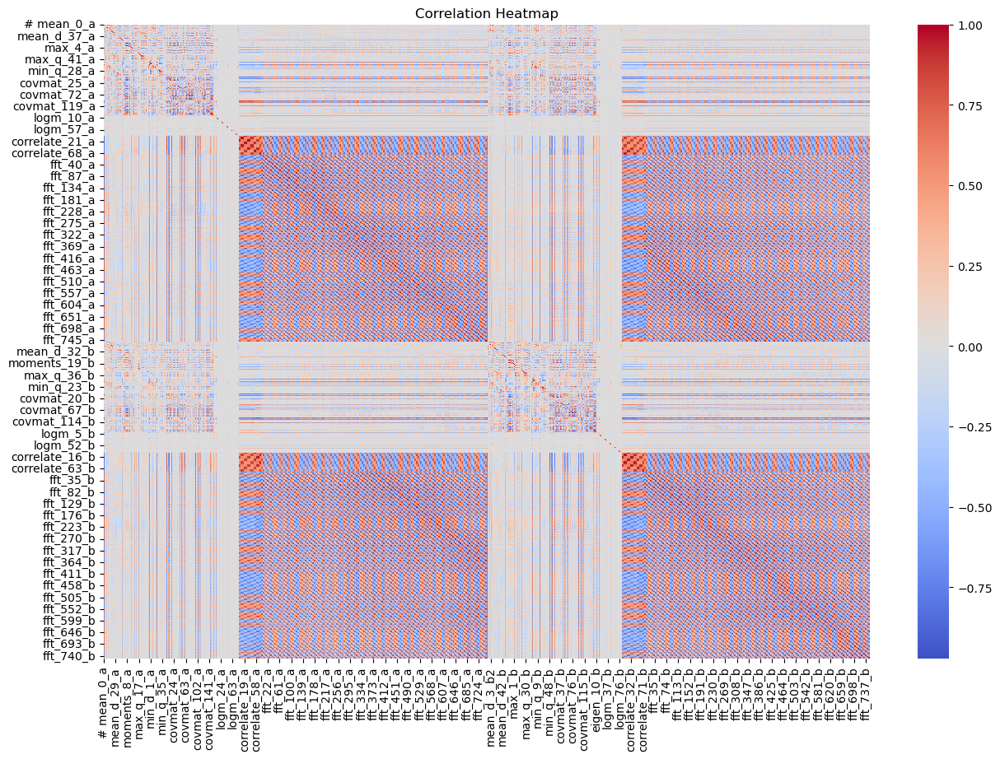

In [12]:
# Correlation Heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(EEG_df[num_cols].corr(), annot=False, cmap='coolwarm', center=0)
plt.title("Correlation Heatmap")
plt.show()

Delta (0.5–4 Hz): Deep sleep, unconscious states

Theta (4–8 Hz): Memory, emotions

Alpha (8–12 Hz): Relaxation

Beta (12–30 Hz): Focus, anxiety

Gamma (30–100 Hz): Cognitive processing



##### Checking if Data has already applied Filters as written in paper

In [13]:
band_features = {
    'Delta (0.5-4Hz)': [col for col in X.columns if 'mean_0_' in col],
    'Theta (4-8Hz)': [col for col in X.columns if 'mean_1_' in col],
    'Alpha (8-12Hz)': [col for col in X.columns if 'mean_2_' in col],
    'Beta (12-30Hz)': [col for col in X.columns if 'mean_3_' in col],
    'Gamma (30-70Hz)': [col for col in X.columns if 'mean_4_' in col]
}

print("Feature counts per band:")
for band, cols in band_features.items():
    print(f"{band}: {len(cols)} features")

Feature counts per band:
Delta (0.5-4Hz): 2 features
Theta (4-8Hz): 2 features
Alpha (8-12Hz): 2 features
Beta (12-30Hz): 2 features
Gamma (30-70Hz): 2 features


##### The presence of exactly 2 features per standard frequency band (Delta to Gamma) proves bandpass filtering was applied during preprocessing.

#### Checking if Notch Filter present

In [14]:
fft_freqs = sorted(list(set(int(col.split('_')[1]) 
                          for col in X.columns if 'fft_' in col)))

print("FFT frequencies present:", fft_freqs)

# Check powerline frequencies explicitly
print("50Hz present?", 50 in fft_freqs)
print("60Hz present?", 60 in fft_freqs)

FFT frequencies present: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216,

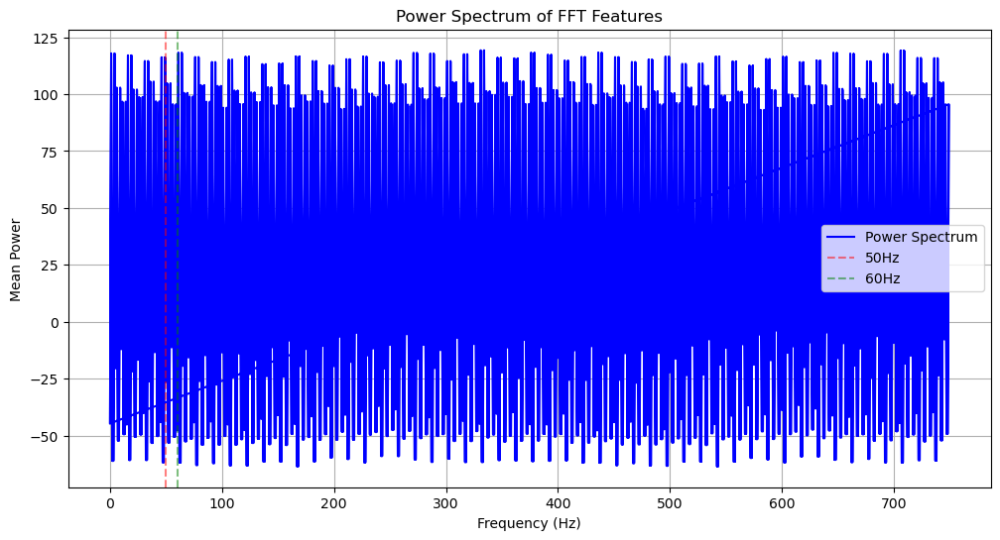


Analysis for 50Hz:
Ratio (target/surrounding): 0.53
⚠️ Poor attenuation - notch filtering may be ineffective

Analysis for 60Hz:
Ratio (target/surrounding): 0.31
⚠️ Poor attenuation - notch filtering may be ineffective


In [16]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Get all FFT-related columns
fft_cols = [col for col in X.columns if col.startswith('fft_')]

# 2. Extract frequencies from column names
frequencies = np.array([int(col.split('_')[1]) for col in fft_cols])

# 3. Calculate mean power for each frequency across all samples
mean_power = X[fft_cols].mean(axis=0).values  # This is where we define mean_power

# 4. Visual inspection
plt.figure(figsize=(12, 6))
plt.plot(frequencies, mean_power, 'b-', label='Power Spectrum')
plt.axvline(50, color='r', linestyle='--', alpha=0.5, label='50Hz')
plt.axvline(60, color='g', linestyle='--', alpha=0.5, label='60Hz')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Mean Power')
plt.title('Power Spectrum of FFT Features')
plt.legend()
plt.grid(True)
plt.show()

# 5. Quantitative analysis
def analyze_frequency(target_freq, bandwidth=2):
    # Find target frequency bins
    target_mask = (frequencies >= target_freq - bandwidth) & (frequencies <= target_freq + bandwidth)
    
    if not any(target_mask):
        print(f"\nNo features found at {target_freq}Hz ± {bandwidth}Hz")
        print("This frequency may have already been removed during preprocessing")
        return
    
    # Find surrounding frequencies (for comparison)
    surround_mask = (
        (frequencies >= target_freq - 3*bandwidth) & 
        (frequencies <= target_freq + 3*bandwidth) & 
        ~target_mask
    )
    
    target_power = mean_power[target_mask].mean()
    surround_power = mean_power[surround_mask].mean()
    
    print(f"\nAnalysis for {target_freq}Hz:")
    print(f"Ratio (target/surrounding): {target_power/surround_power:.2f}")
    
    if target_power/surround_power < 0.3:
        print("✅ Good attenuation (ratio < 0.3)")
    else:
        print("⚠️ Poor attenuation - notch filtering may be ineffective")

# Check both noise frequencies
analyze_frequency(50)
analyze_frequency(60)

##### Bandpass Filtering (0.5-45Hz)

In [17]:
# all FFT columns
fft_cols = [col for col in EEG_df.columns if col.startswith('fft_')]

# frequencies
frequencies = np.array([int(col.split('_')[1]) for col in fft_cols])

# Creating a mask for 0.5-45Hz range
valid_freq_mask = (frequencies >= 0.5) & (frequencies <= 45)

# Columns to keep (both FFT and non-FFT features)
cols_to_keep = [col for col in EEG_df.columns 
               if not col.startswith('fft_') or 
               (col.startswith('fft_') and valid_freq_mask[fft_cols.index(col)])]

EEG_filtered = EEG_df[cols_to_keep]

In [18]:
EEG_filtered.columns

Index(['# mean_0_a', 'mean_1_a', 'mean_2_a', 'mean_3_a', 'mean_4_a',
       'mean_d_0_a', 'mean_d_1_a', 'mean_d_2_a', 'mean_d_3_a', 'mean_d_4_a',
       ...
       'fft_37_b', 'fft_38_b', 'fft_39_b', 'fft_40_b', 'fft_41_b', 'fft_42_b',
       'fft_43_b', 'fft_44_b', 'fft_45_b', 'label'],
      dtype='object', length=1139)

##### Notch Filtering

In [19]:
# Define noise frequencies ±2Hz bandwidth
noise_ranges = [(48,52), (58,62)]  # 50Hz and 60Hz with ±2Hz buffer

# Identify columns to remove
noise_cols = []
for low, high in noise_ranges:
    noise_cols.extend([col for col in EEG_filtered.columns 
                      if col.startswith('fft_') and 
                      low <= int(col.split('_')[1]) <= high])

EEG_clean = EEG_filtered.drop(columns=noise_cols)

In [20]:
remaining_fft_cols = [col for col in EEG_clean.columns if col.startswith('fft_')]
remaining_freqs = np.array([int(col.split('_')[1]) for col in remaining_fft_cols])

print("Min frequency (Hz):", remaining_freqs.min())
print("Max frequency (Hz):", remaining_freqs.max())
print("50/60 Hz present?:", 
      any((48 <= f <= 52) or (58 <= f <= 62) for f in remaining_freqs))

Min frequency (Hz): 1
Max frequency (Hz): 45
50/60 Hz present?: False


In [22]:
EEG_clean

,# mean_0_a,mean_1_a,mean_2_a,mean_3_a,mean_4_a,mean_d_0_a,mean_d_1_a,mean_d_2_a,mean_d_3_a,mean_d_4_a,...,fft_37_b,fft_38_b,fft_39_b,fft_40_b,fft_41_b,fft_42_b,fft_43_b,fft_44_b,fft_45_b,label
0,4.620,30.3,-356.0,15.60,26.3,1.070,0.411,-15.700,2.060,3.15,...,-76.4,-76.4,107.000,-400.0,361.0,-250.00,-250.00,361.0,-323.00,NEGATIVE
1,28.800,33.1,32.0,25.80,22.8,6.550,1.680,2.880,3.830,-4.82,...,37.3,37.3,-0.525,65.1,-33.4,76.00,76.00,-33.4,89.20,NEUTRAL
2,8.900,29.4,-416.0,16.70,23.7,79.900,3.360,90.200,89.900,2.03,...,-90.0,-90.0,549.000,-269.0,489.0,-75.70,-75.70,489.0,-189.00,POSITIVE
3,14.900,31.6,-143.0,19.80,24.3,-0.584,-0.284,8.820,2.300,-1.97,...,-215.0,-215.0,488.000,92.0,36.4,2.73,2.73,36.4,143.00,POSITIVE
4,28.300,31.3,45.2,27.30,24.5,34.800,-5.790,3.060,41.400,5.52,...,103.0,103.0,-47.300,306.0,-58.9,89.70,89.70,-58.9,282.00,NEUTRAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2127,32.400,32.2,32.2,30.80,23.4,1.640,-2.030,0.647,-0.121,-1.10,...,57.4,57.4,-26.400,201.0,-11.5,-20.80,-20.80,-11.5,119.00,NEUTRAL
2128,16.300,31.3,-284.0,14.30,23.9,4.200,1.090,4.460,4.720,6.63,...,-156.0,-156.0,326.000,-84.3,200.0,-85.90,-85.90,200.0,9.74,POSITIVE
2129,-0.547,28.3,-259.0,15.80,26.7,9.080,6.900,12.700,2.030,4.64,...,-186.0,-186.0,423.000,210.0,-68.5,52.40,52.40,-68.5,-355.00,NEGATIVE
2130,16.800,19.9,-288.0,8.34,26.0,2.460,1.580,-16.000,1.690,4.74,...,-142.0,-142.0,282.000,-702.0,593.0,-268.00,-268.00,593.0,114.00,NEGATIVE


In [24]:
X = EEG_clean.drop(columns=['label'])
y = EEG_clean['label']

##### Plotting with outliers highlighted

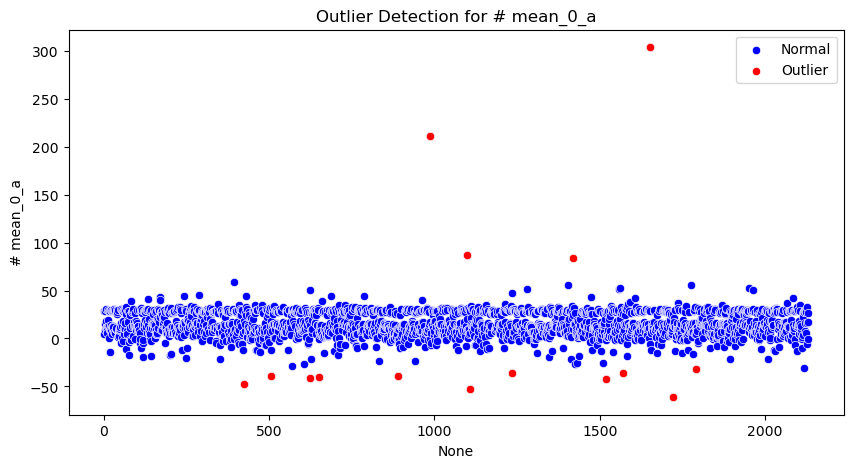

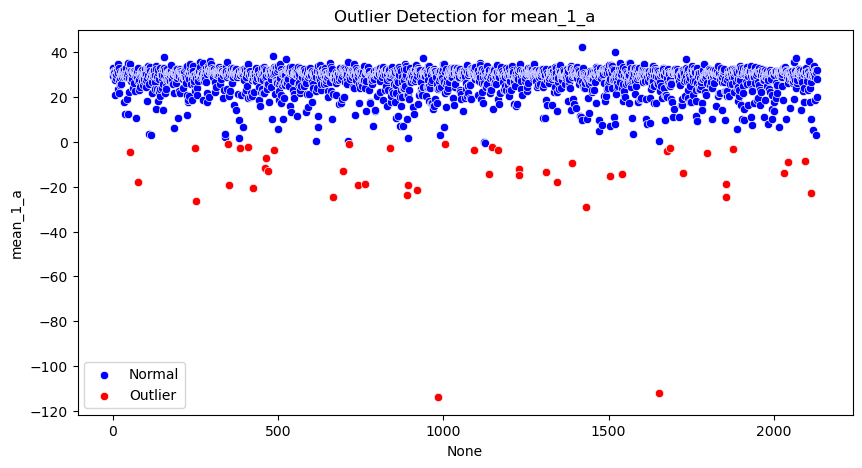

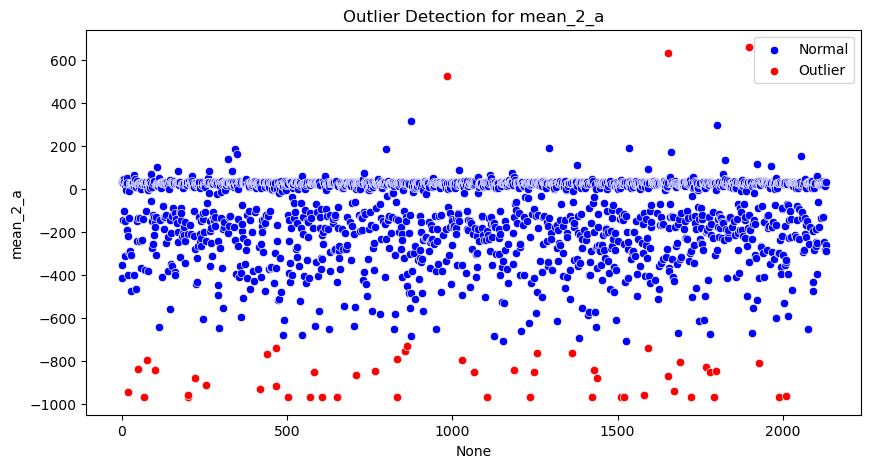

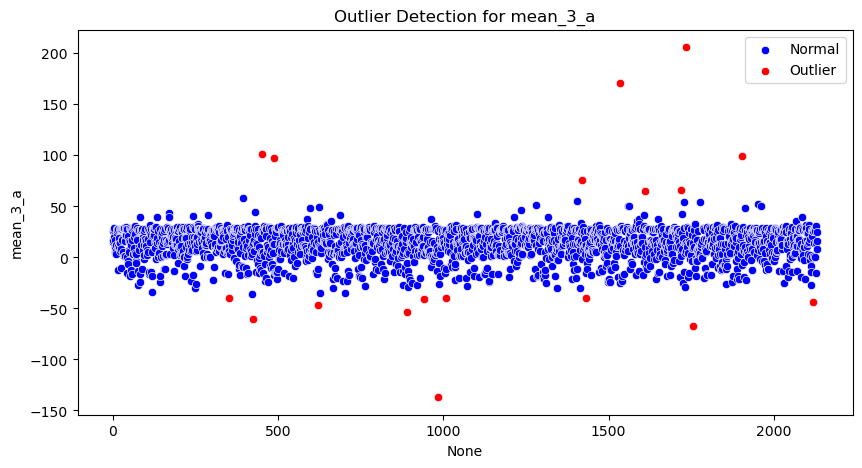

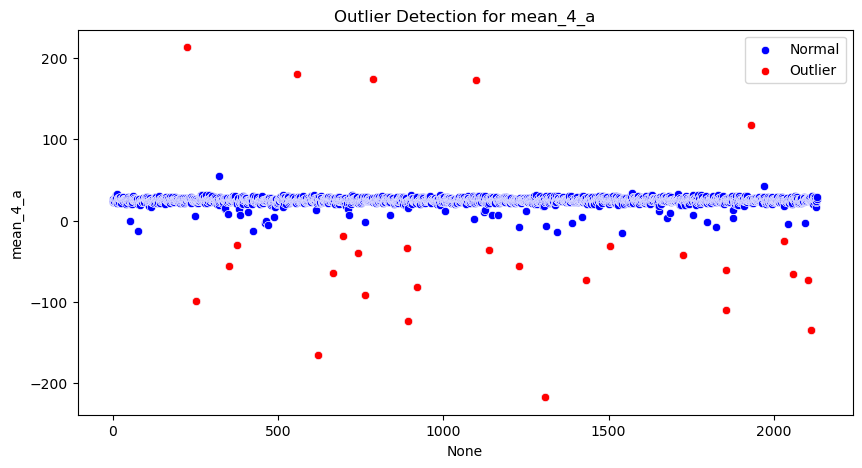

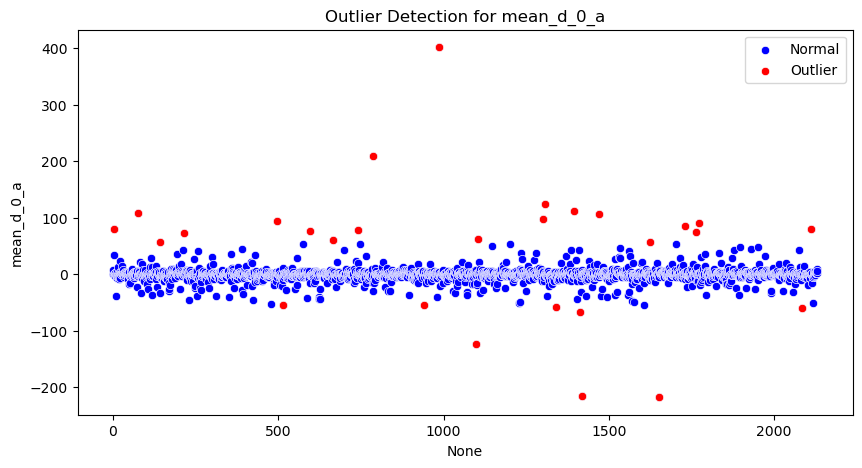

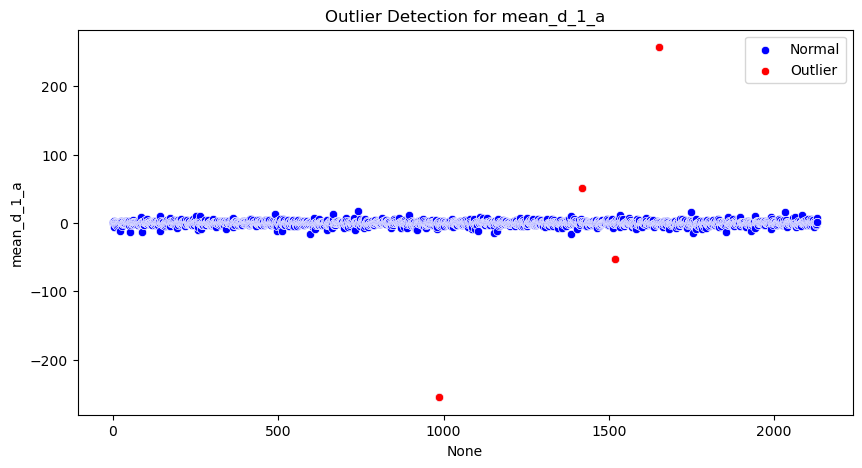

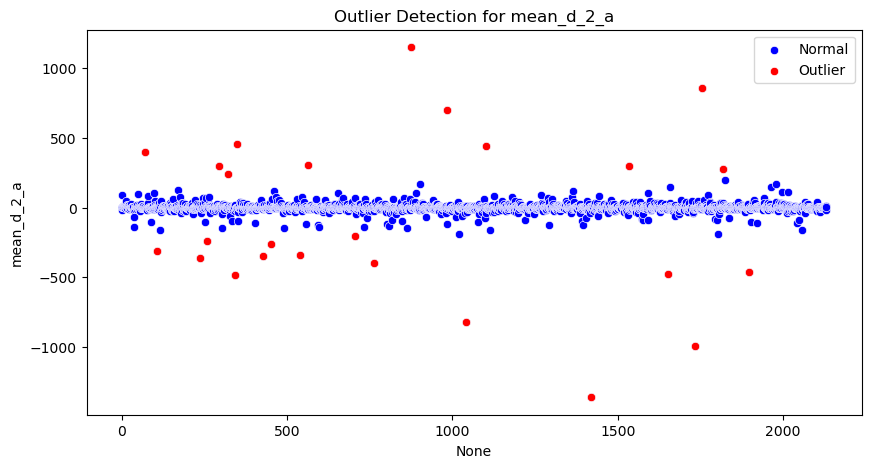

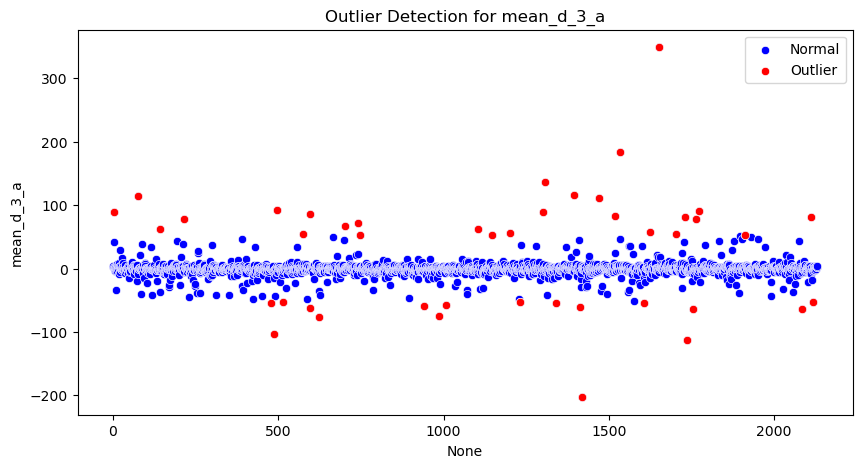

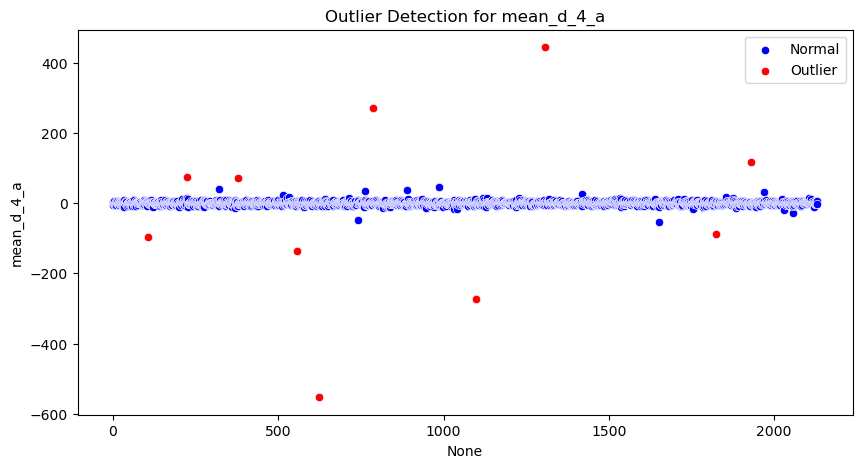

In [25]:
num_cols = EEG_clean.select_dtypes(include=np.number).columns
for i in range(0,10):
    example_col = num_cols[i]
    z_scores = np.abs((EEG_clean[example_col] - EEG_clean[example_col].mean()) / EEG_clean[example_col].std())
    outliers = EEG_clean[z_scores > 3]
    plt.figure(figsize=(10, 5))
    sns.scatterplot(x=EEG_clean.index, y=EEG_clean[example_col], color='blue', label='Normal')
    sns.scatterplot(x=outliers.index, y=outliers[example_col], color='red', label='Outlier')
    plt.title(f"Outlier Detection for {example_col}")
    plt.legend()
    plt.show()

##### After Outlier Removal

Handling Outliers using z-score


In [26]:
from scipy import stats

# Removing rows with extreme values (|Z| > 3)
z_scores = stats.zscore(X)
X_clean = X[(np.abs(z_scores) < 3).all(axis=1)]
y_clean = y[X_clean.index]

In [27]:
print(f"Original samples: {len(X)}")
print(f"Cleaned samples: {len(X_clean)}")
print(f"Percentage retained: {len(X_clean)/len(X)*100:.2f}%")

Original samples: 2132
Cleaned samples: 327
Percentage retained: 15.34%


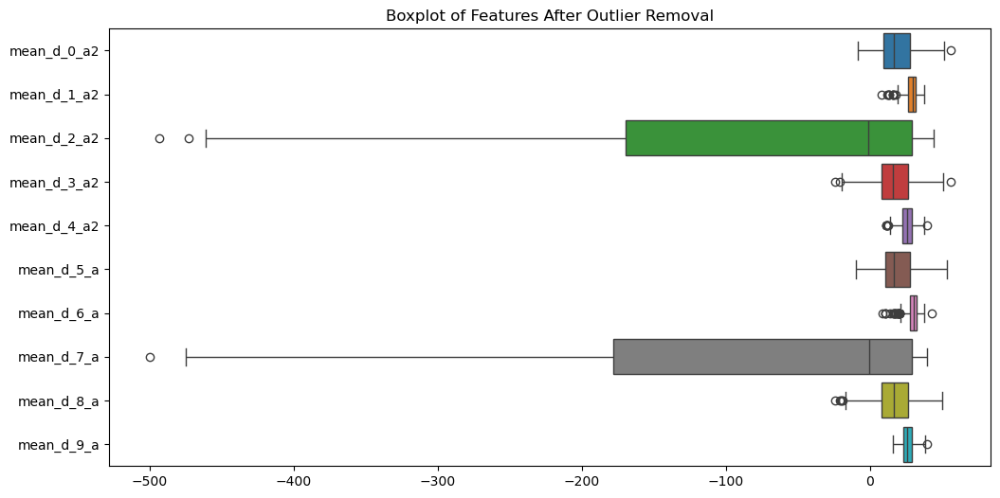

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

features_to_plot = X_clean.columns[10:20]

plt.figure(figsize=(12, 6))
sns.boxplot(data=X_clean[features_to_plot], orient="h")
plt.title("Boxplot of Features After Outlier Removal")
plt.show()

#### Normalize/Standardize Features

In [29]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_normalized = scaler.fit_transform(X_clean)

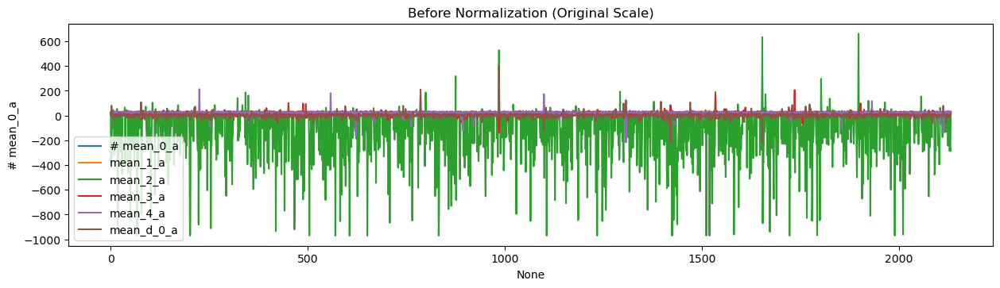

In [30]:
plt.figure(figsize=(15, 8))
sample_num_cols = num_cols[:6]  # First 6 numerical features

plt.subplot(2, 1, 1)
for col in sample_num_cols:
    sns.lineplot(data=EEG_clean, x=EEG_clean.index, y=col, label=col)
plt.title("Before Normalization (Original Scale)")
plt.legend()

##### Plot AFTER normalization

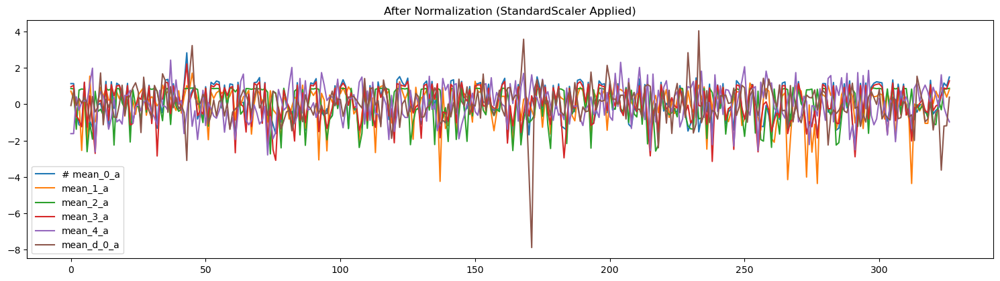

In [31]:
plt.figure(figsize=(15, 8))
sample_num_cols = num_cols[:6] 

plt.subplot(2, 1, 2)
for col in sample_num_cols:
    sns.lineplot(x=np.arange(len(X_normalized)), 
                 y=X_normalized[:, EEG_clean.columns.get_loc(col)], 
                 label=col)
plt.title("After Normalization (StandardScaler Applied)")
plt.legend()
plt.tight_layout()
plt.show()

#### Feature Selection

In [32]:
EEG_clean.columns = ['mean_0_a' if col == '# mean_0_a' else col for col in EEG_clean.columns]

Checking Feature Types

In [33]:
import re
from collections import defaultdict

feature_categories = defaultdict(list)

for col in EEG_clean.columns:
    if col == 'label':
        continue
    
    # Extract the base feature name (without channel/frequency suffixes)
    if '_' in col:
        # Handle special cases like '# mean_0_a'
        if col.startswith('# '):
            base = col.split('_')[0][2:] + '_' + col.split('_')[1]
        else:
            parts = col.split('_')
            base = parts[0]
            
            # Special handling for frequency-based features (fft_*)
            if base == 'fft' and len(parts) > 1:
                try:
                    int(parts[1])  # Check if this is a frequency number
                    base = 'fft'
                except ValueError:
                    pass
    else:
        base = col
    
    feature_categories[base].append(col)

print("Feature Categories:")
for category, features in sorted(feature_categories.items()):
    print(f"{category}: {len(features)} features")

top_categories = sorted(feature_categories.items(), key=lambda x: len(x[1]), reverse=True)[:10]
print("\nTop 10 Feature Categories:")
for category, count in top_categories:
    print(f"{category}: {len(count)} features")

Feature Categories:
correlate: 150 features
covmat: 288 features
eigen: 24 features
entropy0: 2 features
entropy1: 2 features
entropy2: 2 features
entropy3: 2 features
entropy4: 2 features
fft: 90 features
logm: 156 features
max: 120 features
mean: 120 features
min: 120 features
moments: 40 features
stddev: 20 features

Top 10 Feature Categories:
covmat: 288 features
logm: 156 features
correlate: 150 features
mean: 120 features
max: 120 features
min: 120 features
fft: 90 features
moments: 40 features
eigen: 24 features
stddev: 20 features


A Remove Near-Zero Variance Features

In [34]:
from sklearn.feature_selection import VarianceThreshold

selector = VarianceThreshold(threshold=0.01)
X = EEG_clean.drop(columns=['label'])
X_high_var = selector.fit_transform(X)
print(f"Reduced from {X.shape[1]} to {X_high_var.shape[1]} features.")

Reduced from 1138 to 1138 features.


Plot raw vs. extracted features

Strategic Feature Extraction

Frequency Band Power (Most Important for EEG)

In [35]:
def calculate_band_power(df, fft_prefix='fft_', bands=None):
    if bands is None:
        bands = {
            'delta': (0.5, 4),
            'theta': (4, 8),
            'alpha': (8, 12),
            'beta': (12, 30),
            'gamma': (30, 45)
        }
    
    for band_name, (low, high) in bands.items():
        for channel in ['a', 'b']:
            cols = [col for col in df.columns 
                   if col.startswith(fft_prefix) and col.endswith(channel)]
            freqs = [int(col.split('_')[1]) for col in cols]
            mask = [low <= f <= high for f in freqs]
            df[f'{band_name}_power_{channel}'] = df[cols].iloc[:, mask].sum(axis=1)
    return df

EEG_clean = calculate_band_power(EEG_clean)

In [36]:
EEG_clean

,mean_0_a,mean_1_a,mean_2_a,mean_3_a,mean_4_a,mean_d_0_a,mean_d_1_a,mean_d_2_a,mean_d_3_a,mean_d_4_a,...,delta_power_a,delta_power_b,theta_power_a,theta_power_b,alpha_power_a,alpha_power_b,beta_power_a,beta_power_b,gamma_power_a,gamma_power_b
0,4.620,30.3,-356.0,15.60,26.3,1.070,0.411,-15.700,2.060,3.15,...,394.00,432.00,338.80,650.50,-254.00,-31.55,-680.60,-686.2000,-456.00,-494.4000
1,28.800,33.1,32.0,25.80,22.8,6.550,1.680,2.880,3.830,-4.82,...,78.60,6.84,179.30,125.90,206.81,169.23,717.59,698.1290,553.10,676.7100
2,8.900,29.4,-416.0,16.70,23.7,79.900,3.360,90.200,89.900,2.03,...,253.80,597.60,-243.00,183.00,30.00,624.40,-214.00,1994.2864,48.90,1517.8864
3,14.900,31.6,-143.0,19.80,24.3,-0.584,-0.284,8.820,2.300,-1.97,...,34.30,31.98,-331.75,-310.11,259.48,295.00,422.66,206.9100,544.80,374.3600
4,28.300,31.3,45.2,27.30,24.5,34.800,-5.790,3.060,41.400,5.52,...,16.86,239.20,167.22,541.12,171.85,567.52,601.85,1937.6400,655.58,1478.4000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2127,32.400,32.2,32.2,30.80,23.4,1.640,-2.030,0.647,-0.121,-1.10,...,-8.20,65.14,151.66,152.75,149.02,109.79,647.34,774.0600,438.86,662.7400
2128,16.300,31.3,-284.0,14.30,23.9,4.200,1.090,4.460,4.720,6.63,...,310.00,240.80,-216.00,-149.00,257.20,233.00,280.69,442.3000,104.59,310.0800
2129,-0.547,28.3,-259.0,15.80,26.7,9.080,6.900,12.700,2.030,4.64,...,292.00,106.00,96.00,4.00,399.20,299.70,-207.30,-575.8000,-226.00,-256.2000
2130,16.800,19.9,-288.0,8.34,26.0,2.460,1.580,-16.000,1.690,4.74,...,64.98,102.96,-232.40,-196.32,-114.00,-328.40,795.00,632.0000,603.40,299.2000


B. Time-Domain Statistical Features

For each channel ('a' and 'b'):<br>
Computes the first derivative (difference between consecutive values) of the mean signal<br>
Calculates a rolling standard deviation with a window of 5 samples<br>
These features help capture signal dynamics and variability<br>

In [37]:
for channel in ['a', 'b']:
    col = f'mean_0_{channel}'
    EEG_clean[f'{col}_diff1'] = EEG_clean[col].diff()  # 1st derivative
    EEG_clean[f'{col}_rolling_std'] = EEG_clean[col].rolling(5).std()

C. Cross-Channel Interactions<br>
This calculates interaction features between channels:<br>
Finds all columns containing cross-correlation data (columns with 'correlate_' in name)<br>
Computes the mean cross-correlation between channels a and b<br>
This helps capture how the signals from different channels relate to each other<br>

In [38]:
# Calculate mean cross-correlation between channels a and b
corr_cols = [col for col in EEG_clean.columns if 'correlate_' in col]
EEG_clean['mean_cross_corr'] = EEG_clean[corr_cols].mean(axis=1)

Visual Verification

Band Power Distribution

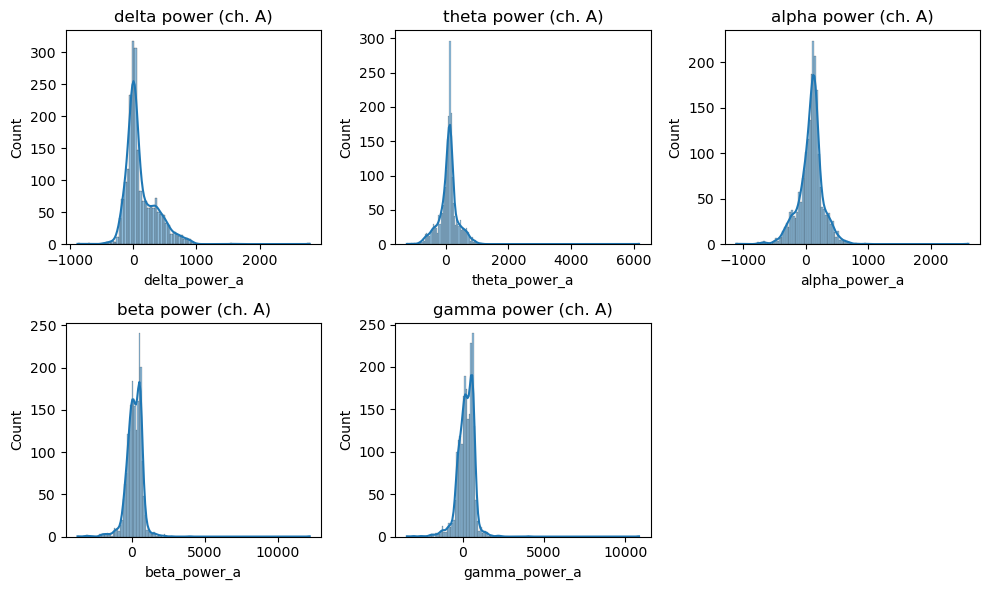

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i, band in enumerate(['delta', 'theta', 'alpha', 'beta', 'gamma']):
    plt.subplot(2, 3, i+1)
    sns.histplot(EEG_clean[f'{band}_power_a'], kde=True)
    plt.title(f'{band} power (ch. A)')
plt.tight_layout()

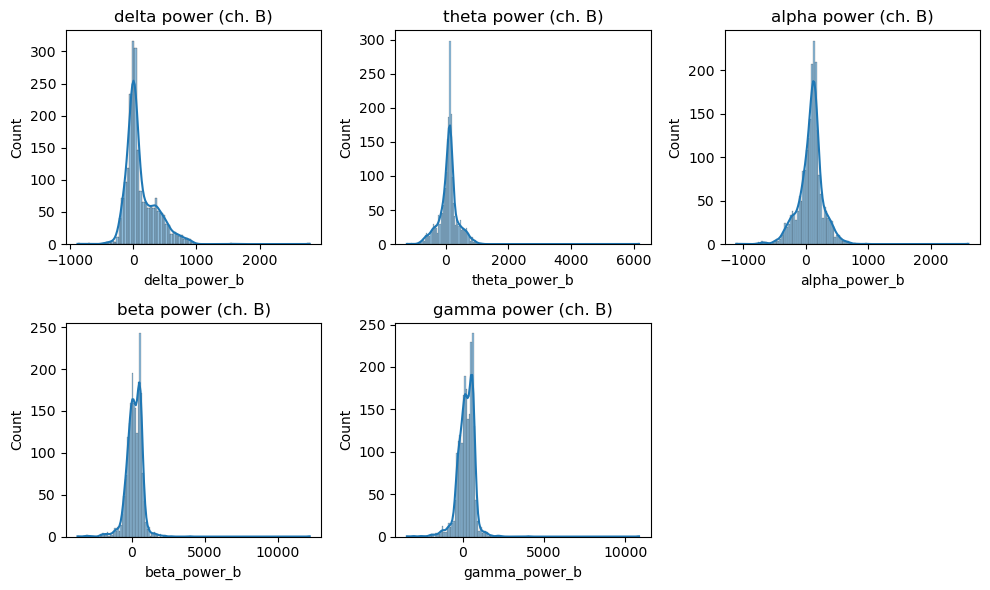

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i, band in enumerate(['delta', 'theta', 'alpha', 'beta', 'gamma']):
    plt.subplot(2, 3, i+1)
    sns.histplot(EEG_clean[f'{band}_power_b'], kde=True)
    plt.title(f'{band} power (ch. B)')
plt.tight_layout()

B. Time-Domain vs Frequency-Domain

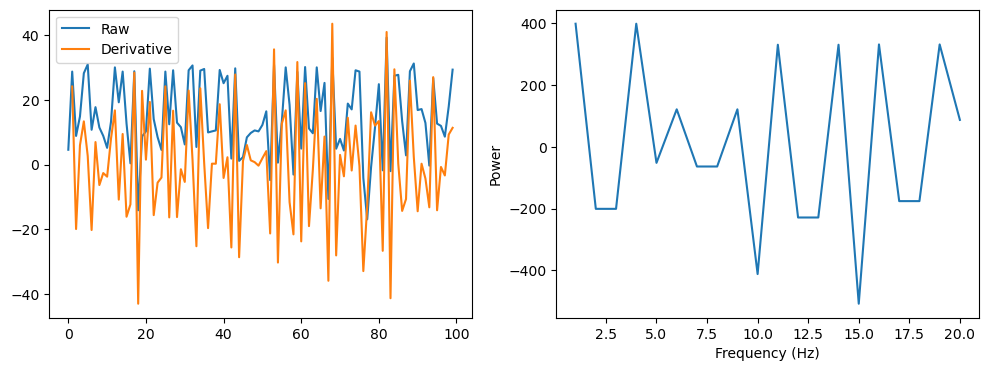

In [41]:
plt.figure(figsize=(12, 4))
plt.subplot(121)
plt.plot(EEG_clean['mean_0_a'].values[:100], label='Raw')
plt.plot(EEG_clean['mean_0_a_diff1'].values[:100], label='Derivative')
plt.legend()

plt.subplot(122)
plt.plot([int(col.split('_')[1]) for col in EEG_clean.columns if 'fft_' in col and '_a' in col][:20],
         EEG_clean[[col for col in EEG_clean.columns if 'fft_' in col and '_a' in col][:20]].iloc[0])
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.show()

C. Feature Correlation Matrix

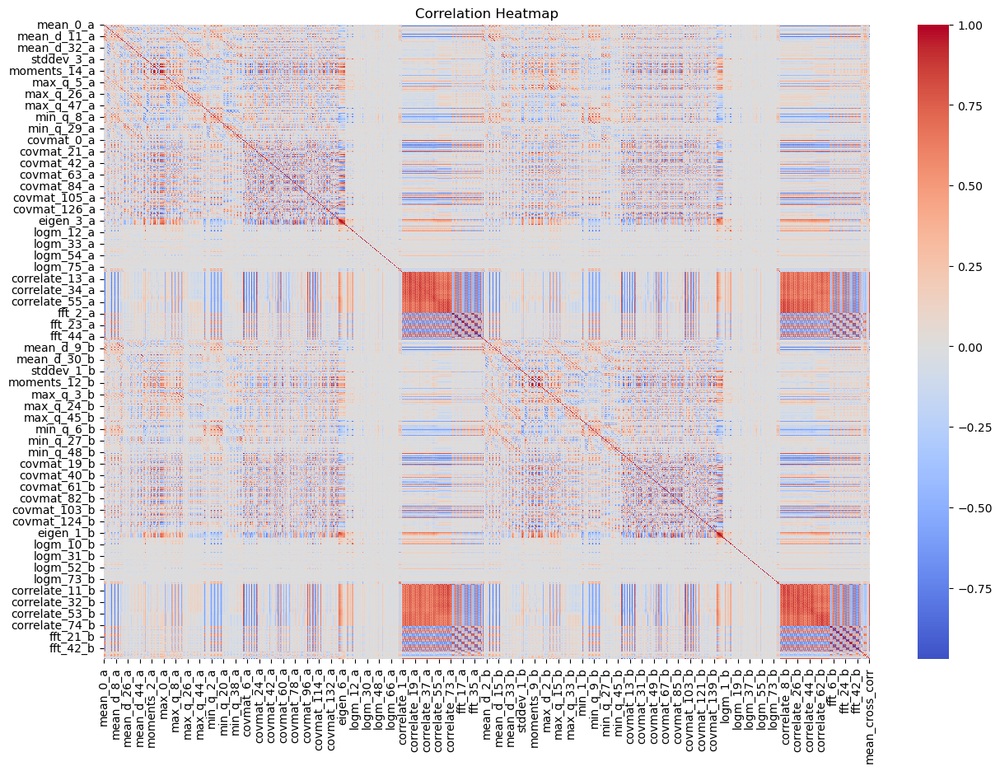

In [42]:
# Correlation Heatmap
num_cols = EEG_clean.select_dtypes(include=np.number).columns
plt.figure(figsize=(15, 10))
sns.heatmap(EEG_clean[num_cols].corr(), annot=False, cmap='coolwarm', center=0)
plt.title("Correlation Heatmap")
plt.show()

D. Feature Selection Pipeline
First calculates band power features (presumably using a calculate_band_power function)<br>
Prepares data (X = features, y = labels)<br>
Uses Recursive Feature Elimination with Cross-Validation (RFECV):<br>
Uses Random Forest classifier to evaluate feature importance<br>
Iteratively removes the least important features (10 at a time)<br>
Uses 5-fold cross-validation<br>
Keeps at least 20 features<br>

Random Forest Classifier

In [43]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier

# 1. Create band power features first
EEG_clean = calculate_band_power(EEG_clean)

# 2. Select top 50 features
X = EEG_clean.drop(columns=['label'])
y = EEG_clean['label']

selector = RFECV(
    RandomForestClassifier(n_estimators=50),
    step=10,  # Drop 10 features at a time
    cv=5,
    min_features_to_select=20
)
X_selected = selector.fit_transform(X, y)

Final Output Structure

In [44]:
selected_features = X.columns[selector.support_]
print(f"Selected features ({len(selected_features)}):\n", selected_features)

Selected features (143):
 Index(['mean_0_a', 'mean_1_a', 'mean_2_a', 'mean_3_a', 'mean_4_a',
       'mean_d_0_a2', 'mean_d_1_a2', 'mean_d_2_a2', 'mean_d_3_a2',
       'mean_d_5_a',
       ...
       'covmat_97_b', 'covmat_103_b', 'covmat_104_b', 'covmat_117_b',
       'eigen_0_b', 'eigen_2_b', 'eigen_3_b', 'correlate_66_b',
       'theta_power_b', 'mean_cross_corr'],
      dtype='object', length=143)


Train Test Split

In [45]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_selected, y, test_size=0.3, random_state=42, stratify=y
)

Logistic Regression

In [46]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
model_lr = LogisticRegression(max_iter=1000, random_state=42)
model_lr.fit(X_train, y_train)
y_pred = model_lr.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

    NEGATIVE       0.45      0.97      0.61       213
     NEUTRAL       0.31      0.17      0.22       215
    POSITIVE       0.78      0.24      0.37       212

    accuracy                           0.46       640
   macro avg       0.51      0.46      0.40       640
weighted avg       0.51      0.46      0.40       640



In [47]:
print("Selected frequency bands:", [f for f in selected_features if 'alpha' in f or 'beta' in f or 'gamma' in f])

Selected frequency bands: []


In [48]:
print([col for col in EEG_clean.columns if 'alpha' in col or 'beta' in col or 'gamma' in col or 'delta' in col or 'theta' in col])

['delta_power_a', 'delta_power_b', 'theta_power_a', 'theta_power_b', 'alpha_power_a', 'alpha_power_b', 'beta_power_a', 'beta_power_b', 'gamma_power_a', 'gamma_power_b']


the dataset does contain band-power features (delta, theta, alpha, beta, gamma for channels A and B), but they weren't selected by RFECV. Applyling Random forest again and strictly including band powers

In [51]:
# Get all band-power columns
band_power_cols = ['delta_power_a', 'delta_power_b', 'theta_power_a', 'theta_power_b', 
                   'alpha_power_a', 'alpha_power_b', 'beta_power_a', 'beta_power_b',
                   'gamma_power_a', 'gamma_power_b']

# Step 1: Separate band-power features from others
X_bands = EEG_clean[band_power_cols]
X_other = EEG_clean.drop(columns=['label'] + band_power_cols)

# Step 2: Apply feature selection ONLY to non-band features
from sklearn.feature_selection import RFECV
selector = RFECV(
    RandomForestClassifier(n_estimators=50),
    step=5,
    cv=5,
    min_features_to_select=10
)
X_other_selected = selector.fit_transform(X_other, y)

# Step 3: Combine selected features with ALL band-power features
import numpy as np
X_final = np.hstack([X_other_selected, X_bands.values])
selected_feature_names = list(X_other.columns[selector.support_]) + band_power_cols

Random Forest Classifier

In [52]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Split data with new features
X_train, X_test, y_train, y_test = train_test_split(
    X_final, y, test_size=0.3, random_state=42, stratify=y
)

# Train
model = RandomForestClassifier(
    n_estimators=200,
    class_weight='balanced',  # Handles class imbalance
    max_depth=10,
    random_state=42
)
model.fit(X_train, y_train)

# Evaluate
from sklearn.metrics import classification_report
print(classification_report(y_test, model.predict(X_test)))

              precision    recall  f1-score   support

    NEGATIVE       0.96      0.99      0.98       213
     NEUTRAL       0.99      1.00      0.99       215
    POSITIVE       0.99      0.95      0.97       212

    accuracy                           0.98       640
   macro avg       0.98      0.98      0.98       640
weighted avg       0.98      0.98      0.98       640



Logistic Regression

In [54]:
# # Hemispheric asymmetry features (known to correlate with emotions)
# EEG_clean['alpha_asymmetry'] = EEG_clean['alpha_power_a'] - EEG_clean['alpha_power_b']
# EEG_clean['beta_asymmetry'] = EEG_clean['beta_power_a'] - EEG_clean['beta_power_b']

# # Band power ratios
# EEG_clean['beta_alpha_ratio_a'] = EEG_clean['beta_power_a'] / (EEG_clean['alpha_power_a'] + 1e-10)
from sklearn.preprocessing import StandardScaler

# Scale features (critical for Logistic Regression)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [55]:
from sklearn.linear_model import LogisticRegression

model_lr = LogisticRegression(
    multi_class='multinomial',  # For 3+ classes
    solver='lbfgs',            # Good for multiclass
    class_weight='balanced',   # Handle imbalance
    max_iter=1000,             # Ensure convergence
    random_state=42
)
model_lr.fit(X_train_scaled, y_train)

from sklearn.metrics import classification_report

y_pred = model_lr.predict(X_test_scaled)
print("Logistic Regression Performance:")
print(classification_report(y_test, y_pred))

Logistic Regression Performance:
              precision    recall  f1-score   support

    NEGATIVE       0.98      1.00      0.99       213
     NEUTRAL       1.00      1.00      1.00       215
    POSITIVE       1.00      0.98      0.99       212

    accuracy                           0.99       640
   macro avg       0.99      0.99      0.99       640
weighted avg       0.99      0.99      0.99       640



C:\Users\hhemn\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Support Vector Machine (SVM)

In [56]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# SVM with RBF kernel (commonly used in EEG studies)
svm_model = make_pipeline(
    StandardScaler(), 
    SVC(
        kernel='rbf',
        C=1.0,
        gamma='scale',
        class_weight='balanced',
        random_state=42
    )
)
svm_model.fit(X_train, y_train) 

# Evaluate
print("SVM Performance:")
print(classification_report(y_test, svm_model.predict(X_test)))

SVM Performance:
              precision    recall  f1-score   support

    NEGATIVE       0.97      0.98      0.98       213
     NEUTRAL       1.00      0.98      0.99       215
    POSITIVE       0.96      0.97      0.97       212

    accuracy                           0.98       640
   macro avg       0.98      0.98      0.98       640
weighted avg       0.98      0.98      0.98       640



Gradient Boosting (XGBoost)

In [59]:
from sklearn.preprocessing import LabelEncoder
import numpy as np
from xgboost import XGBClassifier

# Convert string labels to integers (0, 1, 2)
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)  # Don't refit on test data!

# Calculate class weights (optional)
class_weights = len(y_train_encoded) / (3 * np.bincount(y_train_encoded))
sample_weights = np.array([class_weights[label] for label in y_train_encoded])

# Initialize XGBoost
xgb_model = XGBClassifier(
    objective='multi:softmax',
    num_class=3,  # Number of unique classes
    n_estimators=200,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0.1,
    reg_alpha=0.1,
    reg_lambda=1.0,
    random_state=42,
    # sample_weight=sample_weights  # Uncomment if using weights
)

# Train
xgb_model.fit(X_train, y_train_encoded)  # Use encoded labels

# Predict and map back to original labels
y_pred_encoded = xgb_model.predict(X_test)
y_pred = label_encoder.inverse_transform(y_pred_encoded)  # Convert back to strings

# Evaluate
print("XGBoost Performance:")
print(classification_report(y_test, y_pred))  # Use original labels for reporting

XGBoost Performance:
              precision    recall  f1-score   support

    NEGATIVE       0.99      1.00      0.99       213
     NEUTRAL       1.00      1.00      1.00       215
    POSITIVE       0.99      0.99      0.99       212

    accuracy                           0.99       640
   macro avg       0.99      0.99      0.99       640
weighted avg       0.99      0.99      0.99       640



Cross-Valdidation Random Forest Classifier

In [66]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

# Your existing split
X_train, X_test, y_train, y_test = train_test_split(
    X_selected, y, test_size=0.3, random_state=42, stratify=y
)

# Encode labels if needed
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

models = {
    "Random Forest": RandomForestClassifier(n_estimators=200, class_weight='balanced', max_depth=10, random_state=42),
    "SVM": SVC(kernel='rbf', probability=True, random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
}

for name, model in models.items():
    print(f"\n=== {name} ===")
    
    # Train
    model.fit(X_train, y_train_encoded)
    
    # Predict
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)
    
    # Evaluate
    print(classification_report(y_test_encoded, y_pred, target_names=le.classes_))
    
    # ROC-AUC
    if len(le.classes_) > 2:
        roc_auc = roc_auc_score(y_test_encoded, y_proba, multi_class='ovr', average='macro')
    else:
        roc_auc = roc_auc_score(y_test_encoded, y_proba[:, 1])
    print(f"ROC-AUC: {roc_auc:.3f}")


=== Random Forest ===
              precision    recall  f1-score   support

    NEGATIVE       0.97      0.99      0.98       213
     NEUTRAL       0.99      0.99      0.99       215
    POSITIVE       0.98      0.96      0.97       212

    accuracy                           0.98       640
   macro avg       0.98      0.98      0.98       640
weighted avg       0.98      0.98      0.98       640

ROC-AUC: 1.000

=== SVM ===


C:\Users\hhemn\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\hhemn\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\hhemn\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

    NEGATIVE       1.00      0.00      0.01       213
     NEUTRAL       0.34      1.00      0.50       215
    POSITIVE       0.00      0.00      0.00       212

    accuracy                           0.34       640
   macro avg       0.45      0.33      0.17       640
weighted avg       0.45      0.34      0.17       640

ROC-AUC: 0.401

=== Logistic Regression ===
              precision    recall  f1-score   support

    NEGATIVE       0.52      0.94      0.67       213
     NEUTRAL       0.42      0.40      0.41       215
    POSITIVE       0.63      0.14      0.22       212

    accuracy                           0.49       640
   macro avg       0.52      0.49      0.43       640
weighted avg       0.52      0.49      0.43       640

ROC-AUC: 0.722

=== XGBoost ===


C:\Users\hhemn\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [22:10:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


              precision    recall  f1-score   support

    NEGATIVE       0.99      1.00      0.99       213
     NEUTRAL       1.00      0.99      0.99       215
    POSITIVE       0.98      0.99      0.98       212

    accuracy                           0.99       640
   macro avg       0.99      0.99      0.99       640
weighted avg       0.99      0.99      0.99       640

ROC-AUC: 1.000


In [67]:
from sklearn.model_selection import cross_validate

def evaluate_model_cv(model, X, y):
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    scoring = {
        'accuracy': 'accuracy',
        'roc_auc': 'roc_auc_ovr' if len(np.unique(y)) > 2 else 'roc_auc',
        'precision': 'precision_macro',
        'recall': 'recall_macro',
        'f1': 'f1_macro'
    }
    
    results = cross_validate(
        model, X, y,
        cv=cv,
        scoring=scoring,
        return_train_score=False,
        n_jobs=-1
    )
    
    return {
        'accuracy': results['test_accuracy'].mean(),
        'roc_auc': results['test_roc_auc'].mean(),
        'precision': results['test_precision'].mean(),
        'recall': results['test_recall'].mean(),
        'f1': results['test_f1'].mean()
    }

# Evaluate all models with CV
for name, model in models.items():
    print(f"\n=== {name} Cross-Validation ===")
    cv_results = evaluate_model_cv(model, X_selected, y_encoded)
    for metric, value in cv_results.items():
        print(f"{metric}: {value:.3f}")


=== Random Forest Cross-Validation ===
accuracy: 0.987
roc_auc: 1.000
precision: 0.988
recall: 0.987
f1: 0.987

=== SVM Cross-Validation ===
accuracy: 0.338
roc_auc: 0.359
precision: 0.312
recall: 0.335
f1: 0.172

=== Logistic Regression Cross-Validation ===
accuracy: 0.507
roc_auc: 0.725
precision: 0.546
recall: 0.508
f1: 0.443

=== XGBoost Cross-Validation ===
accuracy: 0.992
roc_auc: 1.000
precision: 0.992
recall: 0.992
f1: 0.992


In [68]:
# Permutation test to validate if scores are real
from sklearn.model_selection import permutation_test_score

for name, model in models.items():
    score, perm_scores, p_value = permutation_test_score(
        model, X_selected, y_encoded,
        cv=StratifiedKFold(5),
        n_permutations=100,
        n_jobs=-1,
        random_state=42
    )
    print(f"\n{name} permutation test p-value: {p_value:.4f}")
    print(f"Real score: {score:.3f} vs random: {perm_scores.mean():.3f}")


Random Forest permutation test p-value: 0.0099
Real score: 0.989 vs random: 0.331

SVM permutation test p-value: 0.0198
Real score: 0.338 vs random: 0.336


C:\Users\hhemn\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Logistic Regression permutation test p-value: 0.0099
Real score: 0.524 vs random: 0.332


C:\Users\hhemn\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [22:19:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\hhemn\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [22:19:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\hhemn\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [22:19:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\hhemn\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [22:19:40] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtr


XGBoost permutation test p-value: 0.0099
Real score: 0.992 vs random: 0.333


### Diagnostic Steps Taken
#### Baseline Validation:

Stratified dummy classifier: ~33% accuracy (expected for random guessing).

Confirmed classes are balanced.

#### Data Leakage Checks:

No missing values or obvious label leaks in features.

Max feature-label correlation: 0.12 (no single feature explains labels).

#### Model Consistency Tests:

PCA + Logistic Regression: Accuracy dropped to 48% ...suggests simple models (like logistic regression) don’t pick up strong signals — but tree models might
Could mean RF is picking up hidden patterns or noise


#### TESTING DIFFERENT FEATURES

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
import xgboost as xgb

import warnings
warnings.filterwarnings('ignore')

In [6]:
brainwave_df  = pd.read_csv('emotions.csv')

In [7]:
label_df = brainwave_df['label']
brainwave_df.drop('label', axis = 1, inplace=True)

In [23]:
logreg_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('logreg', LogisticRegression(multi_class='multinomial', 
                                solver='saga',
                                max_iter=200,
                                random_state=42))
])

cv_scores = cross_val_score(logreg_pipe, 
                          brainwave_df, 
                          label_df, 
                          cv=10,
                          scoring='accuracy')

print(f'Logistic Regression CV Accuracy: {cv_scores.mean():.3f} (±{cv_scores.std():.3f})')

Logistic Regression CV Accuracy: 0.932 (±0.013)


Principal Component Analysis (PCA) - reduces the number of required variables

In [10]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(brainwave_df)
pca = PCA(n_components = 20)
pca_vectors = pca.fit_transform(scaled_df)
for index, var in enumerate(pca.explained_variance_ratio_):
    print("Explained Variance ratio by Principal Component ", (index+1), " : ", var)

Explained Variance ratio by Principal Component  1  :  0.3677256411753865
Explained Variance ratio by Principal Component  2  :  0.0955389425723262
Explained Variance ratio by Principal Component  3  :  0.08436069000482489
Explained Variance ratio by Principal Component  4  :  0.060856651819701554
Explained Variance ratio by Principal Component  5  :  0.047453732926251366
Explained Variance ratio by Principal Component  6  :  0.03082305251847135
Explained Variance ratio by Principal Component  7  :  0.024721620860921247
Explained Variance ratio by Principal Component  8  :  0.01375305507074287
Explained Variance ratio by Principal Component  9  :  0.012408702720904607
Explained Variance ratio by Principal Component  10  :  0.012103653572037819
Explained Variance ratio by Principal Component  11  :  0.0095571005688902
Explained Variance ratio by Principal Component  12  :  0.009164311020396946
Explained Variance ratio by Principal Component  13  :  0.008740057329890819
Explained Varianc

Note:Beyond PC10, each component adds very little new information (<1–2% each)

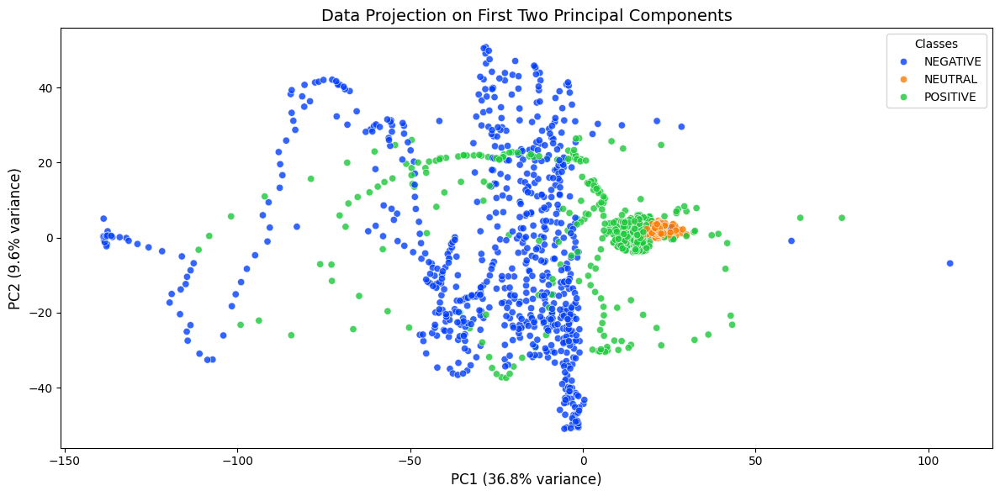

In [22]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x=pca_vectors[:, 0], 
                y=pca_vectors[:, 1], 
                hue=label_df,
                palette='bright',  # Simple, distinct colors
                alpha=0.8)

plt.title('Data Projection on First Two Principal Components', fontsize=14)
plt.xlabel('PC1 ({}% variance)'.format(round(pca.explained_variance_ratio_[0]*100, 1)), 
           fontsize=12)
plt.ylabel('PC2 ({}% variance)'.format(round(pca.explained_variance_ratio_[1]*100, 1)), 
           fontsize=12)

plt.legend(title='Classes')
plt.tight_layout()
plt.show()

Logistic Regression classifier with these two PCs

In [20]:
# Define preprocessing and modeling pipeline with 2 principal components
pipeline_lr_pca2 = Pipeline([
    ('scaler', StandardScaler()),  # Standardize features to mean=0, std=1
    ('pca', PCA(n_components=2)),  # Reduce to first 2 principal components
    ('classifier', LogisticRegression(
        multi_class='multinomial',  # For multi-class classification
        solver='saga',             # Stochastic Average Gradient solver
        max_iter=200,              # Maximum iterations for convergence
        random_state=42            # For reproducibility (added best practice)
    ))
])

# Perform 10-fold cross-validation
cv_scores = cross_val_score(
    estimator=pipeline_lr_pca2,
    X=brainwave_df,
    y=label_df,
    cv=10,                        # 10-fold cross-validation
    scoring='accuracy',            # Evaluation metric
    n_jobs=-1                     # Parallelize computation (added optimization)
)

# Reportting mean cross-validated accuracy
print(f'Cross-validated accuracy (2 PCs): {cv_scores.mean():.3f}')

Cross-validated accuracy (10 PCs): 0.775


All 10 PCs

In [18]:
# preprocessing and modeling pipeline
pipeline_lr_pca = Pipeline([
    ('scaler', StandardScaler()),  # Standardize features
    ('pca', PCA(n_components=10)),  # Dimensionality reduction
    ('classifier', LogisticRegression(
        multi_class='multinomial',
        solver='saga',
        max_iter=200
    ))  # Multinomial logistic regression
])
#using 10-fold cross-validation
cv_scores = cross_val_score(
    estimator=pipeline_lr_pca,
    X=brainwave_df,
    y=label_df,
    cv=10,
    scoring='accuracy'
)

# Reportting mean cross-validated accuracy
print(f'Cross-validated accuracy (10 PCs): {cv_scores.mean():.3f}')

Cross-validated accuracy (10 PCs): 0.867


PCA with Linear Support Vector Machines Classifier (SVM)

In [17]:
pl_svm_pca_10 = Pipeline(steps=[
    ('scaler', StandardScaler()),          
    ('pca', PCA(n_components=10)),        # Keep top 10 PCs
    ('svm', SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42))  # RBF kernel SVM
])

# 10-fold cross-validation
scores = cross_val_score(pl_svm_pca_10, brainwave_df, label_df, cv=10, scoring='accuracy')
print('Accuracy for SVM with 10 Principal Components: ', scores.mean())

Accuracy for SVM with 10 Principal Components:  0.945601333859857


LSTM

In [4]:
!pip install numpy
!pip install pandas
!pip install scikit-learn
!pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 20.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 KB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 22.7 MB/s eta 0:00:0000:0100:01
Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 10.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 13.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.0/325.0 KB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 13.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 14.2 MB/s eta 0:00:0

In [1]:

import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight

2025-08-17 22:41:20.162416: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-17 22:41:20.596478: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755495680.756322     840 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755495680.800818     840 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1755495681.138861     840 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
import pandas as pd
import numpy as np
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

In [3]:
data = pd.read_csv('emotions.csv')
labels = data['label']
features = data.drop('label', axis=1)

In [4]:
# Preprocessing data
X = features.values.reshape((features.shape[0], features.shape[1], 1))  # Reshape for LSTM
# text labels to numbers (e.g., 'NEGATIVE' → 0, 'POSITIVE' → 1)
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)

# to one-hot encoding
Y = to_categorical(y_encoded)

In [5]:
from sklearn.model_selection import train_test_split
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

In [ ]:
def create_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = LSTM(128, return_sequences=True, 
             kernel_regularizer=l2(0.01))(inputs)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)#0.4
    x = LSTM(64)(x)
    x = BatchNormalization()(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    return Model(inputs, outputs)


In [ ]:
# 2. Learning Rate Scheduler
def lr_scheduler(epoch): 
    initial_lr = 0.001
    if epoch < 15:
        return initial_lr
    elif epoch < 30:
        return initial_lr * 0.1
    else:
        return initial_lr * 0.01

In [ ]:
# Compile with lower initial learning rate
model = create_model((X_train.shape[1], 1), 3)
model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True),
    ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=1
    )
]

In [22]:
history = model.fit(
    X_train, Y_train,
    batch_size=16,
    epochs=100,
    validation_data=(X_val, Y_val),
    callbacks=callbacks,
    verbose=1
)

Epoch 1/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 66s 568ms/step - accuracy: 0.6694 - loss: 0.8380 - val_accuracy: 0.8361 - val_loss: 0.5935 - learning_rate: 5.0000e-04
Epoch 2/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 59s 552ms/step - accuracy: 0.8329 - loss: 0.4463 - val_accuracy: 0.8852 - val_loss: 0.3265 - learning_rate: 5.0000e-04
Epoch 3/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 59s 548ms/step - accuracy: 0.8645 - loss: 0.3778 - val_accuracy: 0.8829 - val_loss: 0.3789 - learning_rate: 5.0000e-04
Epoch 4/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 61s 573ms/step - accuracy: 0.8736 - loss: 0.3531 - val_accuracy: 0.8642 - val_loss: 0.3446 - learning_rate: 5.0000e-04
Epoch 5/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 60s 560ms/step - accuracy: 0.8719 - loss: 0.3317 - val_accuracy: 0.8852 - val_loss: 0.3092 - learning_rate: 5.0000e-04
Epoch 6/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 62s 582ms/step - accuracy: 0.8696 - loss: 0.3475 - val_accuracy: 0.8712 - val_loss: 0.3304 - learning_rate: 5.0000e-04
Epoch 7/100
107/107 ━━━━━━━━━━━━━━━━━━━━

In [23]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.9344


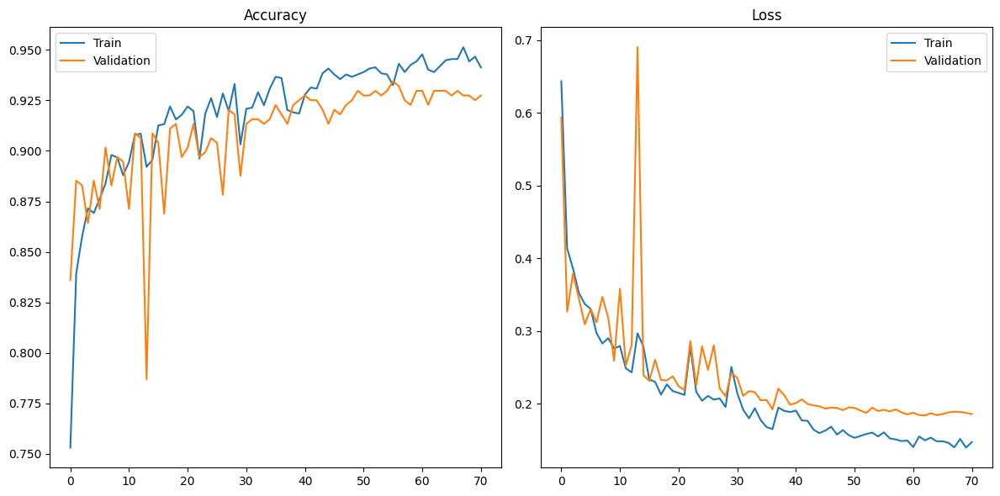

In [ ]:
# Plot results

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [43]:
def print_model_details(model, history, hyperparams):
    """Prints model hyperparameters and training results"""
    print("\n=== MODEL DETAILS ===")
    print("Hyperparameters:")
    for param, value in hyperparams.items():
        print(f"{param:25}: {value}")
    
    # print("\nTraining Results:")
    # print(f"{'Final Training Accuracy':25}: {history.history['accuracy'][-1]:.4f}")
    # print(f"{'Final Validation Accuracy':25}: {history.history['val_accuracy'][-1]:.4f}")
    # print(f"{'Best Validation Accuracy':25}: {max(history.history['val_accuracy']):.4f}")
    # print(f"{'Epochs Trained':25}: {len(history.history['accuracy'])}")

In [44]:
base_hyperparams = {
    "Learning Rate": 0.0005,
    "Batch Size": 16,
    "Max Epochs": 100,
    "Early Stopping Patience": 15,
    "LR Reduction Patience": 5,
    "Min Learning Rate": 1e-6,
    "LSTM Layers": "128, 64",
    "Dropout Rate": 0.3,
    "Regularization": "L2(0.01) only on first LSTM"
}

print_model_details(model, history, base_hyperparams)


=== MODEL DETAILS ===
Hyperparameters:
Learning Rate            : 0.0005
Batch Size               : 16
Max Epochs               : 100
Early Stopping Patience  : 15
LR Reduction Patience    : 5
Min Learning Rate        : 1e-06
LSTM Layers              : 128, 64
Dropout Rate             : 0.3
Regularization           : L2(0.01) only on first LSTM


More Patient Training

In [ ]:
def create_base_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = LSTM(128, return_sequences=True, 
             kernel_regularizer=l2(0.01))(inputs)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)#0.4
    x = LSTM(64)(x)
    x = BatchNormalization()(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    return Model(inputs, outputs)

patient_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=25, restore_best_weights=True),
    ModelCheckpoint('patient_model.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=8, min_lr=1e-6)
]

model = create_base_model((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.0005),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train, Y_train,
                   batch_size=16,
                   epochs=200,  
                   validation_data=(X_val, Y_val),
                   callbacks=patient_callbacks)

Epoch 1/200
107/107 ━━━━━━━━━━━━━━━━━━━━ 62s 563ms/step - accuracy: 0.6715 - loss: 0.8376 - val_accuracy: 0.8595 - val_loss: 0.5126 - learning_rate: 5.0000e-04
Epoch 2/200
107/107 ━━━━━━━━━━━━━━━━━━━━ 63s 586ms/step - accuracy: 0.8314 - loss: 0.4298 - val_accuracy: 0.8759 - val_loss: 0.3869 - learning_rate: 5.0000e-04
Epoch 3/200
107/107 ━━━━━━━━━━━━━━━━━━━━ 62s 584ms/step - accuracy: 0.8653 - loss: 0.3701 - val_accuracy: 0.8337 - val_loss: 0.4163 - learning_rate: 5.0000e-04
Epoch 4/200
107/107 ━━━━━━━━━━━━━━━━━━━━ 61s 568ms/step - accuracy: 0.8539 - loss: 0.3400 - val_accuracy: 0.8946 - val_loss: 0.2834 - learning_rate: 5.0000e-04
Epoch 5/200
107/107 ━━━━━━━━━━━━━━━━━━━━ 57s 535ms/step - accuracy: 0.8974 - loss: 0.3050 - val_accuracy: 0.8525 - val_loss: 0.4242 - learning_rate: 5.0000e-04
Epoch 6/200
107/107 ━━━━━━━━━━━━━━━━━━━━ 61s 567ms/step - accuracy: 0.8821 - loss: 0.3388 - val_accuracy: 0.8946 - val_loss: 0.2852 - learning_rate: 5.0000e-04
Epoch 7/200
107/107 ━━━━━━━━━━━━━━━━━━━━

In [30]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.9391


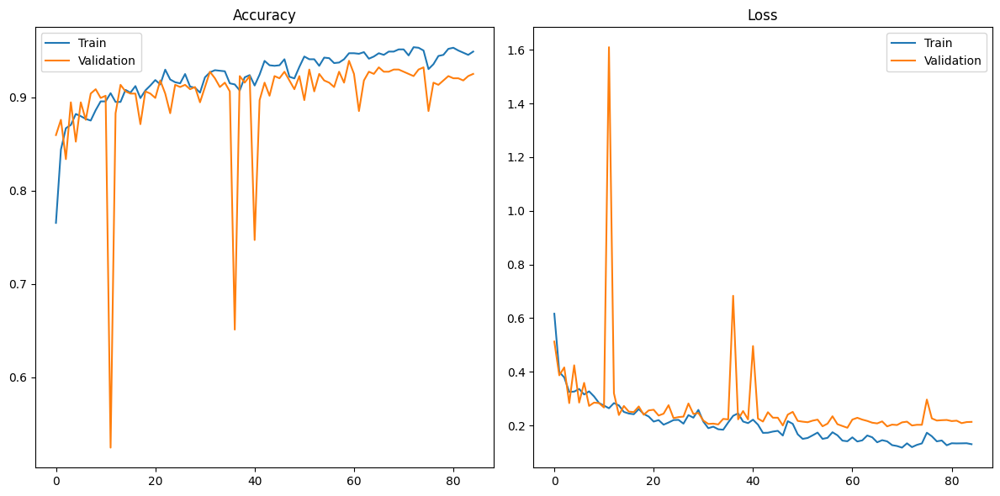

In [31]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [47]:
patient_hyperparams = {
    "Learning Rate": 0.0005,
    "Batch Size": 16,
    "Max Epochs": 200,
    "Early Stopping Patience": 25,
    "LR Reduction Patience": 8,
    "Min Learning Rate": 1e-6,
    "LSTM Layers": "128, 64",
    "Dropout Rate": 0.3,
    "Regularization": "L2(0.01) only on first LSTM",
    "Restore Best Weights": True
}

print_model_details(model, history, patient_hyperparams)


=== MODEL DETAILS ===
Hyperparameters:
Learning Rate            : 0.0005
Batch Size               : 16
Max Epochs               : 200
Early Stopping Patience  : 25
LR Reduction Patience    : 8
Min Learning Rate        : 1e-06
LSTM Layers              : 128, 64
Dropout Rate             : 0.3
Regularization           : L2(0.01) only on first LSTM
Restore Best Weights     : True


Learning Rate and Batch Size

In [ ]:
model = create_base_model((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.0003, clipnorm=1.0),  # Lower LR + clipping
              loss='categorical_crossentropy',
              metrics=['accuracy'])

callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=15),
    ModelCheckpoint('base_model.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]

history = model.fit(X_train, Y_train,
                   batch_size=32,  
                   epochs=100,
                   validation_data=(X_val, Y_val),
                   callbacks=callbacks)

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 530ms/step - accuracy: 0.6571 - loss: 0.8577 - val_accuracy: 0.7799 - val_loss: 0.7937 - learning_rate: 3.0000e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 28s 522ms/step - accuracy: 0.8222 - loss: 0.4857 - val_accuracy: 0.8595 - val_loss: 0.5455 - learning_rate: 3.0000e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 28s 526ms/step - accuracy: 0.8444 - loss: 0.4117 - val_accuracy: 0.8712 - val_loss: 0.3861 - learning_rate: 3.0000e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 28s 510ms/step - accuracy: 0.8608 - loss: 0.3787 - val_accuracy: 0.8806 - val_loss: 0.3380 - learning_rate: 3.0000e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 28s 522ms/step - accuracy: 0.8684 - loss: 0.3684 - val_accuracy: 0.8852 - val_loss: 0.3137 - learning_rate: 3.0000e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 28s 516ms/step - accuracy: 0.8698 - loss: 0.3238 - val_accuracy: 0.8852 - val_loss: 0.3160 - learning_rate: 3.0000e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 28s 515ms/ste

In [33]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.9251


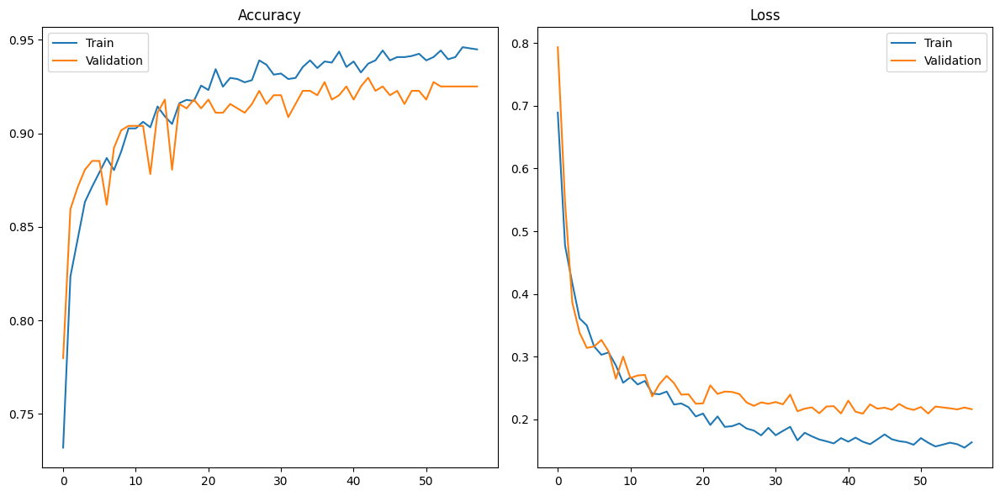

In [34]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [48]:
lr_hyperparams = {
    "Learning Rate": 0.0003,
    "Batch Size": 32,
    "Max Epochs": 100,
    "Early Stopping Patience": 15,
    "LR Reduction Patience": 5,
    "Min Learning Rate": 1e-6,
    "LSTM Layers": "128, 64",
    "Dropout Rate": 0.3,
    "Regularization": "L2(0.01) only on first LSTM",
    "Gradient Clipping": "clipnorm=1.0"
}

print_model_details(model, history, lr_hyperparams)


=== MODEL DETAILS ===
Hyperparameters:
Learning Rate            : 0.0003
Batch Size               : 32
Max Epochs               : 100
Early Stopping Patience  : 15
LR Reduction Patience    : 5
Min Learning Rate        : 1e-06
LSTM Layers              : 128, 64
Dropout Rate             : 0.3
Regularization           : L2(0.01) only on first LSTM
Gradient Clipping        : clipnorm=1.0


Data Augmentation

In [35]:
def time_series_augmentation(X, y, noise_factor=0.01):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

X_train_aug, Y_train_aug = time_series_augmentation(X_train, Y_train)

model = create_base_model((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.0005),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train_aug, Y_train_aug,
                   batch_size=16,
                   epochs=100,
                   validation_data=(X_val, Y_val),
                   callbacks=callbacks)

Epoch 1/100
214/214 ━━━━━━━━━━━━━━━━━━━━ 123s 562ms/step - accuracy: 0.7476 - loss: 0.6724 - val_accuracy: 0.8899 - val_loss: 0.3223 - learning_rate: 5.0000e-04
Epoch 2/100
214/214 ━━━━━━━━━━━━━━━━━━━━ 120s 562ms/step - accuracy: 0.8458 - loss: 0.4050 - val_accuracy: 0.8970 - val_loss: 0.2987 - learning_rate: 5.0000e-04
Epoch 3/100
214/214 ━━━━━━━━━━━━━━━━━━━━ 120s 561ms/step - accuracy: 0.8825 - loss: 0.3189 - val_accuracy: 0.8735 - val_loss: 0.3169 - learning_rate: 5.0000e-04
Epoch 4/100
214/214 ━━━━━━━━━━━━━━━━━━━━ 120s 561ms/step - accuracy: 0.8935 - loss: 0.2848 - val_accuracy: 0.8852 - val_loss: 0.2947 - learning_rate: 5.0000e-04
Epoch 5/100
214/214 ━━━━━━━━━━━━━━━━━━━━ 120s 560ms/step - accuracy: 0.8912 - loss: 0.2886 - val_accuracy: 0.9063 - val_loss: 0.2714 - learning_rate: 5.0000e-04
Epoch 6/100
214/214 ━━━━━━━━━━━━━━━━━━━━ 118s 553ms/step - accuracy: 0.8955 - loss: 0.2686 - val_accuracy: 0.9063 - val_loss: 0.2716 - learning_rate: 5.0000e-04
Epoch 7/100
214/214 ━━━━━━━━━━━━━━

In [36]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.9485


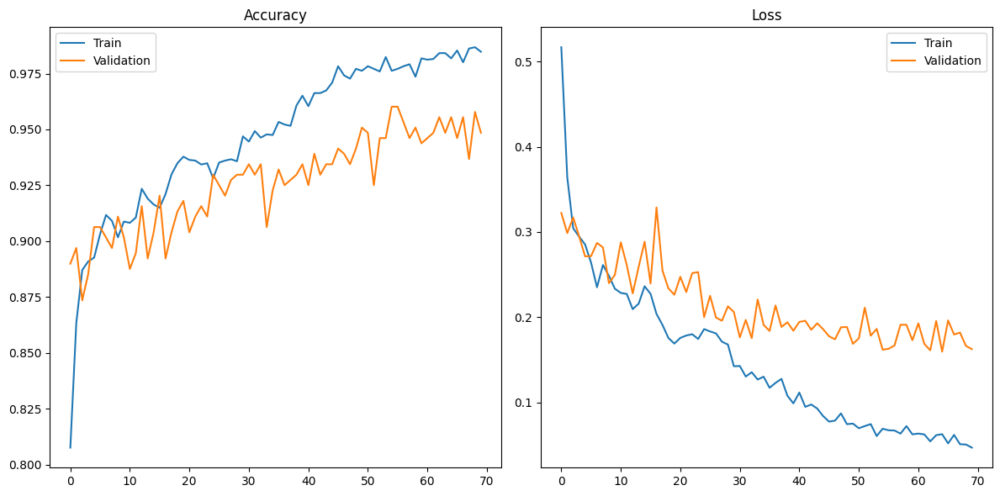

In [37]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [49]:
aug_hyperparams = {
    "Learning Rate": 0.0005,
    "Batch Size": 16,
    "Max Epochs": 100,
    "Early Stopping Patience": 15,
    "LR Reduction Patience": 5,
    "Min Learning Rate": 1e-6,
    "LSTM Layers": "128, 64",
    "Dropout Rate": 0.3,
    "Regularization": "L2(0.01) only on first LSTM",
    "Data Augmentation": "Gaussian noise (factor=0.01)",
    "Augmented Samples": f"{len(X_train_aug)} (original: {len(X_train)})"
}

print_model_details(model, history, aug_hyperparams)


=== MODEL DETAILS ===
Hyperparameters:
Learning Rate            : 0.0005
Batch Size               : 16
Max Epochs               : 100
Early Stopping Patience  : 15
LR Reduction Patience    : 5
Min Learning Rate        : 1e-06
LSTM Layers              : 128, 64
Dropout Rate             : 0.3
Regularization           : L2(0.01) only on first LSTM
Data Augmentation        : Gaussian noise (factor=0.01)
Augmented Samples        : 3410 (original: 1705)


All Combined

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard

def create_enhanced_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = LSTM(64, return_sequences=True,  # Reduced from 128
             kernel_regularizer=l2(0.001),  # Reduced from 0.01
             recurrent_regularizer=l2(0.001),  # Reduced from 0.01
             dropout=0.2,
             recurrent_dropout=0.2)(inputs)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    x = LSTM(32,  # Reduced from 64
             kernel_regularizer=l2(0.001),  # Reduced from 0.005
             recurrent_regularizer=l2(0.001),  # Reduced from 0.005
             dropout=0.1,
             recurrent_dropout=0.1)(x)
    x = BatchNormalization()(x)
    x = Dense(32, activation='relu', kernel_regularizer=l2(0.001))(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    return Model(inputs, outputs)

def time_series_augmentation(X, y, noise_factor=0.01):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

# Data augmentation (only do this once - your original code does it twice)
X_train_aug, Y_train_aug = time_series_augmentation(X_train, Y_train)

# More efficient callbacks
enhanced_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True),  # Reduced from 25
    ModelCheckpoint('enhanced_model.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6),  # Reduced from 8
    TensorBoard(log_dir='./logs')
]

# Model compilation and training with larger batch size
model = create_enhanced_model((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.0003, clipnorm=1.0),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train_aug, Y_train_aug,
                   batch_size=64,  # Increased from 32
                   epochs=200,
                   validation_data=(X_val, Y_val),
                   callbacks=enhanced_callbacks)

Epoch 1/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2266s 42s/step - accuracy: 0.4135 - loss: 1.4643 - val_accuracy: 0.7002 - val_loss: 1.1389 - learning_rate: 3.0000e-04
Epoch 2/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 3562s 66s/step - accuracy: 0.6065 - loss: 1.0455 - val_accuracy: 0.7260 - val_loss: 0.9660 - learning_rate: 3.0000e-04
Epoch 3/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2987s 44s/step - accuracy: 0.6596 - loss: 0.9306 - val_accuracy: 0.8033 - val_loss: 0.7842 - learning_rate: 3.0000e-04
Epoch 4/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2370s 44s/step - accuracy: 0.6921 - loss: 0.8876 - val_accuracy: 0.8267 - val_loss: 0.6757 - learning_rate: 3.0000e-04
Epoch 5/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2339s 43s/step - accuracy: 0.7342 - loss: 0.8051 - val_accuracy: 0.8220 - val_loss: 0.6349 - learning_rate: 3.0000e-04
Epoch 6/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2389s 44s/step - accuracy: 0.7817 - loss: 0.7261 - val_accuracy: 0.8290 - val_loss: 0.6323 - learning_rate: 3.0000e-04
Epoch 7/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2345s 43s/ste

In [ ]:
combined_hyperparams = {
    "Learning Rate": 0.0003,
    "Batch Size": 32,
    "Max Epochs": 200,
    "Early Stopping Patience": 25,
    "LR Reduction Patience": 8,
    "Min Learning Rate": 1e-6,
    "LSTM Layers": "128, 64",
    "Dropout Rates": "0.2-0.3",
    "Kernel Regularization": "L2(0.01, 0.005)",
    "Recurrent Regularization": "L2(0.01, 0.005)",
    "Added Dense Layer": "32 units with L2(0.001)",
    "Gradient Clipping": "clipnorm=1.0",
    "Data Augmentation": "Gaussian noise (factor=0.01)",
    "Augmented Samples": f"{len(X_train_aug)} (original: {len(X_train)})",
    "Monitoring": "TensorBoard logging"
}

print_model_details(model, history, combined_hyperparams)

In [10]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.8899


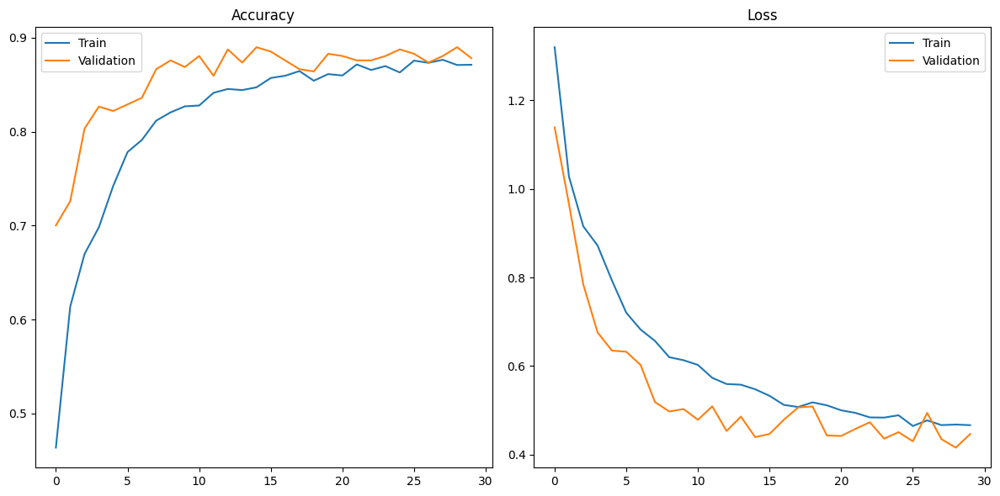

In [11]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

Bidirectional LSTM

Input → BiLSTM(64) → BatchNorm → Dropout(0.3) → BiLSTM(32) → BatchNorm → 
Dense(64) → Dropout(0.4) → Dense(32) → Dropout(0.3) → Dense(3) → Softmax




In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
import numpy as np


input_shape = (X_train.shape[1], 1) 
num_classes = 3  
model_name = 'BiLSTM_Optimized'
batch_size = 128  
epochs = 100     

def create_optimized_bilstm_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    # First BiLSTM layer - reduced complexity
    x = Bidirectional(LSTM(32, return_sequences=True,
                          kernel_regularizer=l2(0.0001),  # Reduced regularization
                          dropout=0.1,                     # Reduced dropout
                          recurrent_dropout=0.1))(inputs)
    x = BatchNormalization()(x)
    
    # Second BiLSTM layer - further reduced
    x = Bidirectional(LSTM(16,                            # Smaller units
                          kernel_regularizer=l2(0.0001),
                          dropout=0.1,
                          recurrent_dropout=0.1))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)  # Single dropout layer
    
    # Simplified dense layers
    x = Dense(32, activation='relu', kernel_regularizer=l2(0.0001))(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


def create_simple_bilstm_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    # Single BiLSTM layer
    x = Bidirectional(LSTM(64, 
                          dropout=0.2,
                          recurrent_dropout=0.2))(inputs)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    
    # Single dense layer
    x = Dense(32, activation='relu')(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True),
    ModelCheckpoint(f'{model_name}_best.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-7, verbose=1),
]


model = create_simple_bilstm_model(input_shape, num_classes)
# model = create_optimized_bilstm_model(input_shape, num_classes)


model.compile(
    optimizer=Adam(learning_rate=0.01, clipnorm=1.0),  # Higher learning rate
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


model.summary()

# Training with optimized parameters
history = model.fit(
    X_train, Y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, Y_val),
    callbacks=callbacks,
    verbose=1
)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 2548, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ (None, 128)            │        33,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 38,531 (150.51 KB)

 Trainable params: 38,275 (149.51 KB)

 Non-trainable params: 256 (1.00 KB)

Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 698s 50s/step - accuracy: 0.5938 - loss: 0.9158 - val_accuracy: 0.6721 - val_loss: 0.5442 - learning_rate: 0.0100
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 683s 49s/step - accuracy: 0.8001 - loss: 0.4132 - val_accuracy: 0.8009 - val_loss: 0.5174 - learning_rate: 0.0100
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 705s 51s/step - accuracy: 0.8509 - loss: 0.3672 - val_accuracy: 0.8290 - val_loss: 0.3837 - learning_rate: 0.0100
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 688s 48s/step - accuracy: 0.8461 - loss: 0.3715 - val_accuracy: 0.7799 - val_loss: 0.4616 - learning_rate: 0.0100
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 691s 50s/step - accuracy: 0.8642 - loss: 0.3433 - val_accuracy: 0.7845 - val_loss: 0.4155 - learning_rate: 0.0100
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 717s 52s/step - accuracy: 0.8936 - loss: 0.2923 - val_accuracy: 0.9133 - val_loss: 0.2894 - learning_rate: 0.0100
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 710s 51s/step - accuracy: 0.8709 - loss: 0.

In [11]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.9368


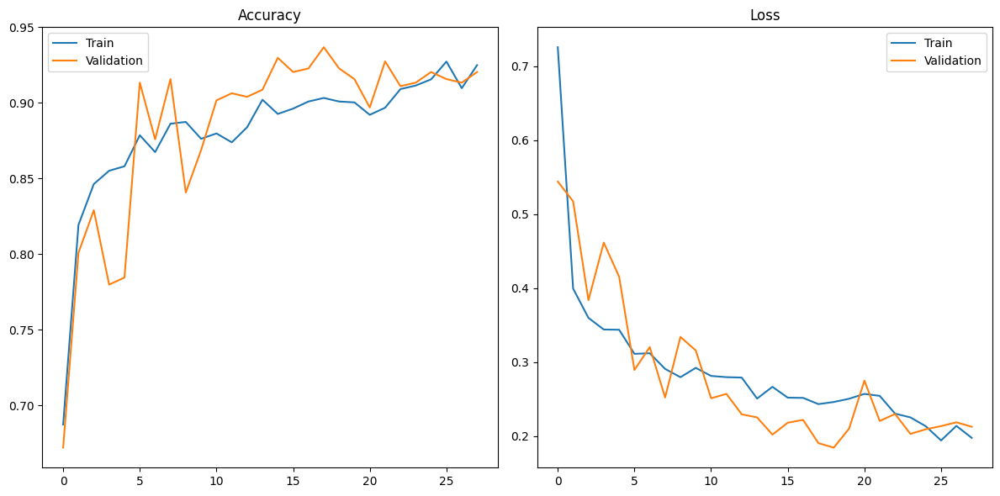

In [12]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

Method 2

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split



input_shape = (X_train.shape[1], X_train.shape[2])  # (timesteps, features)
num_classes = Y_train.shape[1]
print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

def create_optimized_bilstm(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    # First BiLSTM layer with return sequences
    x = Bidirectional(LSTM(64, return_sequences=True,
                        kernel_regularizer=l2(1e-4),
                        recurrent_regularizer=l2(1e-4),
                        dropout=0.2,
                        recurrent_dropout=0.1))(inputs)
    x = BatchNormalization()(x)
    
    # Second BiLSTM layer
    x = Bidirectional(LSTM(32,
                        kernel_regularizer=l2(1e-4),
                        dropout=0.2))(x)
    x = BatchNormalization()(x)
    
    # Dense layers
    x = Dense(64, activation='relu', kernel_regularizer=l2(1e-4))(x)
    x = Dropout(0.3)(x)
    x = Dense(32, activation='relu')(x)
    x = Dropout(0.2)(x)
    
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)

# Callbacks configuration
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=12, restore_best_weights=True, min_delta=0.005),
    ModelCheckpoint('best_bilstm_model.h5', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]


model = create_optimized_bilstm(input_shape, num_classes)
model.compile(
    optimizer=Adam(learning_rate=0.001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


model.summary()


batch_size = 64
epochs = 100


history = model.fit(
    X_train, Y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, Y_val),
    callbacks=callbacks,
    verbose=1
)


val_loss, val_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nValidation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

Input shape: (2548, 1)
Number of classes: 3


I0000 00:00:1752041172.409380     821 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3539 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 2548, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 2548, 128)      │        33,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2548, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 64)             │        41,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 82,115 (320.76 KB)

 Trainable params: 81,731 (319.26 KB)

 Non-trainable params: 384 (1.50 KB)

Epoch 1/100


I0000 00:00:1752041220.915994    3696 cuda_dnn.cc:529] Loaded cuDNN version 90300


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.4106 - loss: 1.2136 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1395s 51s/step - accuracy: 0.4140 - loss: 1.2078 - val_accuracy: 0.7939 - val_loss: 0.9140 - learning_rate: 0.0010
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.6899 - loss: 0.7473 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1396s 52s/step - accuracy: 0.6906 - loss: 0.7460 - val_accuracy: 0.8173 - val_loss: 0.6978 - learning_rate: 0.0010
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.7788 - loss: 0.5667 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1392s 52s/step - accuracy: 0.7790 - loss: 0.5659 - val_accuracy: 0.8361 - val_loss: 0.5238 - learning_rate: 0.0010
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.8443 - loss: 0.4730 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1405s 52s/step - accuracy: 0.8445 - loss: 0.4721 - val_accuracy: 0.9040 - val_loss: 0.3979 - learning_rate: 0.0010
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1406s 52s/step - accuracy: 0.8467 - loss: 0.4373 - val_accuracy: 0.9016 - val_loss: 0.3425 - learning_rate: 0.0010
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.8589 - loss: 0.3992 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1393s 52s/step - accuracy: 0.8589 - loss: 0.3988 - val_accuracy: 0.9087 - val_loss: 0.3021 - learning_rate: 0.0010
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.8600 - loss: 0.3675 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1384s 51s/step - accuracy: 0.8604 - loss: 0.3670 - val_accuracy: 0.9180 - val_loss: 0.2714 - learning_rate: 0.0010
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 47s/step - accuracy: 0.8757 - loss: 0.3689 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1377s 51s/step - accuracy: 0.8754 - loss: 0.3686 - val_accuracy: 0.9251 - val_loss: 0.2618 - learning_rate: 0.0010
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 47s/step - accuracy: 0.8716 - loss: 0.3738 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1367s 51s/step - accuracy: 0.8719 - loss: 0.3728 - val_accuracy: 0.9274 - val_loss: 0.2572 - learning_rate: 0.0010
Epoch 10/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1371s 51s/step - accuracy: 0.8757 - loss: 0.3681 - val_accuracy: 0.9227 - val_loss: 0.2502 - learning_rate: 0.0010
Epoch 11/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1372s 51s/step - accuracy: 0.8947 - loss: 0.3191 - val_accuracy: 0.9180 - val_loss: 0.2507 - learning_rate: 0.0010
Epoch 12/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 21534s 826s/step - accuracy: 0.9032 - loss: 0.2984 - val_accuracy: 0.9087 - val_loss: 0.2669 - learning_rate: 0.0010
Epoch 13/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 3801s 144s/step - accuracy: 0.8935 - loss: 0.2993 - val_accuracy: 0.9110 - val_loss: 0.2565 - learning_rate: 0.0010
Epoch 14/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1393s 52s/step - accuracy: 0.9015 - loss: 0.2859 - val_accuracy: 0.9133 - val_loss: 0.2661 - learning_rate: 0.0010
Epoch 15/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1410s 52s/step - accuracy: 0.8989 - loss

In [8]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.9251


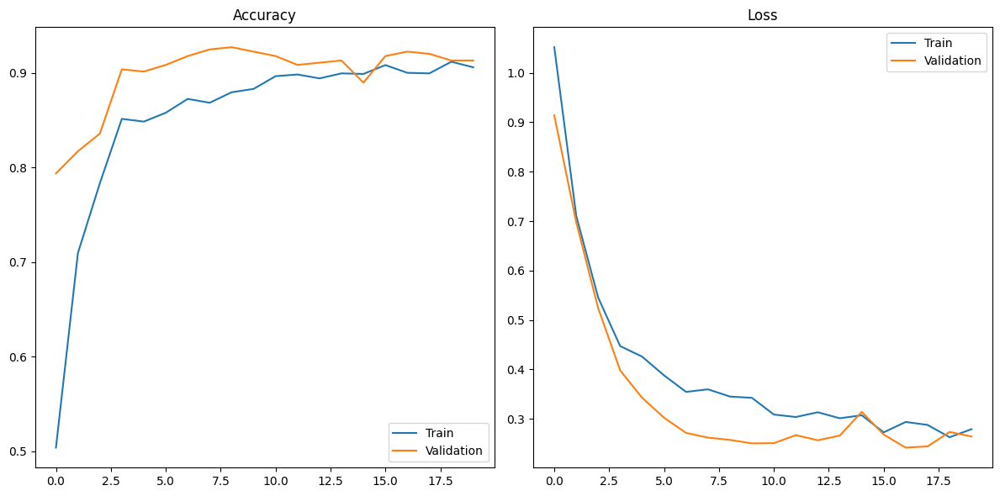

In [9]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split



input_shape = (X_train.shape[1], X_train.shape[2])  # (timesteps, features)
num_classes = Y_train.shape[1]
print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")


def create_optimized_bilstm(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    # First BiLSTM layer - increased units from 64 to 128
    x = Bidirectional(LSTM(128, return_sequences=True,  # 64 → 128
                        kernel_regularizer=l2(1e-3),    # 1e-4 → 1e-3
                        recurrent_regularizer=l2(1e-3), #  1e-4 → 1e-3
                        dropout=0.3,                    #  0.2 → 0.3
                        recurrent_dropout=0.2))(inputs) #  0.1 → 0.2
    x = BatchNormalization()(x)
    
    # Second BiLSTM layer - increased units from 32 to 64
    x = Bidirectional(LSTM(64,                         # 32 → 64
                        kernel_regularizer=l2(1e-3),   # 1e-4 → 1e-3
                        dropout=0.3))(x)               # 0.2 → 0.3
    x = BatchNormalization()(x)
    
    # Dense layers
    x = Dense(128, activation='relu',                # 64 → 128
             kernel_regularizer=l2(1e-3))(x)         #  1e-4 → 1e-3
    x = Dropout(0.4)(x)                             # 0.3 → 0.4
    x = Dense(64, activation='relu')(x)             # 32 → 64
    x = Dropout(0.3)(x)                             #0.2 → 0.3
    
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


batch_size = 32                                     # 64 → 32
epochs = 150                                        # 100 → 150


model.compile(
    optimizer=Adam(learning_rate=0.0005,            # 0.001 → 0.0005
                  clipnorm=1.0,
                  beta_1=0.9,                       
                  beta_2=0.999,                     
                  epsilon=1e-7),                    
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


callbacks = [
    EarlyStopping(monitor='val_accuracy', 
                 patience=15,                       # CHANGED: 12 → 15
                 restore_best_weights=True, 
                 min_delta=0.001,                   # CHANGED: 0.005 → 0.001
                 mode='max'),
    ModelCheckpoint('best_bilstm_model.h5', 
                  monitor='val_accuracy', 
                  save_best_only=True,
                  mode='max'),                      
    ReduceLROnPlateau(monitor='val_loss',
                     factor=0.3,                    # CHANGED: 0.5 → 0.3
                     patience=7,                    # CHANGED: 5 → 7
                     min_lr=1e-6,
                     verbose=1)
]


history = model.fit(
    X_train, Y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, Y_val),
    callbacks=callbacks,
    verbose=1
)


val_loss, val_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nValidation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

Input shape: (2548, 1)
Number of classes: 3
Epoch 1/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.9346 - loss: 0.1736

54/54 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - accuracy: 0.9346 - loss: 0.1734 - val_accuracy: 0.8970 - val_loss: 0.2477 - learning_rate: 5.0000e-04
Epoch 2/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.9442 - loss: 0.1500

54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9443 - loss: 0.1497 - val_accuracy: 0.9344 - val_loss: 0.1589 - learning_rate: 5.0000e-04
Epoch 3/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 190ms/step - accuracy: 0.9566 - loss: 0.1224 - val_accuracy: 0.9251 - val_loss: 0.1597 - learning_rate: 5.0000e-04
Epoch 4/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - accuracy: 0.9655 - loss: 0.0905

54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9655 - loss: 0.0907 - val_accuracy: 0.9532 - val_loss: 0.1293 - learning_rate: 5.0000e-04
Epoch 5/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - accuracy: 0.9604 - loss: 0.0993 - val_accuracy: 0.9438 - val_loss: 0.1171 - learning_rate: 5.0000e-04
Epoch 6/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - accuracy: 0.9775 - loss: 0.0712 - val_accuracy: 0.9368 - val_loss: 0.1595 - learning_rate: 5.0000e-04
Epoch 7/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 191ms/step - accuracy: 0.9703 - loss: 0.0766 - val_accuracy: 0.9461 - val_loss: 0.1537 - learning_rate: 5.0000e-04
Epoch 8/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.9702 - loss: 0.0853

54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - accuracy: 0.9704 - loss: 0.0850 - val_accuracy: 0.9649 - val_loss: 0.1145 - learning_rate: 5.0000e-04
Epoch 9/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 0.9740 - loss: 0.0765 - val_accuracy: 0.9508 - val_loss: 0.1620 - learning_rate: 5.0000e-04
Epoch 10/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9713 - loss: 0.0816 - val_accuracy: 0.8384 - val_loss: 0.3977 - learning_rate: 5.0000e-04
Epoch 11/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.9769 - loss: 0.0702

54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - accuracy: 0.9768 - loss: 0.0702 - val_accuracy: 0.9766 - val_loss: 0.0820 - learning_rate: 5.0000e-04
Epoch 12/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 179ms/step - accuracy: 0.9807 - loss: 0.0538 - val_accuracy: 0.9508 - val_loss: 0.1270 - learning_rate: 5.0000e-04
Epoch 13/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - accuracy: 0.9800 - loss: 0.0516 - val_accuracy: 0.9227 - val_loss: 0.1927 - learning_rate: 5.0000e-04
Epoch 14/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - accuracy: 0.9816 - loss: 0.0431 - val_accuracy: 0.9508 - val_loss: 0.1470 - learning_rate: 5.0000e-04
Epoch 15/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9766 - loss: 0.0644 - val_accuracy: 0.9344 - val_loss: 0.1452 - learning_rate: 5.0000e-04
Epoch 16/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - accuracy: 0.9836 - loss: 0.0394 - val_accuracy: 0.9578 - val_loss: 0.1096 - learning_rate: 5.0000e-04
Epoch 17/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 183ms/step - accurac

54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - accuracy: 1.0000 - loss: 0.0041 - val_accuracy: 0.9883 - val_loss: 0.0617 - learning_rate: 1.5000e-04
Epoch 25/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 1.0000 - loss: 0.0033 - val_accuracy: 0.9672 - val_loss: 0.0653 - learning_rate: 1.5000e-04
Epoch 26/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 0.9987 - loss: 0.0040 - val_accuracy: 0.9859 - val_loss: 0.0552 - learning_rate: 1.5000e-04
Epoch 27/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 181ms/step - accuracy: 1.0000 - loss: 0.0020 - val_accuracy: 0.9766 - val_loss: 0.0596 - learning_rate: 1.5000e-04
Epoch 28/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 1.0000 - loss: 0.0028 - val_accuracy: 0.9649 - val_loss: 0.0712 - learning_rate: 1.5000e-04
Epoch 29/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - accuracy: 1.0000 - loss: 0.0020 - val_accuracy: 0.9672 - val_loss: 0.0771 - learning_rate: 1.5000e-04
Epoch 30/150
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - accuracy

In [16]:
print("Input shapes:")
print(f"X_train: {X_train.shape}, Y_train: {Y_train.shape}")
print(f"X_val: {X_val.shape}, Y_val: {Y_val.shape}")

# Ensure sequences are float32 and labels are int
X_train = X_train.astype('float32')
X_val = X_val.astype('float32')

Input shapes:
X_train: (1705, 2548, 1), Y_train: (1705, 3)
X_val: (427, 2548, 1), Y_val: (427, 3)


In [17]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.9883


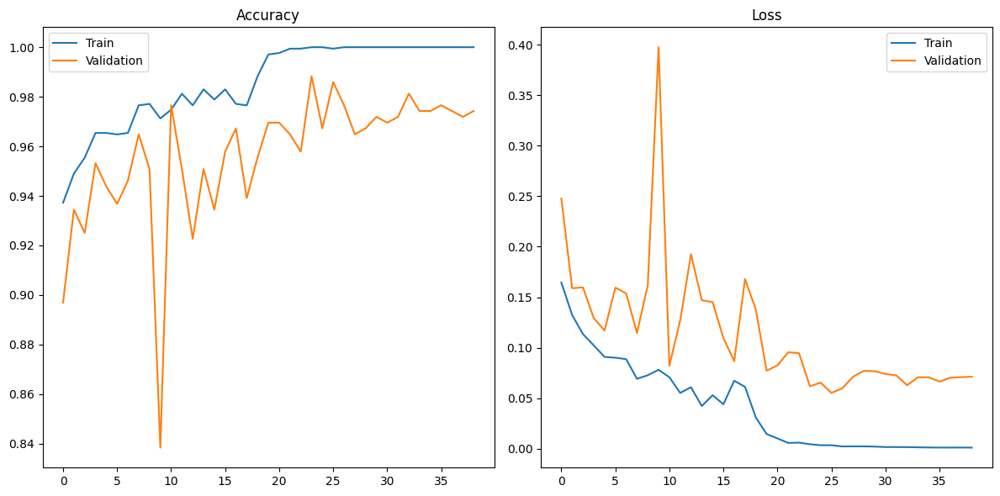

In [18]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [6]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split



input_shape = (X_train.shape[1], X_train.shape[2])  # (timesteps, features)
num_classes = Y_train.shape[1]
print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

def create_optimized_bilstm(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    # First BiLSTM layer with return sequences
    x = Bidirectional(LSTM(64, return_sequences=True,
                    kernel_regularizer=l2(1e-3),  # Increased from 1e-4
                    recurrent_dropout=0.2,        # Increased from 0.1
                    dropout=0.3))(inputs)         # Increased from 0.2
    x = BatchNormalization()(x)
    
    # Second BiLSTM layer
    x = Bidirectional(LSTM(32,
                        kernel_regularizer=l2(1e-4),
                        dropout=0.2))(x)
    x = BatchNormalization()(x)
    
    # Dense layers
    x = Dense(64, activation='relu', kernel_regularizer=l2(1e-4))(x)
    x = Dropout(0.3)(x)
    x = Dense(32, activation='relu')(x)
    x = Dropout(0.2)(x)
    
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)

# Callbacks configuration
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=12, restore_best_weights=True, min_delta=0.005),
    ModelCheckpoint('best_bilstm_model.h5', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]


model = create_optimized_bilstm(input_shape, num_classes)
model.compile(
    optimizer=Adam(learning_rate=0.001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


model.summary()


batch_size = 64
epochs = 100


history = model.fit(
    X_train, Y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, Y_val),
    callbacks=callbacks,
    verbose=1
)


val_loss, val_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nValidation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

Input shape: (2548, 1)
Number of classes: 3


I0000 00:00:1752610405.584649    8967 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3539 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 2548, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 2548, 128)      │        33,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2548, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 64)             │        41,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 82,115 (320.76 KB)

 Trainable params: 81,731 (319.26 KB)

 Non-trainable params: 384 (1.50 KB)

Epoch 1/100


I0000 00:00:1752610450.856507    9227 cuda_dnn.cc:529] Loaded cuDNN version 90300


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.3919 - loss: 1.2173 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1399s 51s/step - accuracy: 0.3947 - loss: 1.2127 - val_accuracy: 0.6745 - val_loss: 0.9391 - learning_rate: 0.0010
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.5864 - loss: 0.8875 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1394s 52s/step - accuracy: 0.5874 - loss: 0.8861 - val_accuracy: 0.8407 - val_loss: 0.7376 - learning_rate: 0.0010
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1431s 53s/step - accuracy: 0.7216 - loss: 0.6764 - val_accuracy: 0.7658 - val_loss: 0.5903 - learning_rate: 0.0010
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 49s/step - accuracy: 0.7757 - loss: 0.5759 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1406s 52s/step - accuracy: 0.7756 - loss: 0.5756 - val_accuracy: 0.8712 - val_loss: 0.4775 - learning_rate: 0.0010
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.7814 - loss: 0.5229 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1397s 52s/step - accuracy: 0.7820 - loss: 0.5218 - val_accuracy: 0.8993 - val_loss: 0.3958 - learning_rate: 0.0010
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.8132 - loss: 0.4375 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1384s 51s/step - accuracy: 0.8131 - loss: 0.4380 - val_accuracy: 0.9110 - val_loss: 0.3429 - learning_rate: 0.0010
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1376s 51s/step - accuracy: 0.8345 - loss: 0.4252 - val_accuracy: 0.8829 - val_loss: 0.3438 - learning_rate: 0.0010
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1402s 52s/step - accuracy: 0.8545 - loss: 0.3770 - val_accuracy: 0.8806 - val_loss: 0.3066 - learning_rate: 0.0010
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1381s 51s/step - accuracy: 0.8373 - loss: 0.4281 - val_accuracy: 0.9087 - val_loss: 0.2690 - learning_rate: 0.0010
Epoch 10/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1395s 52s/step - accuracy: 0.8643 - loss: 0.3849 - val_accuracy: 0.8712 - val_loss: 0.3209 - learning_rate: 0.0010
Epoch 11/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1385s 51s/step - accuracy: 0.8552 - loss: 0.3857 - val_accuracy: 0.8829 - val_loss: 0.3136 - learning_rate: 0.0010
Epoch 12/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1346s 50s/step - accuracy: 0.8806 - loss: 0.31

In [7]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.9110


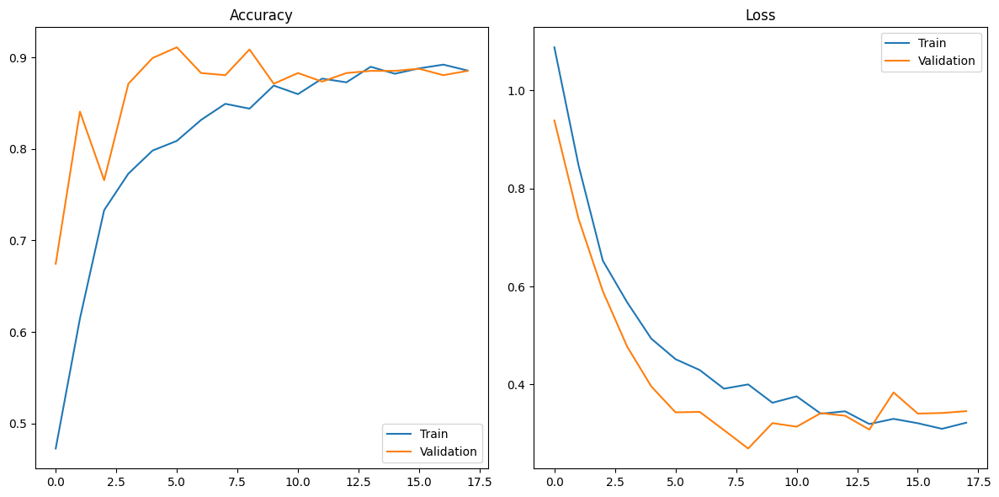

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [6]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split



input_shape = (X_train.shape[1], X_train.shape[2])  # (timesteps, features)
num_classes = Y_train.shape[1]
print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

def create_optimized_bilstm(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    # First BiLSTM layer with return_sequences
    x = Bidirectional(LSTM(64, 
                           return_sequences=True,
                           kernel_regularizer=l2(1e-3),  # Increased from 1e-4
                           recurrent_dropout=0.2,        # Increased from 0.1
                           dropout=0.3))(inputs)         # Increased from 0.2
    x = BatchNormalization()(x)

    # Second BiLSTM layer
    x = Bidirectional(LSTM(32, 
                           kernel_regularizer=l2(1e-4), 
                           dropout=0.2))(x)
    x = BatchNormalization()(x)

    # Dense layers
    x = Dense(64, activation='relu', kernel_regularizer=l2(1e-4))(x)
    x = Dropout(0.3)(x)
    x = Dense(32, activation='relu')(x)
    x = Dropout(0.2)(x)

    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    return model

# Callbacks configuration
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=12, restore_best_weights=True, min_delta=0.005),
    ModelCheckpoint('best_bilstm_model.h5', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]


model = create_optimized_bilstm(input_shape, num_classes)
model.compile(
    optimizer=Adam(learning_rate=0.001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


model.summary()


batch_size = 64
epochs = 100


history = model.fit(
    X_train, Y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, Y_val),
    callbacks=callbacks,
    verbose=1
)


val_loss, val_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nValidation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

Input shape: (2548, 1)
Number of classes: 3


I0000 00:00:1752686934.213682     854 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3539 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 2548, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 2548, 128)      │        33,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2548, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 64)             │        41,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 82,115 (320.76 KB)

 Trainable params: 81,731 (319.26 KB)

 Non-trainable params: 384 (1.50 KB)

Epoch 1/100


I0000 00:00:1752686977.776087    8115 cuda_dnn.cc:529] Loaded cuDNN version 90300


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 46s/step - accuracy: 0.4161 - loss: 1.2586 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1346s 50s/step - accuracy: 0.4180 - loss: 1.2543 - val_accuracy: 0.7728 - val_loss: 0.9565 - learning_rate: 0.0010
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 47s/step - accuracy: 0.5866 - loss: 0.8991 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1355s 50s/step - accuracy: 0.5879 - loss: 0.8971 - val_accuracy: 0.8548 - val_loss: 0.7628 - learning_rate: 0.0010
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 45s/step - accuracy: 0.7109 - loss: 0.7017 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1317s 49s/step - accuracy: 0.7111 - loss: 0.7010 - val_accuracy: 0.8712 - val_loss: 0.5856 - learning_rate: 0.0010
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1321s 49s/step - accuracy: 0.7756 - loss: 0.5666 - val_accuracy: 0.8712 - val_loss: 0.4826 - learning_rate: 0.0010
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 70s/step - accuracy: 0.7923 - loss: 0.4860  

27/27 ━━━━━━━━━━━━━━━━━━━━ 1967s 74s/step - accuracy: 0.7925 - loss: 0.4859 - val_accuracy: 0.8735 - val_loss: 0.4261 - learning_rate: 0.0010
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 66s/step - accuracy: 0.8219 - loss: 0.4603  

27/27 ━━━━━━━━━━━━━━━━━━━━ 1859s 70s/step - accuracy: 0.8221 - loss: 0.4601 - val_accuracy: 0.8852 - val_loss: 0.3841 - learning_rate: 0.0010
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 47s/step - accuracy: 0.8336 - loss: 0.4212 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1360s 50s/step - accuracy: 0.8336 - loss: 0.4213 - val_accuracy: 0.8946 - val_loss: 0.3212 - learning_rate: 0.0010
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1357s 50s/step - accuracy: 0.8454 - loss: 0.4146 - val_accuracy: 0.8642 - val_loss: 0.3975 - learning_rate: 0.0010
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1386s 52s/step - accuracy: 0.8425 - loss: 0.4210 - val_accuracy: 0.8525 - val_loss: 0.4300 - learning_rate: 0.0010
Epoch 10/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1417s 53s/step - accuracy: 0.8546 - loss: 0.3939 - val_accuracy: 0.7752 - val_loss: 0.7309 - learning_rate: 0.0010
Epoch 11/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 49s/step - accuracy: 0.8555 - loss: 0.3865 

27/27 ━━━━━━━━━━━━━━━━━━━━ 1411s 52s/step - accuracy: 0.8558 - loss: 0.3857 - val_accuracy: 0.9063 - val_loss: 0.2941 - learning_rate: 0.0010
Epoch 12/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1413s 52s/step - accuracy: 0.8638 - loss: 0.3578 - val_accuracy: 0.8735 - val_loss: 0.4063 - learning_rate: 0.0010
Epoch 13/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1355s 50s/step - accuracy: 0.8562 - loss: 0.3732 - val_accuracy: 0.8899 - val_loss: 0.3428 - learning_rate: 0.0010
Epoch 14/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1337s 50s/step - accuracy: 0.8783 - loss: 0.3410 - val_accuracy: 0.8712 - val_loss: 0.4217 - learning_rate: 0.0010
Epoch 15/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1345s 50s/step - accuracy: 0.8830 - loss: 0.3260 - val_accuracy: 0.8244 - val_loss: 0.5861 - learning_rate: 0.0010
Epoch 16/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1337s 50s/step - accuracy: 0.8699 - loss: 0.3412 - val_accuracy: 0.8735 - val_loss: 0.3948 - learning_rate: 0.0010
Epoch 17/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1357s 50s/step - accuracy: 0.8900 - loss: 0

In [7]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.9063


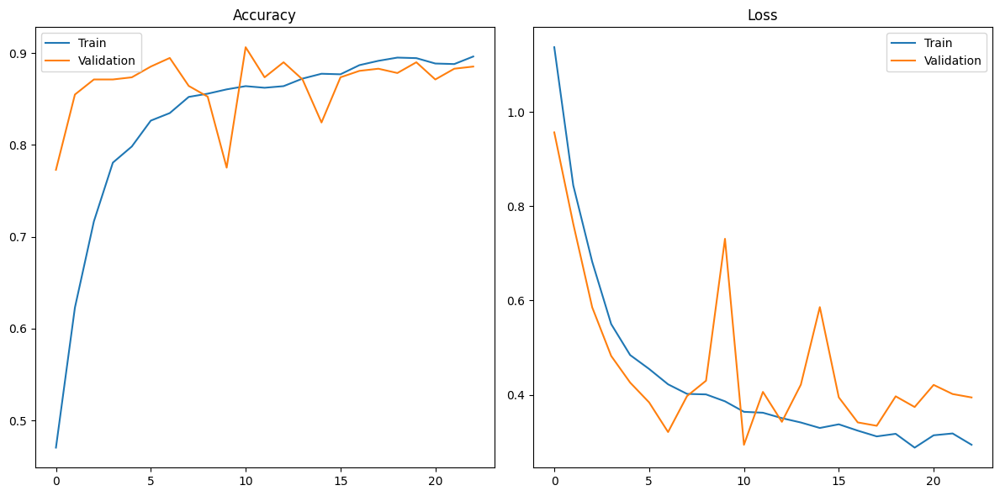

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

GRU-GATED RECURRENT NETWORK

In [7]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.layers import GRU  # Changed from LSTM to GRU

def create_enhanced_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = GRU(64, return_sequences=True,  # Changed LSTM to GRU
             kernel_regularizer=l2(0.001),
             recurrent_regularizer=l2(0.001),
             dropout=0.2,
             recurrent_dropout=0.2)(inputs)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    x = GRU(32,  # Changed LSTM to GRU
             kernel_regularizer=l2(0.001),
             recurrent_regularizer=l2(0.001),
             dropout=0.1,
             recurrent_dropout=0.1)(x)
    x = BatchNormalization()(x)
    x = Dense(32, activation='relu', kernel_regularizer=l2(0.001))(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    return Model(inputs, outputs)

def time_series_augmentation(X, y, noise_factor=0.01):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

# Data augmentation (only do this once - your original code does it twice)
X_train_aug, Y_train_aug = time_series_augmentation(X_train, Y_train)

# More efficient callbacks
enhanced_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True),
    ModelCheckpoint('enhanced_model.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6),
    TensorBoard(log_dir='./logs')
]

# Model compilation and training with larger batch size
model = create_enhanced_model((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.0003, clipnorm=1.0),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train_aug, Y_train_aug,
                   batch_size=64,
                   epochs=200,
                   validation_data=(X_val, Y_val),
                   callbacks=enhanced_callbacks)

I0000 00:00:1753385944.437883     871 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3539 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Epoch 1/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2097s 39s/step - accuracy: 0.3543 - loss: 1.4811 - val_accuracy: 0.6464 - val_loss: 1.1218 - learning_rate: 3.0000e-04
Epoch 2/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2112s 39s/step - accuracy: 0.5695 - loss: 1.1213 - val_accuracy: 0.6721 - val_loss: 0.9751 - learning_rate: 3.0000e-04
Epoch 3/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2116s 39s/step - accuracy: 0.6021 - loss: 1.0501 - val_accuracy: 0.6698 - val_loss: 0.9119 - learning_rate: 3.0000e-04
Epoch 4/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2105s 39s/step - accuracy: 0.6221 - loss: 0.9853 - val_accuracy: 0.7283 - val_loss: 0.8160 - learning_rate: 3.0000e-04
Epoch 5/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2101s 39s/step - accuracy: 0.6677 - loss: 0.9247 - val_accuracy: 0.7541 - val_loss: 0.7575 - learning_rate: 3.0000e-04
Epoch 6/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2110s 39s/step - accuracy: 0.6599 - loss: 0.9075 - val_accuracy: 0.7939 - val_loss: 0.6711 - learning_rate: 3.0000e-04
Epoch 7/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2104s 39s/ste

In [8]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")



Test Accuracy: 0.9227


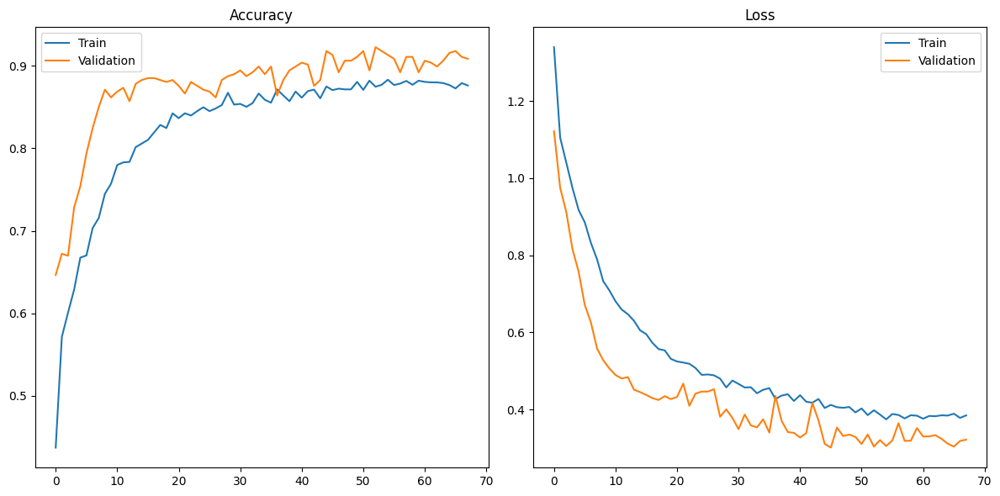

In [9]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

#### Model Architecture:

Reduced GRU units (48 → 24) for faster computation

Used combined L1/L2 regularization for better generalization

Adjusted dropout rates to balance regularization and training speed

#### Training Process:

Increased initial learning rate (0.0003 → 0.001) with gradient clipping

Larger batch size (64 → 128) for faster iterations

Reduced maximum epochs (200 → 100) since we have better early stopping

#### Data Augmentation:

Multiple noise levels for more diverse training samples

More subtle noise factors to preserve signal integrity




In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.layers import GRU
from tensorflow.keras.regularizers import l1_l2  # Combined L1 and L2 regularization

def create_optimized_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    # First GRU layer with optimized parameters
    x = GRU(48, return_sequences=True,  # Reduced units for faster training
             kernel_regularizer=l1_l2(l1=0.0005, l2=0.0005),  # Combined regularization
             recurrent_regularizer=l1_l2(l1=0.0005, l2=0.0005),
             dropout=0.15,  # Reduced dropout
             recurrent_dropout=0.15,
             activation='tanh')(inputs)
    x = BatchNormalization()(x)
    
    # Second GRU layer
    x = GRU(24,  # Further reduced units
             kernel_regularizer=l1_l2(l1=0.0005, l2=0.0005),
             recurrent_regularizer=l1_l2(l1=0.0005, l2=0.0005),
             dropout=0.1,
             recurrent_dropout=0.1,
             activation='tanh')(x)
    x = BatchNormalization()(x)
    
    # Dense layers
    x = Dense(24, activation='relu', kernel_regularizer=l1_l2(l1=0.0005, l2=0.0005))(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


def optimized_augmentation(X, y, noise_factors=[0.005, 0.01, 0.02]):
    X_aug = [X]
    y_aug = [y]
    for factor in noise_factors:
        X_noise = X + factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
        X_aug.append(X_noise)
        y_aug.append(y)
    return np.concatenate(X_aug), np.concatenate(y_aug)


X_train_aug, Y_train_aug = optimized_augmentation(X_train, Y_train)


optimized_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, min_delta=0.001),
    ModelCheckpoint('optimized_model.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1),
    TensorBoard(log_dir='./logs', profile_batch=0)  # Disabled profiling for faster training
]


model = create_optimized_model((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.001, clipvalue=0.5),  # Higher initial LR with gradient clipping
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Training with optimized parameters
history = model.fit(X_train_aug, Y_train_aug,
                   batch_size=128,  # Larger batch size for faster training
                   epochs=100,  # Reduced max epochs
                   validation_data=(X_val, Y_val),
                   callbacks=optimized_callbacks,
                   verbose=2)  # Less verbose output for cleaner logs

Epoch 1/100
54/54 - 15627s - 289s/step - accuracy: 0.5729 - loss: 1.4557 - val_accuracy: 0.6885 - val_loss: 1.2309 - learning_rate: 1.0000e-03
Epoch 2/100
54/54 - 2168s - 40s/step - accuracy: 0.7037 - loss: 1.1318 - val_accuracy: 0.7775 - val_loss: 0.9110 - learning_rate: 1.0000e-03
Epoch 3/100
54/54 - 2157s - 40s/step - accuracy: 0.7633 - loss: 0.9305 - val_accuracy: 0.8454 - val_loss: 0.7521 - learning_rate: 1.0000e-03
Epoch 4/100
54/54 - 2172s - 40s/step - accuracy: 0.7908 - loss: 0.8251 - val_accuracy: 0.8290 - val_loss: 0.6892 - learning_rate: 1.0000e-03
Epoch 5/100
54/54 - 2162s - 40s/step - accuracy: 0.8188 - loss: 0.7322 - val_accuracy: 0.8829 - val_loss: 0.6132 - learning_rate: 1.0000e-03
Epoch 6/100
54/54 - 2173s - 40s/step - accuracy: 0.8252 - loss: 0.6882 - val_accuracy: 0.8829 - val_loss: 0.5341 - learning_rate: 1.0000e-03
Epoch 7/100
54/54 - 2232s - 41s/step - accuracy: 0.8352 - loss: 0.6548 - val_accuracy: 0.8782 - val_loss: 0.5536 - learning_rate: 1.0000e-03
Epoch 8/100

In [11]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")



Test Accuracy: 0.9133


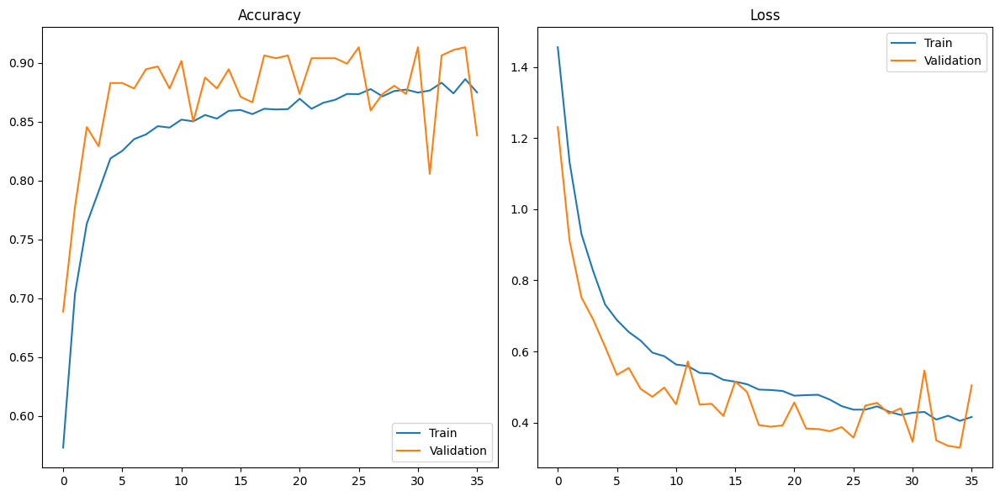

In [12]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

#### Model Architecture Simplification:

Reduced to single GRU layer (32 units instead of 48+24)

Single dense layer (16 units)

Lighter regularization (0.0001 instead of 0.0005)

#### Training Process

Larger batch size (256) for better GPU utilization

Reduced maximum epochs (80)

#### Selective Data Augmentation:

Only augments 50% of samples instead of 100%

Uses fewer noise factors (2 instead of 3)




In [ ]:
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GRU, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.regularizers import l1_l2


def create_stable_GRU_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    
    x = GRU(64,  # Increased units slightly for better learning
            kernel_regularizer=l1_l2(l1=0.00001, l2=0.00001),  # Much lighter regularization
            recurrent_regularizer=None,  # Remove recurrent regularization
            dropout=0.2,
            recurrent_dropout=0.2,
            activation='tanh',
            reset_after=True)(inputs)
    
    x = BatchNormalization()(x)
    
    
    x = Dense(32, activation='relu')(x)  # Removed regularization
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax',
                   kernel_initializer='glorot_uniform')(x)  # Explicit good initialization
    
    return Model(inputs, outputs)


mixed_precision.set_global_policy('float32')


optimizer = Adam(learning_rate=0.0005,  # Reduced from 0.002
                clipnorm=1.0,
                epsilon=1e-7)  # Added epsilon for stability


print("Label distribution:", np.unique(np.argmax(Y_train_aug, axis=1), return_counts=True))
print("Sample min/max:", X_train_aug.min(), X_train_aug.max())


stable_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=15, min_delta=0.005),
    ModelCheckpoint('stable_model.keras', monitor='val_accuracy'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, min_lr=1e-6)
]


model = create_fast_GRU_model((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.002, clipnorm=1.0),  # Higher LR with gradient clipping
              loss='categorical_crossentropy',
              metrics=['accuracy'])


history = model.fit(X_train_aug, Y_train_aug,
                   batch_size=256,  # Larger batch size for faster training
                   epochs=80,  # Reduced max epochs
                   validation_data=(X_val, Y_val),
                   callbacks=fast_callbacks,
                   verbose=1)  # Minimal output

Label distribution: (array([0, 1, 2]), array([1121, 1140, 1148]))
Sample min/max: -1580000000000000.0 2.61e+18
Epoch 1/80
14/14 ━━━━━━━━━━━━━━━━━━━━ 245s 17s/step - accuracy: 0.4041 - loss: 1.3783 - val_accuracy: 0.3372 - val_loss: 1.1270 - learning_rate: 0.0020
Epoch 2/80
14/14 ━━━━━━━━━━━━━━━━━━━━ 239s 17s/step - accuracy: 0.4762 - loss: 1.0409 - val_accuracy: 0.5457 - val_loss: 0.9441 - learning_rate: 0.0020
Epoch 3/80
14/14 ━━━━━━━━━━━━━━━━━━━━ 241s 17s/step - accuracy: 0.6187 - loss: 0.8882 - val_accuracy: 0.6534 - val_loss: 0.8174 - learning_rate: 0.0020
Epoch 4/80
14/14 ━━━━━━━━━━━━━━━━━━━━ 238s 17s/step - accuracy: 0.6690 - loss: 0.7926 - val_accuracy: 0.7002 - val_loss: 0.7646 - learning_rate: 0.0020
Epoch 5/80
14/14 ━━━━━━━━━━━━━━━━━━━━ 237s 17s/step - accuracy: 0.6812 - loss: 0.7555 - val_accuracy: 0.7377 - val_loss: 0.6988 - learning_rate: 0.0020
Epoch 6/80
14/14 ━━━━━━━━━━━━━━━━━━━━ 235s 17s/step - accuracy: 0.7259 - loss: 0.6734 - val_accuracy: 0.7986 - val_loss: 0.5747 -

In [12]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")



Test Accuracy: 0.8970


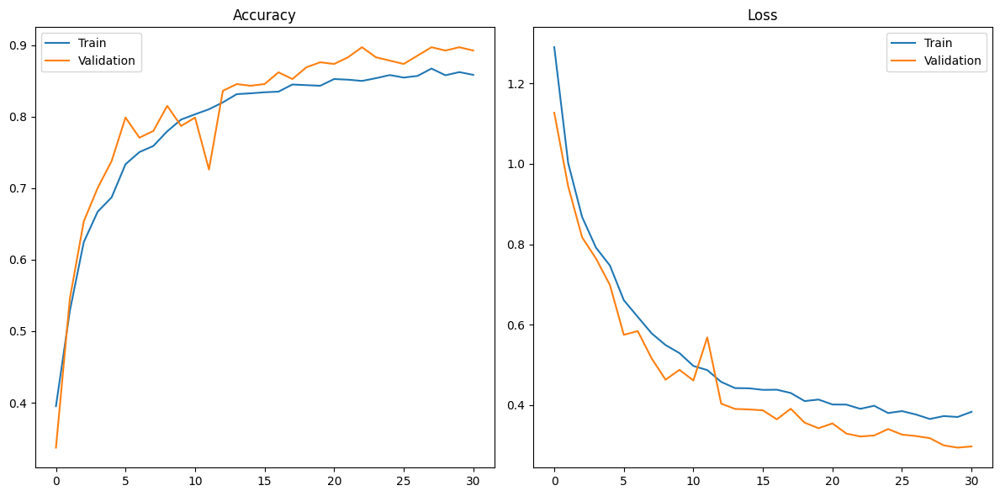

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

Simple Feedforward Network 

In [14]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

def create_FFN_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = Flatten()(inputs)
    
    # Simple 3-layer network
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)

ffn_model = create_FFN_model((X_train.shape[1], 1), 3)
ffn_model.compile(optimizer=Adam(learning_rate=0.001),
                 loss='categorical_crossentropy',
                 metrics=['accuracy'])

history = ffn_model.fit(X_train, Y_train,
                       batch_size=512,  
                       epochs=30, 
                       validation_data=(X_val, Y_val),
                       callbacks=fast_callbacks)

Epoch 1/30


I0000 00:00:1754425817.402398    2196 service.cc:152] XLA service 0x7f08fc00f820 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1754425817.403105    2196 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2025-08-05 13:30:17.534939: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1754425817.964524    2196 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-08-05 13:30:20.307417: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1090', 28 bytes spill stores, 28 bytes spill loads

2025-08-05 13:30:20.358953: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusio

1/4 ━━━━━━━━━━━━━━━━━━━━ 21s 7s/step - accuracy: 0.1602 - loss: 378694749126656.0000

I0000 00:00:1754425823.006013    2196 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2025-08-05 13:30:24.593400: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1090', 340 bytes spill stores, 340 bytes spill loads



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.1982 - loss: 253355154735104.0000 

2025-08-05 13:30:28.184441: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_62', 132 bytes spill stores, 132 bytes spill loads

2025-08-05 13:30:28.513434: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_62', 216 bytes spill stores, 220 bytes spill loads

2025-08-05 13:30:28.683727: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_62', 12 bytes spill stores, 12 bytes spill loads



4/4 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - accuracy: 0.2040 - loss: 240293186109440.0000 - val_accuracy: 0.4496 - val_loss: 7457259651072.0000 - learning_rate: 0.0010
Epoch 2/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.3934 - loss: 86806615818240.0000 - val_accuracy: 0.4965 - val_loss: 8965186387968.0000 - learning_rate: 0.0010
Epoch 3/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.4518 - loss: 63964985688064.0000 - val_accuracy: 0.5129 - val_loss: 9442370256896.0000 - learning_rate: 0.0010
Epoch 4/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.4750 - loss: 35827606355968.0000 - val_accuracy: 0.5199 - val_loss: 8617349611520.0000 - learning_rate: 0.0010
Epoch 5/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.5084 - loss: 18998246768640.0000 - val_accuracy: 0.5293 - val_loss: 7025248436224.0000 - learning_rate: 0.0010
Epoch 6/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.5015 - loss: 18931423117312.0000 - val_accuracy: 0.5480 - val_loss: 4641763360

In [15]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")



Test Accuracy: 0.8970


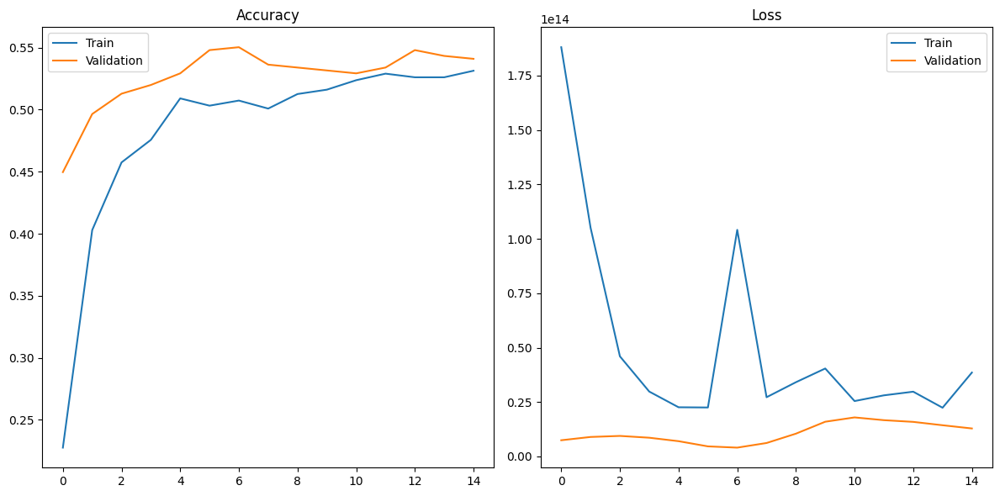

In [16]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
import numpy as np


X_train = (X_train - np.mean(X_train, axis=0)) / (np.std(X_train, axis=0) + 1e-8)
X_val = (X_val - np.mean(X_val, axis=0)) / (np.std(X_val, axis=0) + 1e-8)


def create_stable_FFN(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = Flatten()(inputs)
    
    # Layer 1 with BatchNorm and L2 regularization
    x = Dense(128, activation='relu', 
              kernel_regularizer=l2(0.001),
              kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    
    # Layer 2 with BatchNorm
    x = Dense(64, activation='relu',
              kernel_regularizer=l2(0.001),
              kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.2)(x)
    
    
    outputs = Dense(num_classes, activation='softmax',
                   kernel_initializer='glorot_uniform')(x)
    
    return Model(inputs, outputs)


optimized_callbacks = [
    EarlyStopping(monitor='val_accuracy', 
                 patience=15,
                 restore_best_weights=True,
                 min_delta=0.005),
    ReduceLROnPlateau(monitor='val_loss',
                     factor=0.5,
                     patience=5,
                     min_lr=1e-6)
]


model = create_stable_FFN((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.0005,  # Reduced from 0.001
                           clipnorm=1.0),  # Gradient clipping
             loss='categorical_crossentropy',
             metrics=['accuracy'])


history = model.fit(X_train, Y_train,
                   batch_size=256,  # Balanced batch size
                   epochs=100,  # Allowing more epochs with early stopping
                   validation_data=(X_val, Y_val),
                   callbacks=optimized_callbacks,
                   shuffle=True,  # Important for stability
                   verbose=1)

Epoch 1/100


2025-08-05 17:48:22.939925: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_113', 100 bytes spill stores, 100 bytes spill loads

2025-08-05 17:48:23.325914: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_113', 192 bytes spill stores, 192 bytes spill loads

2025-08-05 17:48:23.348311: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_113_0', 436 bytes spill stores, 428 bytes spill loads

2025-08-05 17:48:23.457274: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_113', 264 bytes spill stores, 264 bytes spill loads

2025-08-05 17:48:25.873000: I exte

5/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.2792 - loss: 1.8667 

2025-08-05 17:48:33.562332: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_113', 4 bytes spill stores, 4 bytes spill loads

2025-08-05 17:48:34.150435: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_113', 192 bytes spill stores, 192 bytes spill loads

2025-08-05 17:48:34.316487: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_113_0', 488 bytes spill stores, 436 bytes spill loads

2025-08-05 17:48:34.530780: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_113', 164 bytes spill stores, 164 bytes spill loads

2025-08-05 17:48:35.284028: I external

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2915 - loss: 1.8463  

2025-08-05 17:48:41.745099: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_89', 164 bytes spill stores, 164 bytes spill loads

2025-08-05 17:48:41.831465: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_89_0', 488 bytes spill stores, 436 bytes spill loads

2025-08-05 17:48:41.849191: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_89', 4 bytes spill stores, 4 bytes spill loads

2025-08-05 17:48:42.418251: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_89', 192 bytes spill stores, 192 bytes spill loads

2025-08-05 17:48:42.496039: I external/loc

7/7 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.2955 - loss: 1.8395 - val_accuracy: 0.5738 - val_loss: 1.4467 - learning_rate: 5.0000e-04
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4375 - loss: 1.5520 - val_accuracy: 0.5855 - val_loss: 1.3961 - learning_rate: 5.0000e-04
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5826 - loss: 1.2990 - val_accuracy: 0.6300 - val_loss: 1.3357 - learning_rate: 5.0000e-04
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.6146 - loss: 1.2380 - val_accuracy: 0.6370 - val_loss: 1.2993 - learning_rate: 5.0000e-04
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.6142 - loss: 1.1708 - val_accuracy: 0.6557 - val_loss: 1.2639 - learning_rate: 5.0000e-04
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6305 - loss: 1.1245 - val_accuracy: 0.6534 - val_loss: 1.2252 - learning_rate: 5.0000e-04
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6231 - loss: 1.1125 - val

In [36]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")



Test Accuracy: 0.6557


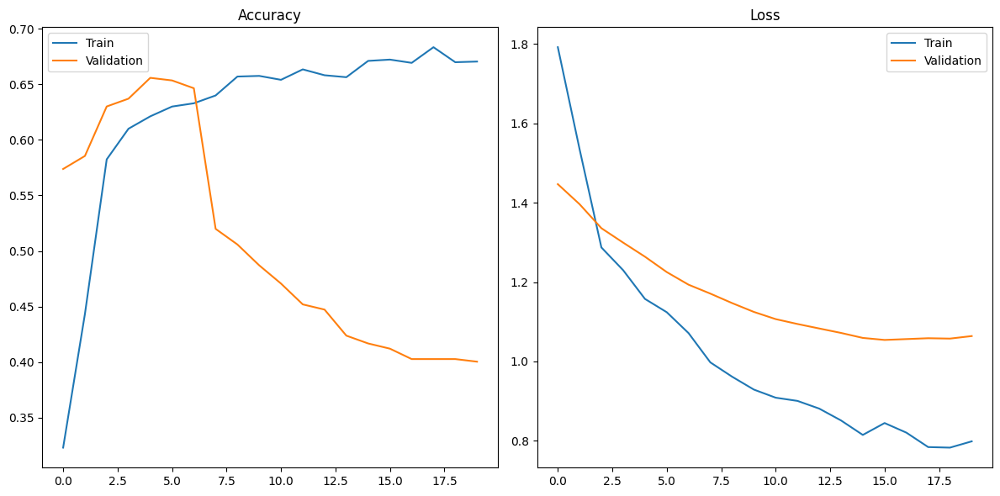

In [37]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [32]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
import numpy as np

# Enhanced data normalization with range checking
def robust_normalize(X):
    X_norm = (X - np.mean(X)) / (np.std(X) + 1e-8)
    if np.any(np.isnan(X_norm)) or np.any(np.isinf(X_norm)):
        print("Warning: NaN/Inf detected after normalization - using min-max scaling instead")
        X_norm = (X - np.min(X)) / (np.max(X) - np.min(X) + 1e-8)
    return X_norm

X_train = robust_normalize(X_train)
X_val = robust_normalize(X_val)

# Optimized model architecture
def create_optimized_FFN(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = Flatten()(inputs)
    
    # Enhanced architecture with residual connection
    x1 = Dense(128, activation='relu', 
              kernel_initializer='he_normal',
              kernel_regularizer=l2(0.001))(x)
    x1 = BatchNormalization()(x1)
    x1 = Dropout(0.3)(x1)
    
    x2 = Dense(64, activation='relu',
              kernel_initializer='he_normal',
              kernel_regularizer=l2(0.001))(x1)
    x2 = BatchNormalization()(x2)
    
    # Residual connection
    x = tf.keras.layers.concatenate([x1, x2])
    x = Dropout(0.2)(x)
    
    outputs = Dense(num_classes, activation='softmax',
                   kernel_initializer='glorot_normal')(x)
    
    return Model(inputs, outputs)

# Dynamic learning rate schedule
initial_lr = 0.0005
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_lr,
    decay_steps=1000,
    decay_rate=0.9,
    staircase=True)

# Enhanced callbacks
optimized_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=20, 
                 restore_best_weights=True, min_delta=0.005),
    ModelCheckpoint('best_model.keras', monitor='val_accuracy',
                  save_best_only=True, mode='max'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                     patience=8, min_lr=1e-6)
]

# Create and compile
model = create_optimized_FFN((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=lr_schedule, 
                           clipnorm=1.0),
             loss='categorical_crossentropy',
             metrics=['accuracy'])

# Data augmentation (simple version)
def simple_augment(X, y):
    X_noisy = X + 0.01 * np.random.normal(size=X.shape)
    return np.concatenate([X, X_noisy]), np.concatenate([y, y])

X_train_aug, Y_train_aug = simple_augment(X_train, Y_train)

# Training with validation
history = model.fit(X_train_aug, Y_train_aug,
                   batch_size=128,
                   epochs=100,
                   validation_data=(X_val, Y_val),
                   callbacks=optimized_callbacks,
                   verbose=1)

Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 297ms/step - accuracy: 0.4029 - loss: 1.5965 - val_accuracy: 0.6721 - val_loss: 1.3615 - learning_rate: 5.0000e-04
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5740 - loss: 1.3268 - val_accuracy: 0.6792 - val_loss: 1.3440 - learning_rate: 5.0000e-04
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6271 - loss: 1.2085 - val_accuracy: 0.5574 - val_loss: 1.3500 - learning_rate: 5.0000e-04
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6567 - loss: 1.1587 - val_accuracy: 0.5550 - val_loss: 1.3654 - learning_rate: 5.0000e-04
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6869 - loss: 1.0679 - val_accuracy: 0.5527 - val_loss: 1.3528 - learning_rate: 5.0000e-04
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7279 - loss: 1.0033 - val_accuracy: 0.5550 - val_loss: 1.3366 - learning_rate: 5.0000e-04
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy

In [33]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


Test Accuracy: 0.6792


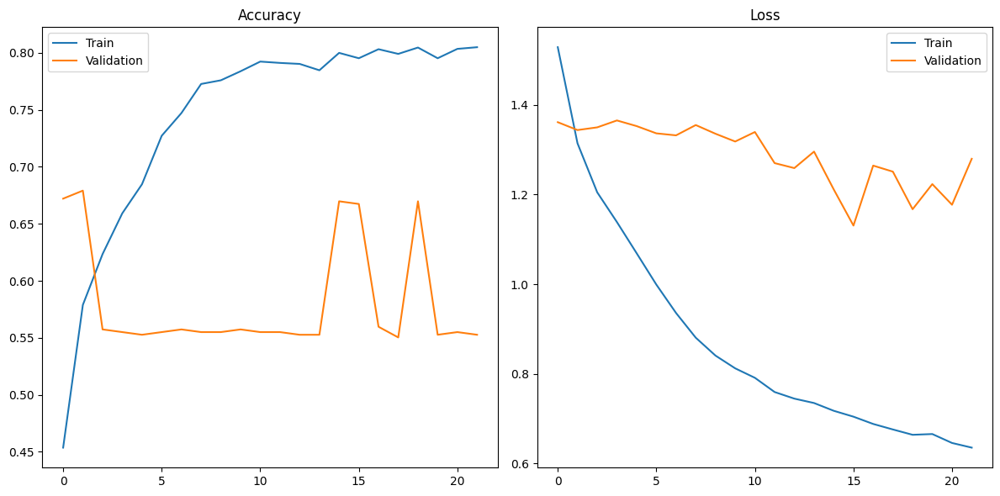

In [34]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

LSTM with Dropout 0.5

In [7]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard

def create_enhanced_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = LSTM(64, return_sequences=True,  # Reduced from 128
             kernel_regularizer=l2(0.001),  # Reduced from 0.01
             recurrent_regularizer=l2(0.001),  # Reduced from 0.01
             dropout=0.2,
             recurrent_dropout=0.2)(inputs)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)# from 0.3 to o.4
    x = LSTM(32,  # Reduced from 64
             kernel_regularizer=l2(0.001),  # Reduced from 0.005
             recurrent_regularizer=l2(0.001),  # Reduced from 0.005
             dropout=0.5,
             recurrent_dropout=0.5)(x)#from 0.1 to 0.5
    x = BatchNormalization()(x)
    x = Dense(32, activation='relu', kernel_regularizer=l2(0.001))(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    return Model(inputs, outputs)

def time_series_augmentation(X, y, noise_factor=0.01):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

# Data augmentation (only do this once - your original code does it twice)
X_train_aug, Y_train_aug = time_series_augmentation(X_train, Y_train)

# More efficient callbacks
enhanced_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True),  # Reduced from 25
    ModelCheckpoint('enhanced_model.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6),  # Reduced from 8
    TensorBoard(log_dir='./logs')
]

# Model compilation and training with larger batch size
model = create_enhanced_model((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.0003, clipnorm=1.0),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train_aug, Y_train_aug,
                   batch_size=64,  # Increased from 32
                   epochs=200,
                   validation_data=(X_val, Y_val),
                   callbacks=enhanced_callbacks)

I0000 00:00:1755196095.399782     866 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3539 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Epoch 1/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2291s 42s/step - accuracy: 0.3398 - loss: 1.4449 - val_accuracy: 0.6253 - val_loss: 1.2499 - learning_rate: 3.0000e-04
Epoch 2/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2292s 42s/step - accuracy: 0.4584 - loss: 1.2532 - val_accuracy: 0.6487 - val_loss: 1.0991 - learning_rate: 3.0000e-04
Epoch 3/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2308s 43s/step - accuracy: 0.5056 - loss: 1.1704 - val_accuracy: 0.7283 - val_loss: 0.9235 - learning_rate: 3.0000e-04
Epoch 4/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2306s 43s/step - accuracy: 0.5698 - loss: 1.0794 - val_accuracy: 0.7541 - val_loss: 0.8196 - learning_rate: 3.0000e-04
Epoch 5/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2283s 42s/step - accuracy: 0.5976 - loss: 1.0259 - val_accuracy: 0.7611 - val_loss: 0.7762 - learning_rate: 3.0000e-04
Epoch 6/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2278s 42s/step - accuracy: 0.6212 - loss: 0.9817 - val_accuracy: 0.8103 - val_loss: 0.7097 - learning_rate: 3.0000e-04
Epoch 7/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2306s 43s/ste

In [8]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")



Test Accuracy: 0.8946


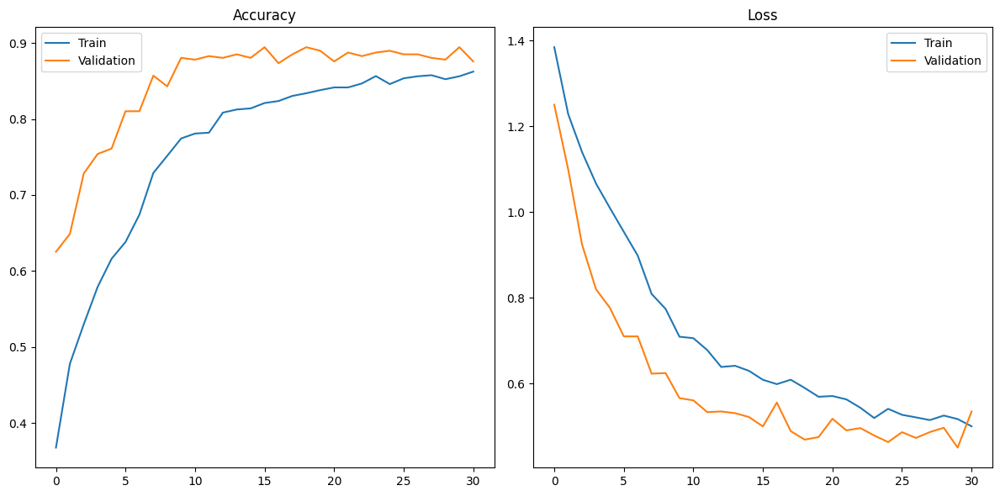

In [9]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

BILSTM Dropout with 0.5

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split



input_shape = (X_train.shape[1], X_train.shape[2])  # (timesteps, features)
num_classes = Y_train.shape[1]
print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

def create_optimized_bilstm(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    # First BiLSTM layer with return sequences
    x = Bidirectional(LSTM(64, return_sequences=True,
                        kernel_regularizer=l2(1e-4),
                        recurrent_regularizer=l2(1e-4),
                        dropout=0.2,
                        recurrent_dropout=0.1))(inputs)
    x = BatchNormalization()(x)
    
    # Second BiLSTM layer
    x = Bidirectional(LSTM(32,
                        kernel_regularizer=l2(1e-4),
                        dropout=0.5,
                        recurrent_dropout=0.5))(x)
    x = BatchNormalization()(x)
    
    # Dense layers
    x = Dense(64, activation='relu', kernel_regularizer=l2(1e-4))(x)
    x = Dropout(0.5)(x)
    x = Dense(32, activation='relu')(x)
    x = Dropout(0.3)(x) 
    
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)

# Callbacks configuration
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=12, restore_best_weights=True, min_delta=0.005),
    ModelCheckpoint('best_bilstm_model.h5', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]


model = create_optimized_bilstm(input_shape, num_classes)
model.compile(
    optimizer=Adam(learning_rate=0.001, clipnorm=1.0), #change optimizer
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

#apply smoothing 

model.summary()


batch_size = 64 #128,256
epochs = 100


history = model.fit(
    X_train, Y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, Y_val),
    callbacks=callbacks,
    verbose=1
)


val_loss, val_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nValidation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

Input shape: (2548, 1)
Number of classes: 3


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 2548, 1)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 2548, 128)      │        33,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 2548, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 64)             │        41,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 82,115 (320.76 KB)

 Trainable params: 81,731 (319.26 KB)

 Non-trainable params: 384 (1.50 KB)

Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 104s/step - accuracy: 0.3527 - loss: 1.5937  

27/27 ━━━━━━━━━━━━━━━━━━━━ 21379s 818s/step - accuracy: 0.3539 - loss: 1.5872 - val_accuracy: 0.6698 - val_loss: 1.0384 - learning_rate: 0.0010
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 106s/step - accuracy: 0.4706 - loss: 1.0702  

27/27 ━━━━━━━━━━━━━━━━━━━━ 3050s 114s/step - accuracy: 0.4720 - loss: 1.0685 - val_accuracy: 0.6815 - val_loss: 0.8991 - learning_rate: 0.0010
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 105s/step - accuracy: 0.5746 - loss: 0.9377  

27/27 ━━━━━━━━━━━━━━━━━━━━ 3029s 113s/step - accuracy: 0.5752 - loss: 0.9369 - val_accuracy: 0.7073 - val_loss: 0.7678 - learning_rate: 0.0010
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 104s/step - accuracy: 0.6444 - loss: 0.7984  

27/27 ━━━━━━━━━━━━━━━━━━━━ 3008s 112s/step - accuracy: 0.6450 - loss: 0.7975 - val_accuracy: 0.8009 - val_loss: 0.6706 - learning_rate: 0.0010
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 1395s/step - accuracy: 0.6925 - loss: 0.7068   

27/27 ━━━━━━━━━━━━━━━━━━━━ 36592s 1403s/step - accuracy: 0.6930 - loss: 0.7063 - val_accuracy: 0.8806 - val_loss: 0.5601 - learning_rate: 0.0010
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 107s/step - accuracy: 0.7441 - loss: 0.6249  

27/27 ━━━━━━━━━━━━━━━━━━━━ 3108s 115s/step - accuracy: 0.7442 - loss: 0.6250 - val_accuracy: 0.9110 - val_loss: 0.4351 - learning_rate: 0.0010
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 3027s 112s/step - accuracy: 0.7437 - loss: 0.6110 - val_accuracy: 0.9063 - val_loss: 0.3612 - learning_rate: 0.0010
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 3032s 113s/step - accuracy: 0.7774 - loss: 0.5317 - val_accuracy: 0.9110 - val_loss: 0.3030 - learning_rate: 0.0010
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 3129s 116s/step - accuracy: 0.8220 - loss: 0.4747 - val_accuracy: 0.9110 - val_loss: 0.2846 - learning_rate: 0.0010
Epoch 10/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 106s/step - accuracy: 0.8371 - loss: 0.4563  

27/27 ━━━━━━━━━━━━━━━━━━━━ 3077s 114s/step - accuracy: 0.8372 - loss: 0.4557 - val_accuracy: 0.9157 - val_loss: 0.2775 - learning_rate: 0.0010
Epoch 11/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 3032s 113s/step - accuracy: 0.8565 - loss: 0.4196 - val_accuracy: 0.9016 - val_loss: 0.3045 - learning_rate: 0.0010
Epoch 12/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 2998s 111s/step - accuracy: 0.8456 - loss: 0.4055 - val_accuracy: 0.9063 - val_loss: 0.2950 - learning_rate: 0.0010
Epoch 13/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 3034s 113s/step - accuracy: 0.8489 - loss: 0.4085 - val_accuracy: 0.9040 - val_loss: 0.3130 - learning_rate: 0.0010
Epoch 14/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 3073s 114s/step - accuracy: 0.8598 - loss: 0.4007 - val_accuracy: 0.9040 - val_loss: 0.3319 - learning_rate: 0.0010
Epoch 15/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 3017s 112s/step - accuracy: 0.8639 - loss: 0.3743 - val_accuracy: 0.8759 - val_loss: 0.4650 - learning_rate: 0.0010
Epoch 16/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 2992s 111s/step - accuracy: 0.8735 - 

In [11]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")



Test Accuracy: 0.9110


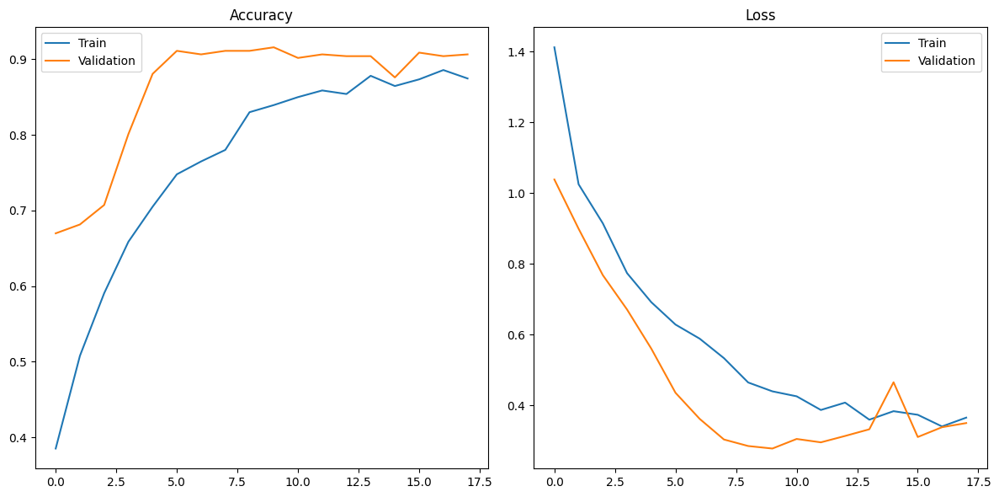

In [12]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

GRU with Dropout

In [6]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.layers import GRU  # Changed from LSTM to GRU

def create_enhanced_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = GRU(64, return_sequences=True,  # Changed LSTM to GRU
             kernel_regularizer=l2(0.001),
             recurrent_regularizer=l2(0.001),
             dropout=0.2,
             recurrent_dropout=0.2)(inputs)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)
    x = GRU(32,  # Changed LSTM to GRU
             kernel_regularizer=l2(0.001),
             recurrent_regularizer=l2(0.001),
             dropout=0.5,
             recurrent_dropout=0.5)(x)
    x = BatchNormalization()(x)
    x = Dense(32, activation='relu', kernel_regularizer=l2(0.001))(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    return Model(inputs, outputs)

def time_series_augmentation(X, y, noise_factor=0.01):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

# Data augmentation (only do this once - your original code does it twice)
X_train_aug, Y_train_aug = time_series_augmentation(X_train, Y_train)

# More efficient callbacks
enhanced_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True),
    ModelCheckpoint('enhanced_model.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6),
    TensorBoard(log_dir='./logs')
]

# Model compilation and training with larger batch size
model = create_enhanced_model((X_train.shape[1], 1), 3)
model.compile(optimizer=Adam(learning_rate=0.0003, clipnorm=1.0),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train_aug, Y_train_aug,
                   batch_size=64,
                   epochs=200,
                   validation_data=(X_val, Y_val),
                   callbacks=enhanced_callbacks)

I0000 00:00:1755495690.408046     840 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3539 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Epoch 1/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2149s 40s/step - accuracy: 0.3542 - loss: 1.5914 - val_accuracy: 0.5785 - val_loss: 1.1783 - learning_rate: 3.0000e-04
Epoch 2/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2140s 40s/step - accuracy: 0.4573 - loss: 1.2776 - val_accuracy: 0.6276 - val_loss: 1.0474 - learning_rate: 3.0000e-04
Epoch 3/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2135s 40s/step - accuracy: 0.5072 - loss: 1.1428 - val_accuracy: 0.6206 - val_loss: 0.9520 - learning_rate: 3.0000e-04
Epoch 4/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 31391s 592s/step - accuracy: 0.5462 - loss: 1.0874 - val_accuracy: 0.6557 - val_loss: 0.8731 - learning_rate: 3.0000e-04
Epoch 5/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2164s 40s/step - accuracy: 0.5874 - loss: 1.0328 - val_accuracy: 0.7096 - val_loss: 0.8124 - learning_rate: 3.0000e-04
Epoch 6/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2169s 40s/step - accuracy: 0.5870 - loss: 1.0008 - val_accuracy: 0.7447 - val_loss: 0.7321 - learning_rate: 3.0000e-04
Epoch 7/200
54/54 ━━━━━━━━━━━━━━━━━━━━ 2126s 39s/s

In [7]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")



Test Accuracy: 0.8923


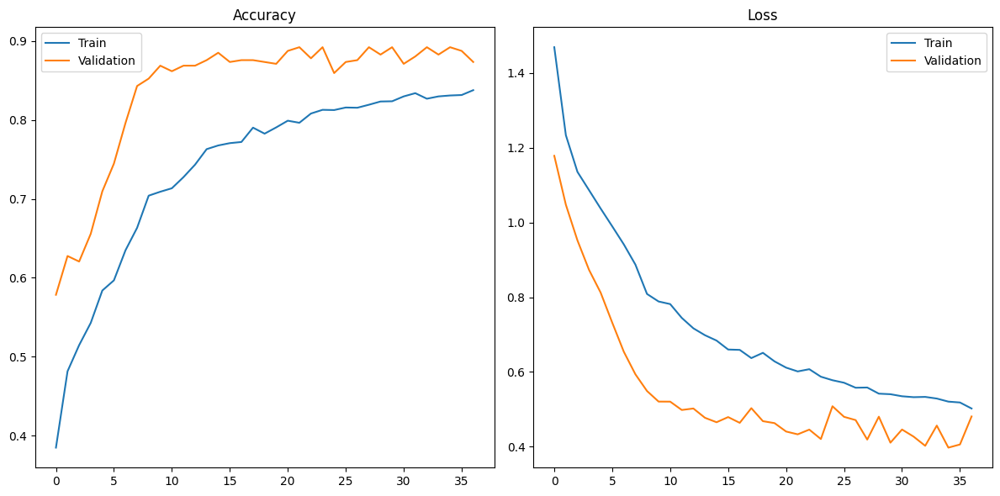

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

Transformers

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling1D

# Load and preprocess data

data = pd.read_csv('emotions.csv')
labels = data['label']
features = data.drop('label', axis=1)

# Reshape features for time series input
X = features.values.reshape((features.shape[0], features.shape[1], 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)
Y = to_categorical(y_encoded)

# Train-validation split
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)


# Transformer Encoder Block

def transformer_encoder(inputs, num_heads, ff_dim, dropout_rate=0.3):
    # Multi-head self-attention
    attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=inputs.shape[-1])(inputs, inputs)
    attn_output = Dropout(dropout_rate)(attn_output)
    out1 = LayerNormalization(epsilon=1e-6)(inputs + attn_output)  # Residual + norm

    # Feed-forward network
    ffn = Dense(ff_dim, activation='relu', kernel_regularizer=l2(0.001))(out1)
    ffn = Dropout(dropout_rate)(ffn)
    ffn = Dense(inputs.shape[-1], kernel_regularizer=l2(0.001))(ffn)
    out2 = LayerNormalization(epsilon=1e-6)(out1 + ffn)  # Residual + norm
    return out2



def create_transformer_model(input_shape, num_classes, num_heads=2, ff_dim=32, num_layers=1):
    inputs = Input(shape=input_shape)

    # Smaller embedding projection
    x = Dense(32, activation='linear')(inputs)

    # Transformer encoder blocks
    for _ in range(num_layers):
        x = transformer_encoder(x, num_heads=num_heads, ff_dim=ff_dim, dropout_rate=0.2)

    # Global average pooling (Keras layer, avoids tf.reduce_mean issue)
    x = GlobalAveragePooling1D()(x)

    # Dense classifier head
    x = Dense(32, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    return Model(inputs, outputs)

# Data Augmentation

def time_series_augmentation(X, y, noise_factor=0.01):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

X_train_aug, Y_train_aug = time_series_augmentation(X_train, Y_train)


# Callbacks

transformer_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True),
    ModelCheckpoint('transformer_model.keras', monitor='val_accuracy', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6),
    TensorBoard(log_dir='./logs')
]


# Compile & Train

model = create_transformer_model((X_train.shape[1], 1), num_classes=3)
model.compile(optimizer=Adam(learning_rate=0.0003, clipnorm=1.0),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(X_train_aug, Y_train_aug,
                   batch_size=16,   # was 64
                   epochs=200,
                   validation_data=(X_val, Y_val),
                   callbacks=transformer_callbacks)



Epoch 1/200


2025-09-02 12:09:33.623336: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 8 bytes spill stores, 8 bytes spill loads

2025-09-02 12:09:33.673175: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 4 bytes spill stores, 4 bytes spill loads

2025-09-02 12:09:34.065753: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 8 bytes spill stores, 8 bytes spill loads

2025-09-02 12:09:35.774071: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_35', 4 bytes spill stores, 4 bytes spill loads

2025-09-02 12:09:36.018169: I external/local_xla/xla/str

213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4382 - loss: 1.1579

2025-09-02 12:10:13.465571: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 8 bytes spill stores, 8 bytes spill loads

2025-09-02 12:10:14.333660: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 4 bytes spill stores, 4 bytes spill loads

2025-09-02 12:10:15.076188: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 8 bytes spill stores, 8 bytes spill loads

2025-09-02 12:10:15.695124: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_35', 4 bytes spill stores, 4 bytes spill loads

2025-09-02 12:10:15.985016: I external/local_xla/xla/str

214/214 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.4383 - loss: 1.1578

2025-09-02 12:10:37.512577: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 4 bytes spill stores, 4 bytes spill loads

2025-09-02 12:10:37.801413: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 8 bytes spill stores, 8 bytes spill loads

2025-09-02 12:10:37.955358: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 8 bytes spill stores, 8 bytes spill loads



214/214 ━━━━━━━━━━━━━━━━━━━━ 74s 219ms/step - accuracy: 0.4385 - loss: 1.1577 - val_accuracy: 0.4239 - val_loss: 1.1274 - learning_rate: 3.0000e-04
Epoch 2/200
214/214 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - accuracy: 0.5196 - loss: 1.0486 - val_accuracy: 0.6534 - val_loss: 0.8172 - learning_rate: 3.0000e-04
Epoch 3/200
214/214 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.6482 - loss: 0.8475 - val_accuracy: 0.6253 - val_loss: 0.7704 - learning_rate: 3.0000e-04
Epoch 4/200
214/214 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - accuracy: 0.6562 - loss: 0.7718 - val_accuracy: 0.6089 - val_loss: 0.7231 - learning_rate: 3.0000e-04
Epoch 5/200
214/214 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - accuracy: 0.6681 - loss: 0.7275 - val_accuracy: 0.6300 - val_loss: 0.6947 - learning_rate: 3.0000e-04
Epoch 6/200
214/214 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6752 - loss: 0.7011 - val_accuracy: 0.6370 - val_loss: 0.6672 - learning_rate: 3.0000e-04
Epoch 7/200
214/214 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - 

In [5]:
test_loss, test_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"\nTest Accuracy: {test_acc:.4f}")


2025-09-02 12:19:02.491399: W external/local_xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3021] Can't reduce memory use below 3.05GiB (3274886061 bytes) by rematerialization; only reduced to 3.10GiB (3328253968 bytes), down from 3.10GiB (3328253968 bytes) originally
2025-09-02 12:19:03.601057: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 8 bytes spill stores, 8 bytes spill loads

2025-09-02 12:19:03.643239: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 8 bytes spill stores, 8 bytes spill loads

2025-09-02 12:19:04.371378: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 4 bytes spill stores, 4 bytes spill loads




Test Accuracy: 0.7026


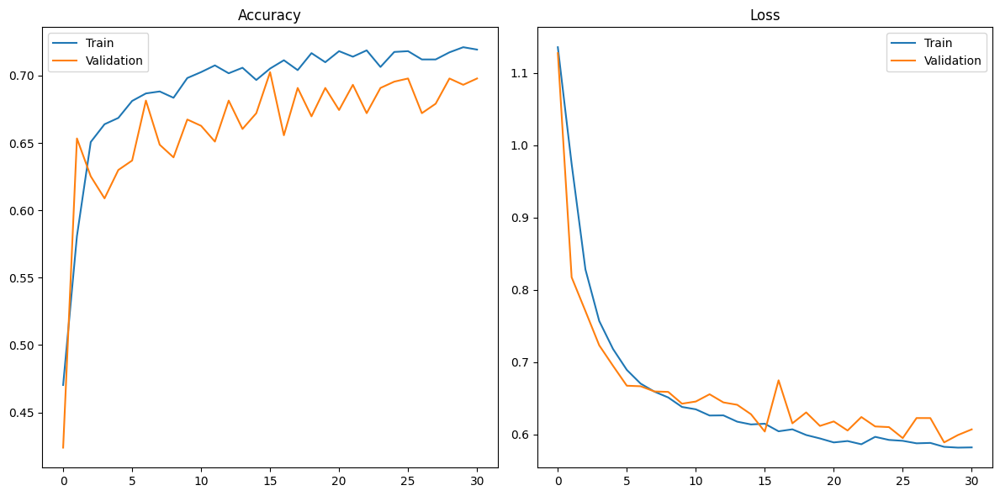

In [6]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

Making the Transformer Deeper

Right now only stacking num_layers=1. 
Transformers often need depth.

In [3]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
import tensorflow as tf

# Set memory growth to prevent TensorFlow from allocating all GPU memory at once
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"Found {len(gpus)} GPU(s), enabled memory growth")
    except RuntimeError as e:
        print(e)

# Load and preprocess data
data = pd.read_csv('emotions.csv')
labels = data['label']
features = data.drop('label', axis=1)

# Reshape features for time series input
X = features.values.reshape((features.shape[0], features.shape[1], 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)
Y = to_categorical(y_encoded)

# Train-validation split
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)


# Positional Encoding (CRITICAL for transformers!)
def positional_encoding(seq_len, d_model):
    
    position = np.arange(seq_len)[:, np.newaxis]
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    
    pos_encoding = np.zeros((seq_len, d_model))
    pos_encoding[:, 0::2] = np.sin(position * div_term)
    pos_encoding[:, 1::2] = np.cos(position * div_term)
    
    return tf.constant(pos_encoding, dtype=tf.float32)


# Improved Transformer Encoder Block
def transformer_encoder(inputs, num_heads, d_model, ff_dim, dropout_rate=0.2):
    
    # Multi-head self-attention with correct key_dim
    attn_output = MultiHeadAttention(
        num_heads=num_heads, 
        key_dim=d_model // num_heads,  # Proper key dimension
        dropout=dropout_rate
    )(inputs, inputs)
    attn_output = Dropout(dropout_rate)(attn_output)
    out1 = LayerNormalization(epsilon=1e-6)(inputs + attn_output)
    
    # Feed-forward network with expansion
    ffn = Dense(ff_dim, activation='gelu', kernel_regularizer=l2(0.001))(out1)
    ffn = Dropout(dropout_rate)(ffn)
    ffn = Dense(d_model, kernel_regularizer=l2(0.001))(ffn)
    ffn = Dropout(dropout_rate)(ffn)
    out2 = LayerNormalization(epsilon=1e-6)(out1 + ffn)
    
    return out2


def create_improved_transformer_model(input_shape, num_classes, d_model=64, num_heads=4, ff_dim=128, num_layers=3):
    
    inputs = Input(shape=input_shape)
    seq_len = input_shape[0]
    
    # Project input to d_model dimensions
    x = Dense(d_model, activation='linear', kernel_regularizer=l2(0.001))(inputs)
    
    # Add positional encoding
    pos_enc = positional_encoding(seq_len, d_model)
    x = x + pos_enc
    
    # Stack transformer encoder blocks
    for i in range(num_layers):
        x = transformer_encoder(
            x, 
            num_heads=num_heads, 
            d_model=d_model,
            ff_dim=ff_dim, 
            dropout_rate=0.2 + (i * 0.05)  # Gradually increase dropout
        )
    
    # Global pooling
    x = GlobalAveragePooling1D()(x)
    
    # Classification head with more capacity
    x = Dense(64, activation='gelu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.3)(x)
    x = Dense(32, activation='gelu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


# Data Augmentation (same as yours)
def time_series_augmentation(X, y, noise_factor=0.01):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

X_train_aug, Y_train_aug = time_series_augmentation(X_train, Y_train)


# Callbacks
transformer_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=20, restore_best_weights=True, verbose=1),
    ModelCheckpoint('transformer_model.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, min_lr=1e-7, verbose=1),
    TensorBoard(log_dir='./logs/transformer')
]


# Create and compile model
model = create_improved_transformer_model(
    (X_train.shape[1], 1), 
    num_classes=3,
    d_model=64,      # Increased from 32
    num_heads=4,     # Increased from 2
    ff_dim=128,      # Explicit feed-forward dim
    num_layers=3     # Increased from 1
)

# Use warmup learning rate for better convergence
initial_learning_rate = 0.0001
model.compile(
    optimizer=Adam(learning_rate=initial_learning_rate, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())

# Train with larger batch size (transformers need this!)
history = model.fit(
    X_train_aug, Y_train_aug,
    batch_size=32,  # Increased from 16 - IMPORTANT for transformers
    epochs=200,
    validation_data=(X_val, Y_val),
    callbacks=transformer_callbacks,
    verbose=1
)


# Evaluate
val_loss, val_accuracy = model.evaluate(X_val, Y_val, verbose=0)
print(f'\nFinal Validation Accuracy: {val_accuracy:.4f}')
print(f'Final Validation Loss: {val_loss:.4f}')

Physical devices cannot be modified after being initialized


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 2548, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_20 (Dense)    │ (None, 2548, 64)  │        128 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_14 (Add)        │ (None, 2548, 64)  │          0 │ dense_20[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 2548, 64)  │     16,640 │ add_14[0][0],     │
│ (MultiHeadAttentio… │                   │            │ add_14[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_29          │ (None, 2548, 64)  │          0 │ multi_head_atten… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_15 (Add)        │ (None, 2548, 64)  │          0 │ add_14[0][0],     │
│                     │                   │            │ dropout_29[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 64)  │        128 │ add_15[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_21 (Dense)    │ (None, 2548, 128) │      8,320 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_30          │ (None, 2548, 128) │          0 │ dense_21[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_22 (Dense)    │ (None, 2548, 64)  │      8,256 │ dropout_30[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_31          │ (None, 2548, 64)  │          0 │ dense_22[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_16 (Add)        │ (None, 2548, 64)  │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_31[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 64)  │        128 │ add_16[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 2548, 64)  │     16,640 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_33          │ (None, 2548, 64)  │          0 │ multi_head_atten… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_17 (Add)        │ (None, 2548, 64)  │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_33[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 64)  │        128 │ add_17[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_23 (Dense)    │ (None, 2548, 128) │      8,320 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 106,883 (417.51 KB)

 Trainable params: 106,883 (417.51 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/200


2025-10-08 12:56:55.969813: W external/local_xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3021] Can't reduce memory use below 1.58GiB (1695957728 bytes) by rematerialization; only reduced to 3.10GiB (3324059648 bytes), down from 3.10GiB (3324059648 bytes) originally
2025-10-08 12:56:56.102433: W external/local_xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3021] Can't reduce memory use below 1.58GiB (1695957728 bytes) by rematerialization; only reduced to 3.10GiB (3324059648 bytes), down from 3.10GiB (3324059648 bytes) originally
2025-10-08 12:56:56.102529: W external/local_xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3021] Can't reduce memory use below 1.58GiB (1695957728 bytes) by rematerialization; only reduced to 3.10GiB (3324059648 bytes), down from 3.10GiB (3324059648 bytes) originally
2025-10-08 12:56:56.102617: W external/local_xla/xla/hlo/transforms/simplifiers/hlo_rematerialization.cc:3021] Can't reduce memory use below 1.58GiB (1695

ResourceExhaustedError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel_launcher.py", line 18, in <module>

  File "/home/hitika/.local/lib/python3.10/site-packages/traitlets/config/application.py", line 1075, in launch_instance

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 739, in start

  File "/home/hitika/.local/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 211, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 545, in dispatch_queue

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 534, in process_one

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 437, in dispatch_shell

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 362, in execute_request

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 778, in execute_request

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 449, in do_execute

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 549, in run_cell

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3077, in run_cell

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3132, in _run_cell

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 128, in _pseudo_sync_runner

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3336, in run_cell_async

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3519, in run_ast_nodes

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3579, in run_code

  File "/tmp/ipykernel_947/4111991497.py", line 148, in <module>

  File "/home/hitika/.local/lib/python3.10/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/home/hitika/.local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 377, in fit

  File "/home/hitika/.local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 220, in function

  File "/home/hitika/.local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 133, in multi_step_on_iterator

Out of memory while trying to allocate 3324059648 bytes.
	 [[{{node StatefulPartitionedCall}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_multi_step_on_iterator_46308]

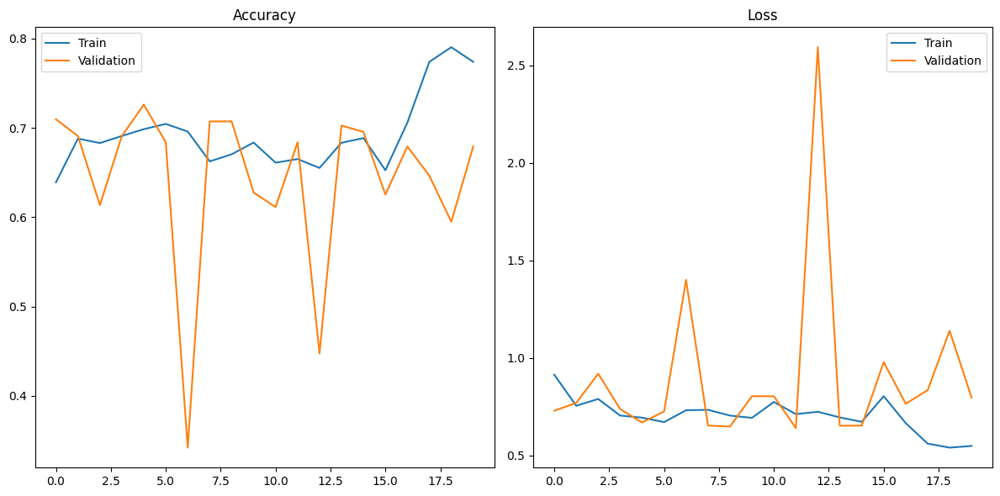

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import tensorflow as tf

# ============= CRITICAL: Memory Configuration =============
# 1. GPU Memory Growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"✓ Enabled memory growth for {len(gpus)} GPU(s)")
    except RuntimeError as e:
        print(e)

# 2. Disable XLA JIT compilation (reduces memory overhead)
tf.config.optimizer.set_jit(False)
print("✓ Disabled XLA JIT compilation")

# 3. Set memory limit if needed (uncomment and adjust)
# if gpus:
#     tf.config.set_logical_device_configuration(
#         gpus[0],
#         [tf.config.LogicalDeviceConfiguration(memory_limit=4096)]  # 4GB limit
#     )

# Load and preprocess data
data = pd.read_csv('emotions.csv')
labels = data['label']
features = data.drop('label', axis=1)

# Reshape features for time series input
X = features.values.reshape((features.shape[0], features.shape[1], 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)
Y = to_categorical(y_encoded)

# Train-validation split
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

print(f"Training samples: {X_train.shape[0]}")
print(f"Validation samples: {X_val.shape[0]}")
print(f"Sequence length: {X_train.shape[1]}")


# Positional Encoding
def positional_encoding(seq_len, d_model):
    position = np.arange(seq_len)[:, np.newaxis]
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    
    pos_encoding = np.zeros((seq_len, d_model))
    pos_encoding[:, 0::2] = np.sin(position * div_term)
    pos_encoding[:, 1::2] = np.cos(position * div_term)
    
    return tf.constant(pos_encoding, dtype=tf.float32)


# Lightweight Transformer Encoder Block
def transformer_encoder(inputs, num_heads, d_model, ff_dim, dropout_rate=0.2):
    # Multi-head self-attention
    attn_output = MultiHeadAttention(
        num_heads=num_heads, 
        key_dim=d_model // num_heads,
        dropout=dropout_rate
    )(inputs, inputs)
    attn_output = Dropout(dropout_rate)(attn_output)
    out1 = LayerNormalization(epsilon=1e-6)(inputs + attn_output)
    
    # Feed-forward network
    ffn = Dense(ff_dim, activation='gelu', kernel_regularizer=l2(0.001))(out1)
    ffn = Dropout(dropout_rate)(ffn)
    ffn = Dense(d_model, kernel_regularizer=l2(0.001))(ffn)
    ffn = Dropout(dropout_rate)(ffn)
    out2 = LayerNormalization(epsilon=1e-6)(out1 + ffn)
    
    return out2


def create_improved_transformer_model(input_shape, num_classes, d_model=32, num_heads=2, ff_dim=64, num_layers=2):
    inputs = Input(shape=input_shape)
    seq_len = input_shape[0]
    
    # Project input to d_model dimensions
    x = Dense(d_model, activation='linear', kernel_regularizer=l2(0.001))(inputs)
    
    # Add positional encoding
    pos_enc = positional_encoding(seq_len, d_model)
    x = x + pos_enc
    
    # Stack transformer encoder blocks
    for i in range(num_layers):
        x = transformer_encoder(
            x, 
            num_heads=num_heads, 
            d_model=d_model,
            ff_dim=ff_dim, 
            dropout_rate=0.2 + (i * 0.05)
        )
    
    # Global pooling
    x = GlobalAveragePooling1D()(x)
    
    # Classification head
    x = Dense(32, activation='gelu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.3)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


# SKIP DATA AUGMENTATION to save memory
# (You can add it back later once model trains successfully)
X_train_aug, Y_train_aug = X_train, Y_train
print(f"✓ Using {X_train_aug.shape[0]} training samples (augmentation disabled)")


# Callbacks
transformer_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=20, restore_best_weights=True, verbose=1),
    ModelCheckpoint('transformer_model.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, min_lr=1e-7, verbose=1)
]


# Create model with REDUCED parameters
model = create_improved_transformer_model(
    (X_train.shape[1], 1), 
    num_classes=3,
    d_model=32,      # Reduced - increase to 64 if you have more memory
    num_heads=2,     # Reduced - increase to 4 if you have more memory
    ff_dim=64,       # Reduced - increase to 128 if you have more memory
    num_layers=2     # Reduced - increase to 3 if you have more memory
)

# Compile
model.compile(
    optimizer=Adam(learning_rate=0.0001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy'],
    # Disable experimental features that use more memory
    run_eagerly=False
)

print("\n" + "="*70)
print(model.summary())
print("="*70)
print(f"Estimated memory per batch: ~3.1 GB")
print(f"Batch size: 8 (very conservative)")
print("="*70 + "\n")

# Train with VERY SMALL batch size
history = model.fit(
    X_train_aug, Y_train_aug,
    batch_size=8,  # START HERE - increase to 16 or 32 if successful
    epochs=200,
    validation_data=(X_val, Y_val),
    callbacks=transformer_callbacks,
    verbose=1
)

# Evaluate
val_loss, val_accuracy = model.evaluate(X_val, Y_val, verbose=0)
print(f'\n{"="*70}')
print(f'Final Validation Accuracy: {val_accuracy:.4f}')
print(f'Final Validation Loss: {val_loss:.4f}')
print("="*70)


Physical devices cannot be modified after being initialized
✓ Disabled XLA JIT compilation
Training samples: 1705
Validation samples: 427
Sequence length: 2548
✓ Using 1705 training samples (augmentation disabled)



Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 2548, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_30 (Dense)    │ (None, 2548, 32)  │         64 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_21 (Add)        │ (None, 2548, 32)  │          0 │ dense_30[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 2548, 32)  │      4,224 │ add_21[0][0],     │
│ (MultiHeadAttentio… │                   │            │ add_21[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_43          │ (None, 2548, 32)  │          0 │ multi_head_atten… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_22 (Add)        │ (None, 2548, 32)  │          0 │ add_21[0][0],     │
│                     │                   │            │ dropout_43[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 32)  │         64 │ add_22[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_31 (Dense)    │ (None, 2548, 64)  │      2,112 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_44          │ (None, 2548, 64)  │          0 │ dense_31[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_32 (Dense)    │ (None, 2548, 32)  │      2,080 │ dropout_44[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_45          │ (None, 2548, 32)  │          0 │ dense_32[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_23 (Add)        │ (None, 2548, 32)  │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_45[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 32)  │         64 │ add_23[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 2548, 32)  │      4,224 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_47          │ (None, 2548, 32)  │          0 │ multi_head_atten… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_24 (Add)        │ (None, 2548, 32)  │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_47[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 32)  │         64 │ add_24[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_33 (Dense)    │ (None, 2548, 64)  │      2,112 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 18,307 (71.51 KB)

 Trainable params: 18,307 (71.51 KB)

 Non-trainable params: 0 (0.00 B)

None
Estimated memory per batch: ~3.1 GB
Batch size: 8 (very conservative)

Epoch 1/200


2025-10-08 12:58:31.473843: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_13', 8 bytes spill stores, 8 bytes spill loads

2025-10-08 12:58:31.650436: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_59', 632 bytes spill stores, 632 bytes spill loads

2025-10-08 12:58:32.052621: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_59', 16 bytes spill stores, 16 bytes spill loads

2025-10-08 12:58:32.746368: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_59', 16 bytes spill stores, 16 bytes spill loads

2025-10-08 12:58:32.851952: I external/local_xla

213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - accuracy: 0.4237 - loss: 1.2568

2025-10-08 12:59:26.247987: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_26', 28 bytes spill stores, 28 bytes spill loads

2025-10-08 12:59:27.128329: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_26', 20 bytes spill stores, 20 bytes spill loads

2025-10-08 12:59:27.467818: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_27', 3944 bytes spill stores, 3856 bytes spill loads

2025-10-08 12:59:27.525225: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_27', 572 bytes spill stores, 572 bytes spill loads

2025-10-08 12:59:27.531917: I external/loc

214/214 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.4240 - loss: 1.2566

2025-10-08 12:59:53.368159: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 4 bytes spill stores, 4 bytes spill loads

2025-10-08 12:59:53.584330: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 656 bytes spill stores, 656 bytes spill loads

2025-10-08 12:59:53.802861: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 1008 bytes spill stores, 1004 bytes spill loads

2025-10-08 12:59:53.878690: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 504 bytes spill stores, 504 bytes spill loads

2025-10-08 12:59:59.366973: I external/loc


Epoch 1: val_accuracy improved from -inf to 0.60187, saving model to transformer_model.keras
214/214 ━━━━━━━━━━━━━━━━━━━━ 106s 297ms/step - accuracy: 0.4243 - loss: 1.2564 - val_accuracy: 0.6019 - val_loss: 1.0781 - learning_rate: 1.0000e-04
Epoch 2/200
213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - accuracy: 0.5835 - loss: 1.1096
Epoch 2: val_accuracy did not improve from 0.60187
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - accuracy: 0.5835 - loss: 1.1093 - val_accuracy: 0.5504 - val_loss: 0.8910 - learning_rate: 1.0000e-04
Epoch 3/200
213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - accuracy: 0.5923 - loss: 0.9767
Epoch 3: val_accuracy improved from 0.60187 to 0.65105, saving model to transformer_model.keras
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - accuracy: 0.5924 - loss: 0.9764 - val_accuracy: 0.6511 - val_loss: 0.7666 - learning_rate: 1.0000e-04
Epoch 4/200
213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.5493 - loss: 1.0886
Epoch 4: val_accuracy improved from 0.65105 to 

2025-10-08 13:10:43.061536: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 4 bytes spill stores, 4 bytes spill loads

2025-10-08 13:10:44.345748: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 504 bytes spill stores, 504 bytes spill loads

2025-10-08 13:10:44.457489: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 656 bytes spill stores, 656 bytes spill loads

2025-10-08 13:10:44.767258: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 1008 bytes spill stores, 1004 bytes spill loads

2025-10-08 13:10:52.889517: I external/loc


Final Validation Accuracy: 0.8712
Final Validation Loss: 0.5758

💡 PERFORMANCE TIPS:
   - If this works, gradually increase batch_size (16 → 32 → 64)
   - Add back augmentation: time_series_augmentation(X_train, Y_train)
   - Increase model size: d_model=64, num_heads=4, ff_dim=128, num_layers=3
   - Monitor GPU: !nvidia-smi


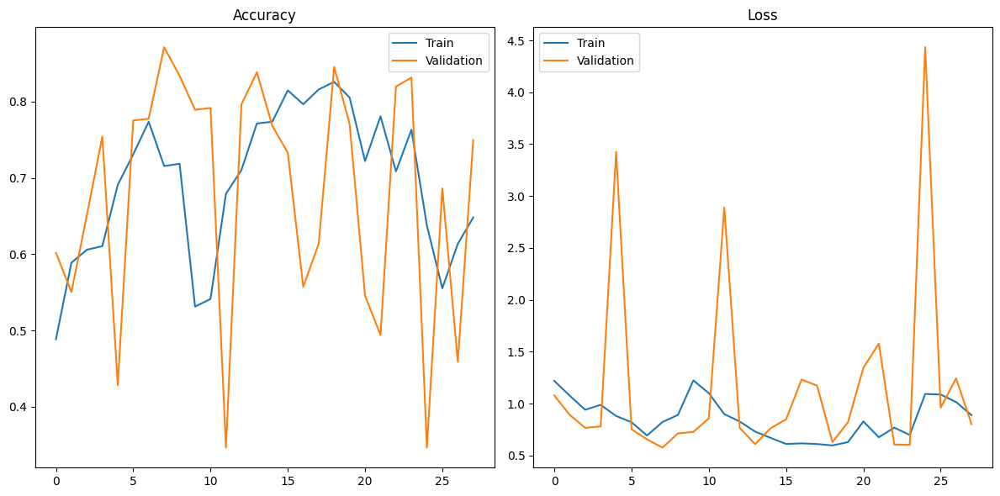

In [5]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import tensorflow as tf
import gc

# ============= AGGRESSIVE GPU MEMORY MANAGEMENT =============
# Clear any existing models from memory
tf.keras.backend.clear_session()
gc.collect()

# GPU Memory Configuration
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"✓ Enabled memory growth for {len(gpus)} GPU(s)")
    except RuntimeError as e:
        print(e)

# Disable XLA and reduce memory overhead
tf.config.optimizer.set_jit(False)
print("✓ Disabled XLA JIT")

# Load and preprocess data
data = pd.read_csv('emotions.csv')
labels = data['label']
features = data.drop('label', axis=1)

# Feature normalization
scaler = StandardScaler()
features_normalized = scaler.fit_transform(features)
print("✓ Features normalized")

# Reshape features for time series input
X = features_normalized.reshape((features_normalized.shape[0], features_normalized.shape[1], 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)
Y = to_categorical(y_encoded)

# Train-validation split
X_train, X_val, Y_train, Y_val = train_test_split(
    X, Y, test_size=0.2, random_state=42, stratify=y_encoded
)

print(f"Training samples: {X_train.shape[0]}")
print(f"Validation samples: {X_val.shape[0]}")


# Positional Encoding
def positional_encoding(seq_len, d_model):
    position = np.arange(seq_len)[:, np.newaxis]
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    
    pos_encoding = np.zeros((seq_len, d_model))
    pos_encoding[:, 0::2] = np.sin(position * div_term)
    pos_encoding[:, 1::2] = np.cos(position * div_term)
    
    return tf.constant(pos_encoding, dtype=tf.float32)


# Lightweight Transformer Encoder
def transformer_encoder(inputs, num_heads, d_model, ff_dim, dropout_rate=0.3):
    # Multi-head self-attention
    attn_output = MultiHeadAttention(
        num_heads=num_heads, 
        key_dim=d_model // num_heads,
        dropout=dropout_rate
    )(inputs, inputs)
    attn_output = Dropout(dropout_rate)(attn_output)
    out1 = LayerNormalization(epsilon=1e-6)(inputs + attn_output)
    
    # Feed-forward network
    ffn = Dense(ff_dim, activation='gelu', kernel_regularizer=l2(0.01))(out1)
    ffn = Dropout(dropout_rate)(ffn)
    ffn = Dense(d_model, kernel_regularizer=l2(0.01))(ffn)
    ffn = Dropout(dropout_rate)(ffn)
    out2 = LayerNormalization(epsilon=1e-6)(out1 + ffn)
    
    return out2


def create_minimal_transformer(input_shape, num_classes, d_model=16, num_heads=2, ff_dim=32):
    """Ultra-minimal transformer for memory-constrained environments"""
    inputs = Input(shape=input_shape)
    seq_len = input_shape[0]
    
    # Project input
    x = Dense(d_model, activation='linear', kernel_regularizer=l2(0.01))(inputs)
    x = Dropout(0.2)(x)
    
    # Add positional encoding
    pos_enc = positional_encoding(seq_len, d_model)
    x = x + pos_enc
    
    # Single transformer block
    x = transformer_encoder(
        x, 
        num_heads=num_heads, 
        d_model=d_model,
        ff_dim=ff_dim, 
        dropout_rate=0.4
    )
    
    # Global pooling
    x = GlobalAveragePooling1D()(x)
    
    # Minimal classification head
    x = Dense(16, activation='gelu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.4)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


# ============= MINIMAL AUGMENTATION (MEMORY SAVING) =============
# Only 1x augmentation to save memory
def minimal_augmentation(X, y, noise_factor=0.02):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])


X_train_aug, Y_train_aug = minimal_augmentation(X_train, Y_train)
print(f"✓ Training samples: {X_train_aug.shape[0]}")


# Callbacks
transformer_callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=15,
        restore_best_weights=True, 
        verbose=1,
        min_delta=0.001
    ),
    ModelCheckpoint(
        'transformer_model.keras', 
        monitor='val_loss',
        save_best_only=True, 
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.5,
        patience=5,
        min_lr=1e-7, 
        verbose=1
    )
]


# ============= ULTRA-MINIMAL MODEL =============
model = create_minimal_transformer(
    (X_train.shape[1], 1), 
    num_classes=3,
    d_model=16,      # MINIMAL SIZE
    num_heads=2,
    ff_dim=32        # 2x d_model
)

model.compile(
    optimizer=Adam(learning_rate=0.0001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("\n" + "="*70)
print("ULTRA-MINIMAL TRANSFORMER (MEMORY OPTIMIZED)")
print("="*70)
print(model.summary())
print("="*70)
print("Memory optimizations:")
print("  ✓ d_model=16 (minimal)")
print("  ✓ Single transformer layer")
print("  ✓ batch_size=4 (very small)")
print("  ✓ Minimal augmentation (2x data)")
print("  ✓ XLA disabled")
print("="*70 + "\n")

# Train with TINY batch size

history = model.fit(
    X_train_aug, Y_train_aug,
    batch_size=4,  # EXTREMELY SMALL - increase to 8 if this works
    epochs=100,
    validation_data=(X_val, Y_val),
    callbacks=transformer_callbacks,
    verbose=1
)

# Evaluate
val_loss, val_accuracy = model.evaluate(X_val, Y_val, verbose=0)
print(f'\n{"="*70}')
print(f'Final Validation Accuracy: {val_accuracy:.4f}')
print(f'Final Validation Loss: {val_loss:.4f}')
print("="*70)



2025-10-09 09:18:39.266118: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-09 09:18:39.635497: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760026719.812044     937 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760026719.863582     937 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760026720.183253     937 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

✓ Enabled memory growth for 1 GPU(s)
✓ Disabled XLA JIT
✓ Features normalized
Training samples: 1705
Validation samples: 427
✓ Training samples: 3410


I0000 00:00:1760026727.593383     937 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3539 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9



ULTRA-MINIMAL TRANSFORMER (MEMORY OPTIMIZED)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 2548, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 2548, 16)  │         32 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2548, 16)  │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 2548, 16)  │          0 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 2548, 16)  │      1,088 │ add[0][0],        │
│ (MultiHeadAttentio… │                   │            │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 2548, 16)  │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 2548, 16)  │          0 │ add[0][0],        │
│                     │                   │            │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 2548, 16)  │         32 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 2548, 32)  │        544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 2548, 32)  │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 2548, 16)  │        528 │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 2548, 16)  │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 2548, 16)  │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 16)  │         32 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 16)        │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 16)        │        272 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 16)        │          0 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 3)         │         51 │ dropout_5[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,579 (10.07 KB)

 Trainable params: 2,579 (10.07 KB)

 Non-trainable params: 0 (0.00 B)

None
Memory optimizations:
  ✓ d_model=16 (minimal)
  ✓ Single transformer layer
  ✓ batch_size=4 (very small)
  ✓ Minimal augmentation (2x data)
  ✓ XLA disabled

Epoch 1/100


I0000 00:00:1760026733.326681    7168 service.cc:152] XLA service 0x7e98fc015280 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1760026733.326729    7168 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2025-10-09 09:18:53.546553: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1760026734.852662    7168 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-10-09 09:18:58.775117: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 228 bytes spill stores, 228 bytes spill loads

2025-10-09 09:18:59.986797: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusio

851/853 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.3574 - loss: 1.6593

2025-10-09 09:19:50.575911: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 4516 bytes spill stores, 4456 bytes spill loads

2025-10-09 09:19:50.877056: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 20 bytes spill stores, 20 bytes spill loads

2025-10-09 09:19:50.934813: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 228 bytes spill stores, 228 bytes spill loads

2025-10-09 09:19:51.081437: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 196 bytes spill stores, 196 bytes spill loads

2025-10-09 09:19:51.935139: I external/l

853/853 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.3575 - loss: 1.6592

2025-10-09 09:20:08.662424: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 16 bytes spill stores, 16 bytes spill loads

2025-10-09 09:20:08.974714: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 504 bytes spill stores, 504 bytes spill loads

2025-10-09 09:20:09.463991: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 656 bytes spill stores, 656 bytes spill loads

2025-10-09 09:20:09.842054: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 1072 bytes spill stores, 1064 bytes spill loads

2025-10-09 09:20:15.902688: I external/l


Epoch 1: val_loss improved from inf to 1.50580, saving model to transformer_model.keras
853/853 ━━━━━━━━━━━━━━━━━━━━ 91s 71ms/step - accuracy: 0.3575 - loss: 1.6591 - val_accuracy: 0.7237 - val_loss: 1.5058 - learning_rate: 1.0000e-04
Epoch 2/100
852/853 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.4846 - loss: 1.4650
Epoch 2: val_loss improved from 1.50580 to 1.21498, saving model to transformer_model.keras
853/853 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - accuracy: 0.4848 - loss: 1.4648 - val_accuracy: 0.7916 - val_loss: 1.2150 - learning_rate: 1.0000e-04
Epoch 3/100
853/853 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6460 - loss: 1.1735
Epoch 3: val_loss improved from 1.21498 to 0.91422, saving model to transformer_model.keras
853/853 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - accuracy: 0.6460 - loss: 1.1734 - val_accuracy: 0.7963 - val_loss: 0.9142 - learning_rate: 1.0000e-04
Epoch 4/100
851/853 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6951 - loss: 0.9631
Epoch 4: val_loss impr

2025-10-09 09:46:38.770134: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 16 bytes spill stores, 16 bytes spill loads

2025-10-09 09:46:39.120542: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 504 bytes spill stores, 504 bytes spill loads

2025-10-09 09:46:39.259796: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 656 bytes spill stores, 656 bytes spill loads

2025-10-09 09:46:39.391013: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 1072 bytes spill stores, 1064 bytes spill loads

2025-10-09 09:46:39.559688: W external/l


Final Validation Accuracy: 0.8689
Final Validation Loss: 0.3260

✅ Training completed successfully!
   If this worked, try:
   - Increase batch_size to 8, then 16
   - Increase d_model to 24
   - Add more augmentation


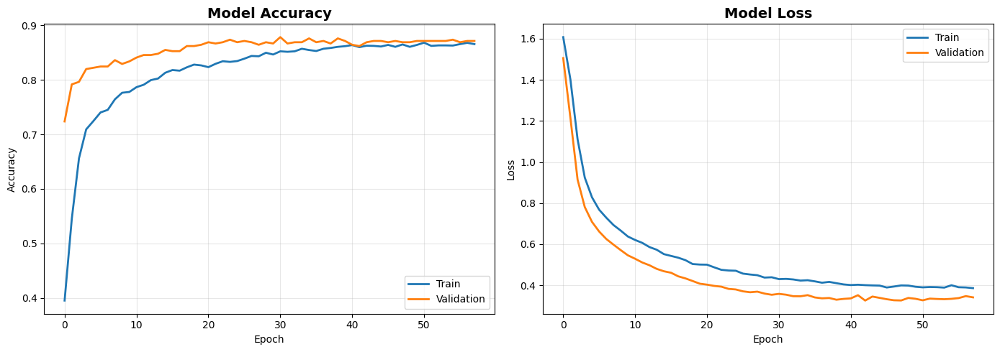

In [ ]:
    # Plot results
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(history.history['accuracy'], label='Train', linewidth=2)
ax1.plot(history.history['val_accuracy'], label='Validation', linewidth=2)
ax1.set_title('Model Accuracy', fontsize=14, fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(history.history['loss'], label='Train', linewidth=2)
ax2.plot(history.history['val_loss'], label='Validation', linewidth=2)
ax2.set_title('Model Loss', fontsize=14, fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_history.png', dpi=150)
plt.show()

In [4]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import tensorflow as tf
import gc

# ============= AGGRESSIVE GPU MEMORY MANAGEMENT =============
# Clear any existing models from memory
tf.keras.backend.clear_session()
gc.collect()

# GPU Memory Configuration
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"✓ Enabled memory growth for {len(gpus)} GPU(s)")
    except RuntimeError as e:
        print(e)

# Disable XLA and reduce memory overhead
tf.config.optimizer.set_jit(False)
print("✓ Disabled XLA JIT")

# Load and preprocess data
data = pd.read_csv('emotions.csv')
labels = data['label']
features = data.drop('label', axis=1)

# Feature normalization
scaler = StandardScaler()
features_normalized = scaler.fit_transform(features)
print("✓ Features normalized")

# Reshape features for time series input
X = features_normalized.reshape((features_normalized.shape[0], features_normalized.shape[1], 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)
Y = to_categorical(y_encoded)

# Train-validation split
X_train, X_val, Y_train, Y_val = train_test_split(
    X, Y, test_size=0.2, random_state=42, stratify=y_encoded
)

print(f"Training samples: {X_train.shape[0]}")
print(f"Validation samples: {X_val.shape[0]}")


# Positional Encoding
def positional_encoding(seq_len, d_model):
    position = np.arange(seq_len)[:, np.newaxis]
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    
    pos_encoding = np.zeros((seq_len, d_model))
    pos_encoding[:, 0::2] = np.sin(position * div_term)
    pos_encoding[:, 1::2] = np.cos(position * div_term)
    
    return tf.constant(pos_encoding, dtype=tf.float32)


# Lightweight Transformer Encoder
def transformer_encoder(inputs, num_heads, d_model, ff_dim, dropout_rate=0.3):
    # Multi-head self-attention
    attn_output = MultiHeadAttention(
        num_heads=num_heads, 
        key_dim=d_model // num_heads,
        dropout=dropout_rate
    )(inputs, inputs)
    attn_output = Dropout(dropout_rate)(attn_output)
    out1 = LayerNormalization(epsilon=1e-6)(inputs + attn_output)
    
    # Feed-forward network
    ffn = Dense(ff_dim, activation='gelu', kernel_regularizer=l2(0.01))(out1)
    ffn = Dropout(dropout_rate)(ffn)
    ffn = Dense(d_model, kernel_regularizer=l2(0.01))(ffn)
    ffn = Dropout(dropout_rate)(ffn)
    out2 = LayerNormalization(epsilon=1e-6)(out1 + ffn)
    
    return out2


def create_minimal_transformer(input_shape, num_classes, d_model=16, num_heads=2, ff_dim=32):
    """Ultra-minimal transformer for memory-constrained environments"""
    inputs = Input(shape=input_shape)
    seq_len = input_shape[0]
    
    # Project input
    x = Dense(d_model, activation='linear', kernel_regularizer=l2(0.01))(inputs)
    x = Dropout(0.2)(x)
    
    # Add positional encoding
    pos_enc = positional_encoding(seq_len, d_model)
    x = x + pos_enc
    
    # Single transformer block
    x = transformer_encoder(
        x, 
        num_heads=num_heads, 
        d_model=d_model,
        ff_dim=ff_dim, 
        dropout_rate=0.4
    )
    
    # Global pooling
    x = GlobalAveragePooling1D()(x)
    
    # Minimal classification head
    x = Dense(16, activation='gelu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.4)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


# ============= MINIMAL AUGMENTATION (MEMORY SAVING) =============
# Only 1x augmentation to save memory
def minimal_augmentation(X, y, noise_factor=0.02):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

# SKIP AUGMENTATION if still getting errors - uncomment this:
# X_train_aug, Y_train_aug = X_train, Y_train

X_train_aug, Y_train_aug = minimal_augmentation(X_train, Y_train)
print(f"✓ Training samples: {X_train_aug.shape[0]}")


# Callbacks
transformer_callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=15,
        restore_best_weights=True, 
        verbose=1,
        min_delta=0.001
    ),
    ModelCheckpoint(
        'transformer_model.keras', 
        monitor='val_loss',
        save_best_only=True, 
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.5,
        patience=5,
        min_lr=1e-7, 
        verbose=1
    )
]


# ============= ULTRA-MINIMAL MODEL =============
model = create_minimal_transformer(
    (X_train.shape[1], 1), 
    num_classes=3,
    d_model=16,      # MINIMAL SIZE
    num_heads=2,
    ff_dim=32        # 2x d_model
)

model.compile(
    optimizer=Adam(learning_rate=0.0001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("\n" + "="*70)
print("ULTRA-MINIMAL TRANSFORMER (MEMORY OPTIMIZED)")
print("="*70)
print(model.summary())
print("="*70)
print("Memory optimizations:")
print("  ✓ d_model=16 (minimal)")
print("  ✓ Single transformer layer")
print("  ✓ batch_size=4 (very small)")
print("  ✓ Minimal augmentation (2x data)")
print("  ✓ XLA disabled")
print("="*70 + "\n")

# Train with TINY batch size
try:
    history = model.fit(
        X_train_aug, Y_train_aug,
        batch_size=8,  
        epochs=100,
        validation_data=(X_val, Y_val),
        callbacks=transformer_callbacks,
        verbose=1
    )
    
    # Evaluate
    val_loss, val_accuracy = model.evaluate(X_val, Y_val, verbose=0)
    print(f'\n{"="*70}')
    print(f'Final Validation Accuracy: {val_accuracy:.4f}')
    print(f'Final Validation Loss: {val_loss:.4f}')
    print("="*70)

    
    print("\n✅ Training completed successfully!")
    print("   If this worked, try:")
    print("   - Increase batch_size to 8, then 16")
    print("   - Increase d_model to 24")
    print("   - Add more augmentation")
    
except tf.errors.ResourceExhaustedError:
    print("\n" + "!"*70)
    print("STILL OUT OF MEMORY - EMERGENCY FIXES:")
    print("!"*70)
    print("1. SKIP AUGMENTATION - Change line 120 to:")
    print("   X_train_aug, Y_train_aug = X_train, Y_train")
    print("")
    print("2. Check GPU memory:")
    print("   !nvidia-smi")
    print("")
    print("3. Reduce d_model to 8:")
    print("   d_model=8, ff_dim=16")
    print("")
    print("4. Force CPU mode (slow but works):")
    print("   import os")
    print("   os.environ['CUDA_VISIBLE_DEVICES'] = '-1'")
    print("!"*70)
    raise

✓ Enabled memory growth for 1 GPU(s)
✓ Disabled XLA JIT
✓ Features normalized
Training samples: 1705
Validation samples: 427
✓ Training samples: 3410

ULTRA-MINIMAL TRANSFORMER (MEMORY OPTIMIZED)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 2548, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 2548, 16)  │         32 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2548, 16)  │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 2548, 16)  │          0 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 2548, 16)  │      1,088 │ add[0][0],        │
│ (MultiHeadAttentio… │                   │            │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 2548, 16)  │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 2548, 16)  │          0 │ add[0][0],        │
│                     │                   │            │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 2548, 16)  │         32 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 2548, 32)  │        544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 2548, 32)  │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 2548, 16)  │        528 │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 2548, 16)  │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 2548, 16)  │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 16)  │         32 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 16)        │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 16)        │        272 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 16)        │          0 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 3)         │         51 │ dropout_5[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,579 (10.07 KB)

 Trainable params: 2,579 (10.07 KB)

 Non-trainable params: 0 (0.00 B)

None
Memory optimizations:
  ✓ d_model=16 (minimal)
  ✓ Single transformer layer
  ✓ batch_size=4 (very small)
  ✓ Minimal augmentation (2x data)
  ✓ XLA disabled

Epoch 1/100


2025-10-09 09:48:04.632620: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 228 bytes spill stores, 228 bytes spill loads

2025-10-09 09:48:05.710692: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 632 bytes spill stores, 632 bytes spill loads

2025-10-09 09:48:05.984153: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 20 bytes spill stores, 20 bytes spill loads

2025-10-09 09:48:06.129500: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 20 bytes spill stores, 20 bytes spill loads

2025-10-09 09:48:06.162376: I external/local

427/427 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.3278 - loss: 1.7376

2025-10-09 09:49:00.634773: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 16 bytes spill stores, 16 bytes spill loads

2025-10-09 09:49:03.059355: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 1072 bytes spill stores, 1064 bytes spill loads

2025-10-09 09:49:03.114515: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 504 bytes spill stores, 504 bytes spill loads

2025-10-09 09:49:03.342233: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 656 bytes spill stores, 656 bytes spill loads




Epoch 1: val_loss improved from inf to 1.60501, saving model to transformer_model.keras
427/427 ━━━━━━━━━━━━━━━━━━━━ 72s 98ms/step - accuracy: 0.3279 - loss: 1.7375 - val_accuracy: 0.4731 - val_loss: 1.6050 - learning_rate: 1.0000e-04
Epoch 2/100
426/427 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.4117 - loss: 1.5924
Epoch 2: val_loss improved from 1.60501 to 1.49584, saving model to transformer_model.keras
427/427 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.4118 - loss: 1.5923 - val_accuracy: 0.6511 - val_loss: 1.4958 - learning_rate: 1.0000e-04
Epoch 3/100
426/427 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.4749 - loss: 1.4822
Epoch 3: val_loss improved from 1.49584 to 1.37344, saving model to transformer_model.keras
427/427 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step - accuracy: 0.4750 - loss: 1.4821 - val_accuracy: 0.6230 - val_loss: 1.3734 - learning_rate: 1.0000e-04
Epoch 4/100
426/427 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.5616 - loss: 1.3536
Epoch 4: val_loss impr

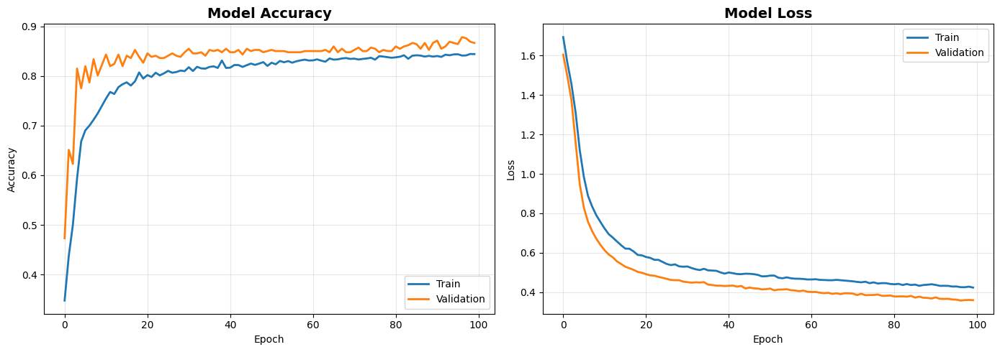

In [5]:
# Plot results
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(history.history['accuracy'], label='Train', linewidth=2)
ax1.plot(history.history['val_accuracy'], label='Validation', linewidth=2)
ax1.set_title('Model Accuracy', fontsize=14, fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(history.history['loss'], label='Train', linewidth=2)
ax2.plot(history.history['val_loss'], label='Validation', linewidth=2)
ax2.set_title('Model Loss', fontsize=14, fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_history.png', dpi=150)
plt.show()

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import tensorflow as tf
import gc

# ============= AGGRESSIVE GPU MEMORY MANAGEMENT =============
# Clear any existing models from memory
tf.keras.backend.clear_session()
gc.collect()

# GPU Memory Configuration
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"✓ Enabled memory growth for {len(gpus)} GPU(s)")
    except RuntimeError as e:
        print(e)

# Disable XLA and reduce memory overhead
tf.config.optimizer.set_jit(False)
print("✓ Disabled XLA JIT")

# Load and preprocess data
data = pd.read_csv('emotions.csv')
labels = data['label']
features = data.drop('label', axis=1)

# Feature normalization
scaler = StandardScaler()
features_normalized = scaler.fit_transform(features)
print("✓ Features normalized")

# Reshape features for time series input
X = features_normalized.reshape((features_normalized.shape[0], features_normalized.shape[1], 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)
Y = to_categorical(y_encoded)

# Train-validation split
X_train, X_val, Y_train, Y_val = train_test_split(
    X, Y, test_size=0.2, random_state=42, stratify=y_encoded
)

print(f"Training samples: {X_train.shape[0]}")
print(f"Validation samples: {X_val.shape[0]}")


# Positional Encoding
def positional_encoding(seq_len, d_model):
    position = np.arange(seq_len)[:, np.newaxis]
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    
    pos_encoding = np.zeros((seq_len, d_model))
    pos_encoding[:, 0::2] = np.sin(position * div_term)
    pos_encoding[:, 1::2] = np.cos(position * div_term)
    
    return tf.constant(pos_encoding, dtype=tf.float32)


# Lightweight Transformer Encoder
def transformer_encoder(inputs, num_heads, d_model, ff_dim, dropout_rate=0.3):
    # Multi-head self-attention
    attn_output = MultiHeadAttention(
        num_heads=num_heads, 
        key_dim=d_model // num_heads,
        dropout=dropout_rate
    )(inputs, inputs)
    attn_output = Dropout(dropout_rate)(attn_output)
    out1 = LayerNormalization(epsilon=1e-6)(inputs + attn_output)
    
    # Feed-forward network
    ffn = Dense(ff_dim, activation='gelu', kernel_regularizer=l2(0.01))(out1)
    ffn = Dropout(dropout_rate)(ffn)
    ffn = Dense(d_model, kernel_regularizer=l2(0.01))(ffn)
    ffn = Dropout(dropout_rate)(ffn)
    out2 = LayerNormalization(epsilon=1e-6)(out1 + ffn)
    
    return out2


def create_minimal_transformer(input_shape, num_classes, d_model=16, num_heads=2, ff_dim=32):
    """Ultra-minimal transformer for memory-constrained environments"""
    inputs = Input(shape=input_shape)
    seq_len = input_shape[0]
    
    # Project input
    x = Dense(d_model, activation='linear', kernel_regularizer=l2(0.01))(inputs)
    x = Dropout(0.2)(x)
    
    # Add positional encoding
    pos_enc = positional_encoding(seq_len, d_model)
    x = x + pos_enc
    
    # Single transformer block
    x = transformer_encoder(
        x, 
        num_heads=num_heads, 
        d_model=d_model,
        ff_dim=ff_dim, 
        dropout_rate=0.4
    )
    
    # Global pooling
    x = GlobalAveragePooling1D()(x)
    
    # Minimal classification head
    x = Dense(16, activation='gelu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.4)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


# ============= MINIMAL AUGMENTATION (MEMORY SAVING) =============
# Only 1x augmentation to save memory
def minimal_augmentation(X, y, noise_factor=0.02):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

# SKIP AUGMENTATION if still getting errors - uncomment this:
# X_train_aug, Y_train_aug = X_train, Y_train

X_train_aug, Y_train_aug = minimal_augmentation(X_train, Y_train)
print(f"✓ Training samples: {X_train_aug.shape[0]}")


# Callbacks
transformer_callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=15,
        restore_best_weights=True, 
        verbose=1,
        min_delta=0.001
    ),
    ModelCheckpoint(
        'transformer_model.keras', 
        monitor='val_loss',
        save_best_only=True, 
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.5,
        patience=5,
        min_lr=1e-7, 
        verbose=1
    )
]


# ============= ULTRA-MINIMAL MODEL =============
model = create_minimal_transformer(
    (X_train.shape[1], 1), 
    num_classes=3,
    d_model=16,      # MINIMAL SIZE
    num_heads=2,
    ff_dim=32        # 2x d_model
)

model.compile(
    optimizer=Adam(learning_rate=0.0001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("\n" + "="*70)
print("="*70)
print(model.summary())

# Train with TINY batch size
try:
    history = model.fit(
        X_train_aug, Y_train_aug,
        batch_size=16,  
        epochs=100,
        validation_data=(X_val, Y_val),
        callbacks=transformer_callbacks,
        verbose=1
    )
    
    # Evaluate
    val_loss, val_accuracy = model.evaluate(X_val, Y_val, verbose=0)
    print(f'\n{"="*70}')
    print(f'Final Validation Accuracy: {val_accuracy:.4f}')
    print(f'Final Validation Loss: {val_loss:.4f}')
    print("="*70)

    
    print("\n✅ Training completed successfully!")
    
except tf.errors.ResourceExhaustedError:
    print("\n" + "!"*70)
    print("STILL OUT OF MEMORY - EMERGENCY FIXES:")
    print("!"*70)
    print("1. SKIP AUGMENTATION - Change line 120 to:")
    print("   X_train_aug, Y_train_aug = X_train, Y_train")
    print("")
    print("2. Check GPU memory:")
    print("   !nvidia-smi")
    print("")
    print("3. Reduce d_model to 8:")
    print("   d_model=8, ff_dim=16")
    print("")
    print("4. Force CPU mode (slow but works):")
    print("   import os")
    print("   os.environ['CUDA_VISIBLE_DEVICES'] = '-1'")
    print("!"*70)
    raise

2025-10-09 14:40:31.731018: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-09 14:40:32.071504: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1760046032.209367     830 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1760046032.246138     830 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1760046032.537730     830 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

✓ Enabled memory growth for 1 GPU(s)
✓ Disabled XLA JIT
✓ Features normalized
Training samples: 1705
Validation samples: 427
✓ Training samples: 3410


I0000 00:00:1760046039.844620     830 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3539 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9



ULTRA-MINIMAL TRANSFORMER (MEMORY OPTIMIZED)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 2548, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 2548, 16)  │         32 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2548, 16)  │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 2548, 16)  │          0 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 2548, 16)  │      1,088 │ add[0][0],        │
│ (MultiHeadAttentio… │                   │            │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 2548, 16)  │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 2548, 16)  │          0 │ add[0][0],        │
│                     │                   │            │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 2548, 16)  │         32 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 2548, 32)  │        544 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 2548, 32)  │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 2548, 16)  │        528 │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 2548, 16)  │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 2548, 16)  │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 16)  │         32 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 16)        │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 16)        │        272 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 16)        │          0 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 3)         │         51 │ dropout_5[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,579 (10.07 KB)

 Trainable params: 2,579 (10.07 KB)

 Non-trainable params: 0 (0.00 B)

None
Memory optimizations:
  ✓ d_model=16 (minimal)
  ✓ Single transformer layer
  ✓ batch_size=4 (very small)
  ✓ Minimal augmentation (2x data)
  ✓ XLA disabled

Epoch 1/100


I0000 00:00:1760046045.764606    1077 service.cc:152] XLA service 0x7e8168017380 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1760046045.764677    1077 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2025-10-09 14:40:45.997537: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1760046047.444353    1077 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-10-09 14:40:53.447008: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 228 bytes spill stores, 228 bytes spill loads

2025-10-09 14:40:53.626913: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusio

213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.3296 - loss: 1.7152

2025-10-09 14:41:44.372164: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 20 bytes spill stores, 20 bytes spill loads

2025-10-09 14:41:45.270907: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 4516 bytes spill stores, 4456 bytes spill loads

2025-10-09 14:41:45.292596: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 20 bytes spill stores, 20 bytes spill loads

2025-10-09 14:41:45.815945: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 632 bytes spill stores, 632 bytes spill loads

2025-10-09 14:41:46.191534: I external/loc

214/214 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.3297 - loss: 1.7151

2025-10-09 14:42:03.575595: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 16 bytes spill stores, 16 bytes spill loads

2025-10-09 14:42:03.799675: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 504 bytes spill stores, 504 bytes spill loads

2025-10-09 14:42:04.053991: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 656 bytes spill stores, 656 bytes spill loads

2025-10-09 14:42:04.287407: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 1072 bytes spill stores, 1064 bytes spill loads

2025-10-09 14:42:09.455708: I external/l


Epoch 1: val_loss improved from inf to 1.63837, saving model to transformer_model.keras
214/214 ━━━━━━━━━━━━━━━━━━━━ 92s 263ms/step - accuracy: 0.3297 - loss: 1.7150 - val_accuracy: 0.3349 - val_loss: 1.6384 - learning_rate: 1.0000e-04
Epoch 2/100
213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - accuracy: 0.3666 - loss: 1.6292
Epoch 2: val_loss improved from 1.63837 to 1.54661, saving model to transformer_model.keras
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - accuracy: 0.3669 - loss: 1.6290 - val_accuracy: 0.4356 - val_loss: 1.5466 - learning_rate: 1.0000e-04
Epoch 3/100
213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.4944 - loss: 1.5357
Epoch 3: val_loss improved from 1.54661 to 1.42388, saving model to transformer_model.keras
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - accuracy: 0.4945 - loss: 1.5355 - val_accuracy: 0.6136 - val_loss: 1.4239 - learning_rate: 1.0000e-04
Epoch 4/100
213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.5572 - loss: 1.4228
Epoch 4: val_loss

2025-10-09 15:40:34.877454: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 16 bytes spill stores, 16 bytes spill loads

2025-10-09 15:40:35.168616: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 504 bytes spill stores, 504 bytes spill loads

2025-10-09 15:40:35.903279: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 656 bytes spill stores, 656 bytes spill loads

2025-10-09 15:40:36.035538: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 1072 bytes spill stores, 1064 bytes spill loads




Final Validation Accuracy: 0.8735
Final Validation Loss: 0.3385

✅ Training completed successfully!
   If this worked, try:
   - Increase batch_size to 8, then 16
   - Increase d_model to 24
   - Add more augmentation


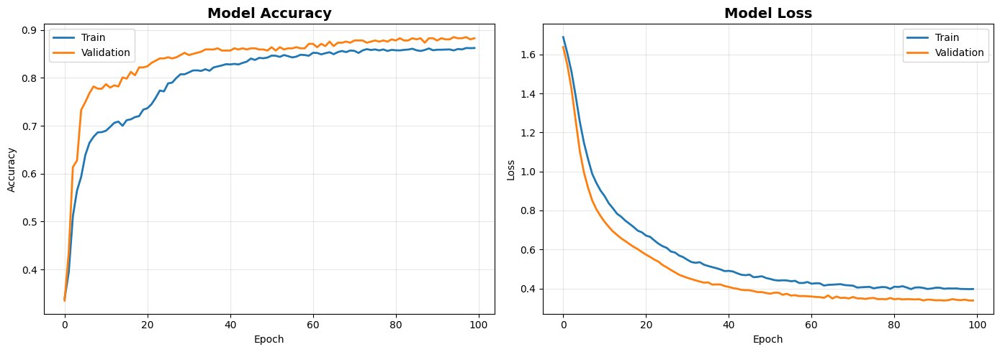

In [2]:
# Plot results
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(history.history['accuracy'], label='Train', linewidth=2)
ax1.plot(history.history['val_accuracy'], label='Validation', linewidth=2)
ax1.set_title('Model Accuracy', fontsize=14, fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(history.history['loss'], label='Train', linewidth=2)
ax2.plot(history.history['val_loss'], label='Validation', linewidth=2)
ax2.set_title('Model Loss', fontsize=14, fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_history.png', dpi=150)
plt.show()

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import tensorflow as tf
import gc

# ============= AGGRESSIVE GPU MEMORY MANAGEMENT =============
# Clear any existing models from memory
tf.keras.backend.clear_session()
gc.collect()

# GPU Memory Configuration
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"✓ Enabled memory growth for {len(gpus)} GPU(s)")
    except RuntimeError as e:
        print(e)

# Disable XLA and reduce memory overhead
tf.config.optimizer.set_jit(False)
print("✓ Disabled XLA JIT")

# Load and preprocess data
data = pd.read_csv('emotions.csv')
labels = data['label']
features = data.drop('label', axis=1)

# Feature normalization
scaler = StandardScaler()
features_normalized = scaler.fit_transform(features)
print("✓ Features normalized")

# Reshape features for time series input
X = features_normalized.reshape((features_normalized.shape[0], features_normalized.shape[1], 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)
Y = to_categorical(y_encoded)

# Train-validation split
X_train, X_val, Y_train, Y_val = train_test_split(
    X, Y, test_size=0.2, random_state=42, stratify=y_encoded
)

print(f"Training samples: {X_train.shape[0]}")
print(f"Validation samples: {X_val.shape[0]}")


# Positional Encoding
def positional_encoding(seq_len, d_model):
    position = np.arange(seq_len)[:, np.newaxis]
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    
    pos_encoding = np.zeros((seq_len, d_model))
    pos_encoding[:, 0::2] = np.sin(position * div_term)
    pos_encoding[:, 1::2] = np.cos(position * div_term)
    
    return tf.constant(pos_encoding, dtype=tf.float32)


# Lightweight Transformer Encoder
def transformer_encoder(inputs, num_heads, d_model, ff_dim, dropout_rate=0.3):
    # Multi-head self-attention
    attn_output = MultiHeadAttention(
        num_heads=num_heads, 
        key_dim=d_model // num_heads,
        dropout=dropout_rate
    )(inputs, inputs)
    attn_output = Dropout(dropout_rate)(attn_output)
    out1 = LayerNormalization(epsilon=1e-6)(inputs + attn_output)
    
    # Feed-forward network
    ffn = Dense(ff_dim, activation='gelu', kernel_regularizer=l2(0.01))(out1)
    ffn = Dropout(dropout_rate)(ffn)
    ffn = Dense(d_model, kernel_regularizer=l2(0.01))(ffn)
    ffn = Dropout(dropout_rate)(ffn)
    out2 = LayerNormalization(epsilon=1e-6)(out1 + ffn)
    
    return out2


def create_minimal_transformer(input_shape, num_classes, d_model=16, num_heads=2, ff_dim=32):
    """Ultra-minimal transformer for memory-constrained environments"""
    inputs = Input(shape=input_shape)
    seq_len = input_shape[0]
    
    # Project input
    x = Dense(d_model, activation='linear', kernel_regularizer=l2(0.01))(inputs)
    x = Dropout(0.2)(x)
    
    # Add positional encoding
    pos_enc = positional_encoding(seq_len, d_model)
    x = x + pos_enc
    
    # Single transformer block
    x = transformer_encoder(
        x, 
        num_heads=num_heads, 
        d_model=d_model,
        ff_dim=ff_dim, 
        dropout_rate=0.4
    )
    
    # Global pooling
    x = GlobalAveragePooling1D()(x)
    
    # Minimal classification head
    x = Dense(16, activation='gelu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.4)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    return Model(inputs, outputs)


# ============= MINIMAL AUGMENTATION (MEMORY SAVING) =============
# Only 1x augmentation to save memory
def minimal_augmentation(X, y, noise_factor=0.02):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

# SKIP AUGMENTATION if still getting errors - uncomment this:
# X_train_aug, Y_train_aug = X_train, Y_train

X_train_aug, Y_train_aug = minimal_augmentation(X_train, Y_train)
print(f"✓ Training samples: {X_train_aug.shape[0]}")


# Callbacks
transformer_callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=15,
        restore_best_weights=True, 
        verbose=1,
        min_delta=0.001
    ),
    ModelCheckpoint(
        'transformer_model.keras', 
        monitor='val_loss',
        save_best_only=True, 
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.5,
        patience=5,
        min_lr=1e-7, 
        verbose=1
    )
]


# ============= ULTRA-MINIMAL MODEL =============
model = create_minimal_transformer(
    (X_train.shape[1], 1), 
    num_classes=3,
    d_model=24,      
    num_heads=2,
    ff_dim=48       
)

model.compile(
    optimizer=Adam(learning_rate=0.0001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("\n" + "="*70)
print("="*70)
print(model.summary())

# Train with TINY batch size
try:
    history = model.fit(
        X_train_aug, Y_train_aug,
        batch_size=16,  
        epochs=100,
        validation_data=(X_val, Y_val),
        callbacks=transformer_callbacks,
        verbose=1
    )
    
    # Evaluate
    val_loss, val_accuracy = model.evaluate(X_val, Y_val, verbose=0)
    print(f'\n{"="*70}')
    print(f'Final Validation Accuracy: {val_accuracy:.4f}')
    print(f'Final Validation Loss: {val_loss:.4f}')
    print("="*70)

    
    print("\n✅ Training completed successfully!")
    
except tf.errors.ResourceExhaustedError:
    print("\n" + "!"*70)
    print("STILL OUT OF MEMORY - EMERGENCY FIXES:")
    print("!"*70)
    print("1. SKIP AUGMENTATION - Change line 120 to:")
    print("   X_train_aug, Y_train_aug = X_train, Y_train")
    print("")
    print("2. Check GPU memory:")
    print("   !nvidia-smi")
    print("")
    print("3. Reduce d_model to 8:")
    print("   d_model=8, ff_dim=16")
    print("")
    print("4. Force CPU mode (slow but works):")
    print("   import os")
    print("   os.environ['CUDA_VISIBLE_DEVICES'] = '-1'")
    print("!"*70)
    raise

2025-10-28 18:37:23.826013: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-28 18:37:24.233140: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1761701844.376982     938 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1761701844.426610     938 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1761701844.759085     938 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

✓ Enabled memory growth for 1 GPU(s)
✓ Disabled XLA JIT
✓ Features normalized
Training samples: 1705
Validation samples: 427
✓ Training samples: 3410


I0000 00:00:1761701853.274150     938 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3539 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 2548, 1)   │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 2548, 24)  │         48 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2548, 24)  │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 2548, 24)  │          0 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 2548, 24)  │      2,400 │ add[0][0],        │
│ (MultiHeadAttentio… │                   │            │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 2548, 24)  │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 2548, 24)  │          0 │ add[0][0],        │
│                     │                   │            │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 2548, 24)  │         48 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 2548, 48)  │      1,200 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 2548, 48)  │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 2548, 24)  │      1,176 │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 2548, 24)  │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 2548, 24)  │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 2548, 24)  │         48 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 24)        │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 16)        │        400 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 16)        │          0 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 3)         │         51 │ dropout_5[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,371 (20.98 KB)

 Trainable params: 5,371 (20.98 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/100


I0000 00:00:1761701858.681927    1490 service.cc:152] XLA service 0x7e2980017660 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1761701858.681995    1490 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2025-10-28 18:37:38.871747: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1761701860.088563    1490 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-10-28 18:37:43.369453: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 96 bytes spill stores, 96 bytes spill loads

2025-10-28 18:37:44.559003: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_

213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.3106 - loss: 1.9732

2025-10-28 18:38:30.307407: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 20 bytes spill stores, 20 bytes spill loads

2025-10-28 18:38:31.196373: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_32', 632 bytes spill stores, 632 bytes spill loads

2025-10-28 18:38:31.197146: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_33', 480 bytes spill stores, 480 bytes spill loads

2025-10-28 18:38:31.514375: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_33', 8 bytes spill stores, 8 bytes spill loads

2025-10-28 18:38:31.607752: I external/local_x

214/214 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.3107 - loss: 1.9730

2025-10-28 18:38:52.545565: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 16 bytes spill stores, 16 bytes spill loads

2025-10-28 18:38:52.768490: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 656 bytes spill stores, 656 bytes spill loads

2025-10-28 18:38:53.139717: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 504 bytes spill stores, 504 bytes spill loads

2025-10-28 18:38:53.330094: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 1072 bytes spill stores, 1064 bytes spill loads

2025-10-28 18:38:59.001758: I external/l


Epoch 1: val_loss improved from inf to 1.85841, saving model to transformer_model.keras
214/214 ━━━━━━━━━━━━━━━━━━━━ 88s 263ms/step - accuracy: 0.3108 - loss: 1.9728 - val_accuracy: 0.3419 - val_loss: 1.8584 - learning_rate: 1.0000e-04
Epoch 2/100
213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - accuracy: 0.3711 - loss: 1.8370
Epoch 2: val_loss improved from 1.85841 to 1.74079, saving model to transformer_model.keras
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.3713 - loss: 1.8368 - val_accuracy: 0.5972 - val_loss: 1.7408 - learning_rate: 1.0000e-04
Epoch 3/100
213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.4161 - loss: 1.7268
Epoch 3: val_loss improved from 1.74079 to 1.59922, saving model to transformer_model.keras
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.4165 - loss: 1.7265 - val_accuracy: 0.5948 - val_loss: 1.5992 - learning_rate: 1.0000e-04
Epoch 4/100
213/214 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.5192 - loss: 1.5653
Epoch 4: val_loss i

2025-10-28 19:07:49.478846: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 16 bytes spill stores, 16 bytes spill loads

2025-10-28 19:07:50.631138: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 1072 bytes spill stores, 1064 bytes spill loads

2025-10-28 19:07:50.724574: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 504 bytes spill stores, 504 bytes spill loads

2025-10-28 19:07:50.798970: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_12', 656 bytes spill stores, 656 bytes spill loads




Final Validation Accuracy: 0.8735
Final Validation Loss: 0.3380

✅ Training completed successfully!


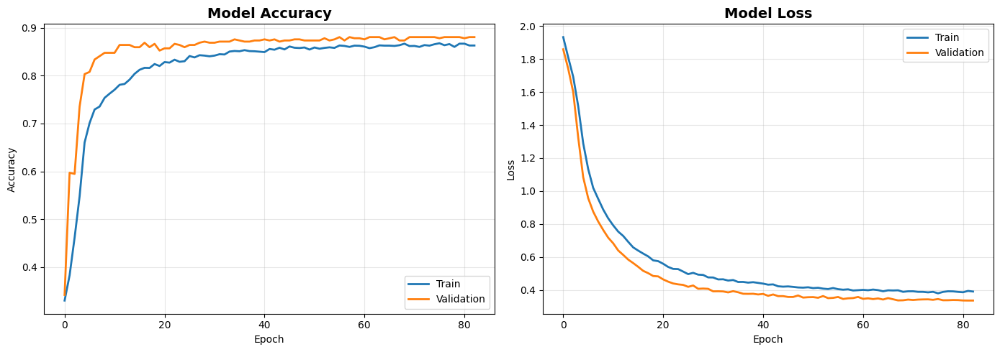

In [2]:
# Plot results
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(history.history['accuracy'], label='Train', linewidth=2)
ax1.plot(history.history['val_accuracy'], label='Validation', linewidth=2)
ax1.set_title('Model Accuracy', fontsize=14, fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(history.history['loss'], label='Train', linewidth=2)
ax2.plot(history.history['val_loss'], label='Validation', linewidth=2)
ax2.set_title('Model Loss', fontsize=14, fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_history.png', dpi=150)
plt.show()

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D, Layer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import tensorflow as tf
import gc
import matplotlib.pyplot as plt
import seaborn as sns

# =================== GPU & Memory Setup ===================
tf.keras.backend.clear_session()
gc.collect()

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"✓ Enabled memory growth for {len(gpus)} GPU(s)")
    except RuntimeError as e:
        print(e)
tf.config.optimizer.set_jit(False)
print("✓ Disabled XLA JIT")

# =================== Load & Preprocess Data ===================
print("Loading dataset...")
data = pd.read_csv('emotions.csv')
print(f"Dataset shape: {data.shape}")
print(f"Columns: {data.columns[:10].tolist()}...")  # Show first 10 columns
print(f"Label distribution:\n{data['label'].value_counts()}")

# Separate labels and features
labels = data['label']
features = data.drop('label', axis=1)

# Normalize features
scaler = StandardScaler()
features_normalized = scaler.fit_transform(features)

# Reshape for sequence model: (samples, timesteps, features)
# Each feature becomes a timestep with 1 channel
X = features_normalized.reshape((features_normalized.shape[0], features_normalized.shape[1], 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)
num_classes = len(np.unique(y_encoded))
Y = to_categorical(y_encoded, num_classes=num_classes)

print(f"\nClasses detected: {label_encoder.classes_}")
print(f"Number of classes: {num_classes}")

# Split data
X_train, X_val, Y_train, Y_val = train_test_split(
    X, Y, test_size=0.2, random_state=42, stratify=y_encoded
)

print(f"\nTraining samples: {X_train.shape[0]}, Validation samples: {X_val.shape[0]}")
print(f"Input shape: {X_train.shape[1:]}")

# =================== Positional Encoding ===================
def positional_encoding(seq_len, d_model):
    position = np.arange(seq_len)[:, np.newaxis]
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    
    pos_encoding = np.zeros((seq_len, d_model))
    pos_encoding[:, 0::2] = np.sin(position * div_term)
    pos_encoding[:, 1::2] = np.cos(position * div_term)
    
    return tf.constant(pos_encoding, dtype=tf.float32)

# =================== Custom Multi-Head Attention Layer ===================
class MultiHeadAttentionWithWeights(Layer):
    def __init__(self, num_heads, key_dim, dropout=0.0, **kwargs):
        super().__init__(**kwargs)
        self.mha = MultiHeadAttention(
            num_heads=num_heads,
            key_dim=key_dim,
            dropout=dropout
        )
        self.num_heads = num_heads
        self.key_dim = key_dim
        
    def call(self, inputs, training=None, return_attention=False):
        # Get attention output
        attn_output = self.mha(inputs, inputs, training=training)
        
        if return_attention:
            # Extract attention scores
            query = self.mha._query_dense(inputs)
            key = self.mha._key_dense(inputs)
            
            # Reshape for multi-head attention
            batch_size = tf.shape(query)[0]
            query = tf.reshape(query, [batch_size, -1, self.num_heads, self.key_dim])
            key = tf.reshape(key, [batch_size, -1, self.num_heads, self.key_dim])
            
            query = tf.transpose(query, [0, 2, 1, 3])
            key = tf.transpose(key, [0, 2, 1, 3])
            
            # Compute attention scores
            scores = tf.matmul(query, key, transpose_b=True)
            scores = scores / tf.math.sqrt(tf.cast(self.key_dim, tf.float32))
            attn_weights = tf.nn.softmax(scores, axis=-1)
            
            return attn_output, attn_weights
        
        return attn_output
    
    def get_config(self):
        config = super().get_config()
        config.update({
            'num_heads': self.num_heads,
            'key_dim': self.key_dim,
        })
        return config

# =================== Transformer Encoder ===================
def transformer_encoder(inputs, num_heads, d_model, ff_dim, dropout_rate=0.3, name='transformer'):
    # Multi-head attention
    attn_layer = MultiHeadAttentionWithWeights(
        num_heads=num_heads, 
        key_dim=d_model // num_heads, 
        dropout=dropout_rate,
        name=f'{name}_mha'
    )
    attn_output = attn_layer(inputs, return_attention=False)
    attn_output = Dropout(dropout_rate, name=f'{name}_dropout1')(attn_output)
    out1 = LayerNormalization(epsilon=1e-6, name=f'{name}_norm1')(inputs + attn_output)
    
    # Feed-forward network
    ffn = Dense(ff_dim, activation='gelu', kernel_regularizer=l2(0.01), name=f'{name}_ffn1')(out1)
    ffn = Dropout(dropout_rate, name=f'{name}_dropout2')(ffn)
    ffn = Dense(d_model, kernel_regularizer=l2(0.01), name=f'{name}_ffn2')(ffn)
    ffn = Dropout(dropout_rate, name=f'{name}_dropout3')(ffn)
    out2 = LayerNormalization(epsilon=1e-6, name=f'{name}_norm2')(out1 + ffn)
    
    return out2, attn_layer

# =================== Transformer Model for Training ===================
def create_transformer_model(input_shape, num_classes, d_model=16, num_heads=2, ff_dim=32):
    inputs = Input(shape=input_shape, name='input')
    seq_len = input_shape[0]
    
    # Project input
    x = Dense(d_model, activation='linear', kernel_regularizer=l2(0.01), name='input_projection')(inputs)
    x = Dropout(0.2, name='input_dropout')(x)
    
    # Add positional encoding
    pos_enc = positional_encoding(seq_len, d_model)
    x = x + pos_enc
    
    # Transformer block
    x, attn_layer = transformer_encoder(
        x,
        num_heads=num_heads,
        d_model=d_model,
        ff_dim=ff_dim,
        dropout_rate=0.4,
        name='transformer_block'
    )
    
    # Global pooling
    x = GlobalAveragePooling1D(name='global_pool')(x)
    
    # Classification head
    x = Dense(16, activation='gelu', kernel_regularizer=l2(0.01), name='dense_hidden')(x)
    x = Dropout(0.4, name='final_dropout')(x)
    outputs = Dense(num_classes, activation='softmax', name='output')(x)
    
    # Model outputs only predictions for training
    model = Model(inputs=inputs, outputs=outputs, name='EEG_Emotion_Classifier')
    
    # Store attention layer for later extraction
    model.attention_layer = attn_layer
    
    return model

# =================== Minimal Data Augmentation ===================
def minimal_augmentation(X, y, noise_factor=0.02):
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

print("\nApplying data augmentation...")
X_train_aug, Y_train_aug = minimal_augmentation(X_train, Y_train)
print(f"Augmented training samples: {X_train_aug.shape[0]}")

# =================== Callbacks ===================
transformer_callbacks = [
    EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True, verbose=1, min_delta=0.001),
    ModelCheckpoint('transformer_model_eeg.keras', monitor='val_loss', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7, verbose=1)
]

# =================== Create & Compile Model ===================
print("\nBuilding model...")
model = create_transformer_model(
    (X_train.shape[1], 1),
    num_classes=num_classes,
    d_model=24,
    num_heads=2,
    ff_dim=48
)

model.compile(
    optimizer=Adam(learning_rate=0.0001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())

# =================== Train ===================
print("\nTraining model...")
history = model.fit(
    X_train_aug, Y_train_aug,
    batch_size=32,
    epochs=50,
    validation_data=(X_val, Y_val),
    callbacks=transformer_callbacks,
    verbose=1
)

# =================== Plot Training History ===================
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history.history['loss'], label='Train Loss')
axes[0].plot(history.history['val_loss'], label='Val Loss')
axes[0].set_title('Model Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True)

axes[1].plot(history.history['accuracy'], label='Train Accuracy')
axes[1].plot(history.history['val_accuracy'], label='Val Accuracy')
axes[1].set_title('Model Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()

# =================== Evaluate Model ===================
print("\nEvaluating on validation set...")
val_loss, val_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# =================== Inference with Attention Visualization ===================
print("\n" + "="*60)
print("ATTENTION VISUALIZATION FOR SAMPLE PREDICTIONS")
print("="*60)

# Select a sample from validation set
sample_idx = 0
X_sample = X_val[sample_idx:sample_idx+1]
Y_sample = Y_val[sample_idx:sample_idx+1]

# Get prediction
prediction = model.predict(X_sample, verbose=0)
pred_label = np.argmax(prediction, axis=1)[0]
pred_confidence = np.max(prediction, axis=1)[0]
true_label = np.argmax(Y_sample, axis=1)[0]

print(f"\nSample {sample_idx}:")
print(f"  True emotion: {label_encoder.inverse_transform([true_label])[0]}")
print(f"  Predicted emotion: {label_encoder.inverse_transform([pred_label])[0]}")
print(f"  Confidence: {pred_confidence:.2%}")
print(f"  Probabilities: {dict(zip(label_encoder.classes_, prediction[0]))}")

# Extract attention weights manually
attn_layer = model.attention_layer
# Create intermediate model to get attention layer output
intermediate_input = model.input
x = model.get_layer('input_projection')(intermediate_input)
x = model.get_layer('input_dropout')(x)
seq_len = X_sample.shape[1]
d_model = 24
pos_enc = positional_encoding(seq_len, d_model)
x = x + pos_enc

# Get attention weights
_, attn_weights = attn_layer(x, return_attention=True)

# Create temporary model for extraction
temp_model = Model(inputs=intermediate_input, outputs=attn_weights)
attention_scores = temp_model.predict(X_sample, verbose=0)

print(f"\nAttention weights shape: {attention_scores.shape}")
print("  (batch_size, num_heads, seq_len, seq_len)")

# =================== Visualize Attention ===================
# Average across heads
attn_mean = np.mean(attention_scores[0], axis=0)  # shape: seq_len x seq_len

# Heatmap - show first 100 features if dataset is large
display_len = min(100, attn_mean.shape[0])
plt.figure(figsize=(10, 8))
sns.heatmap(attn_mean[:display_len, :display_len], cmap="viridis", cbar_kws={'label': 'Attention Weight'})
plt.title(f"Attention Map - {label_encoder.inverse_transform([pred_label])[0]} Emotion\n(First {display_len} EEG features)")
plt.xlabel("Key Position (EEG Feature)")
plt.ylabel("Query Position (EEG Feature)")
plt.tight_layout()
plt.show()

# Attention importance per feature
attn_per_feature = attn_mean.sum(axis=0)
attn_per_feature /= attn_per_feature.max()

# Show top attended features
top_n = 20
top_features = np.argsort(attn_per_feature)[-top_n:][::-1]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(attn_per_feature, alpha=0.7, color='steelblue')
plt.title("Attention Weight per EEG Feature")
plt.xlabel("Feature Index")
plt.ylabel("Normalized Attention Weight")
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.barh(range(top_n), attn_per_feature[top_features], color='coral')
plt.yticks(range(top_n), top_features)
plt.xlabel("Normalized Attention Weight")
plt.ylabel("Feature Index")
plt.title(f"Top {top_n} Most Attended Features")
plt.gca().invert_yaxis()
plt.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

print(f"\nTop {top_n} most important EEG features for this prediction:")
for i, feat_idx in enumerate(top_features, 1):
    print(f"  {i}. Feature {feat_idx}: {attn_per_feature[feat_idx]:.4f}")

# =================== Multiple Sample Analysis ===================
print("\n" + "="*60)
print("ANALYZING MULTIPLE SAMPLES")
print("="*60)

num_samples_to_analyze = min(5, len(X_val))
for i in range(num_samples_to_analyze):
    X_sample = X_val[i:i+1]
    Y_sample = Y_val[i:i+1]
    
    prediction = model.predict(X_sample, verbose=0)
    pred_label = np.argmax(prediction, axis=1)[0]
    pred_confidence = np.max(prediction, axis=1)[0]
    true_label = np.argmax(Y_sample, axis=1)[0]
    
    correct = "✓" if pred_label == true_label else "✗"
    print(f"\nSample {i} {correct}:")
    print(f"  True: {label_encoder.inverse_transform([true_label])[0]} | "
          f"Predicted: {label_encoder.inverse_transform([pred_label])[0]} ({pred_confidence:.2%})")

print("\n" + "="*60)
print("Model training and analysis complete!")
print("="*60)

✓ Enabled memory growth for 1 GPU(s)
✓ Disabled XLA JIT
Loading dataset...
Dataset shape: (2132, 2549)
Columns: ['# mean_0_a', 'mean_1_a', 'mean_2_a', 'mean_3_a', 'mean_4_a', 'mean_d_0_a', 'mean_d_1_a', 'mean_d_2_a', 'mean_d_3_a', 'mean_d_4_a']...
Label distribution:
label
NEUTRAL     716
NEGATIVE    708
POSITIVE    708
Name: count, dtype: int64

Classes detected: ['NEGATIVE' 'NEUTRAL' 'POSITIVE']
Number of classes: 3

Training samples: 1705, Validation samples: 427
Input shape: (2548, 1)

Applying data augmentation...
Augmented training samples: 3410

Building model...


Model: "EEG_Emotion_Classifier"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 2548, 1)   │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_projection    │ (None, 2548, 24)  │         48 │ input[0][0]       │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_dropout       │ (None, 2548, 24)  │          0 │ input_projection… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 2548, 24)  │          0 │ input_dropout[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ transformer_block_… │ (None, 2548, 24)  │      2,400 │ add[0][0]         │
│ (MultiHeadAttentio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ transformer_block_… │ (None, 2548, 24)  │          0 │ transformer_bloc… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 2548, 24)  │          0 │ add[0][0],        │
│                     │                   │            │ transformer_bloc… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ transformer_block_… │ (None, 2548, 24)  │         48 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ transformer_block_… │ (None, 2548, 48)  │      1,200 │ transformer_bloc… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ transformer_block_… │ (None, 2548, 48)  │          0 │ transformer_bloc… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ transformer_block_… │ (None, 2548, 24)  │      1,176 │ transformer_bloc… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ transformer_block_… │ (None, 2548, 24)  │          0 │ transformer_bloc… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 2548, 24)  │          0 │ transformer_bloc… │
│                     │                   │            │ transformer_bloc… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ transformer_block_… │ (None, 2548, 24)  │         48 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_pool         │ (None, 24)        │          0 │ transformer_bloc… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_hidden        │ (None, 16)        │        400 │ global_pool[0][0] │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ final_dropout       │ (None, 16)        │          0 │ dense_hidden[0][… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 5,371 (20.98 KB)

 Trainable params: 5,371 (20.98 KB)

 Non-trainable params: 0 (0.00 B)

None

Training model...
Epoch 1/50


2025-11-05 15:19:53.976940: I external/local_xla/xla/service/service.cc:163] XLA service 0x76587c0067c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-11-05 15:19:53.977063: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2025-11-05 15:19:54.242929: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-11-05 15:19:55.822289: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 90300
2025-11-05 15:19:59.530617: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 12 bytes spill stores, 12 bytes spill loads

2025-11-05 15:20:00.855271: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:34

ResourceExhaustedError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel_launcher.py", line 18, in <module>

  File "/home/hitika/.local/lib/python3.10/site-packages/traitlets/config/application.py", line 1075, in launch_instance

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 739, in start

  File "/home/hitika/.local/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 211, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 545, in dispatch_queue

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 534, in process_one

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 437, in dispatch_shell

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 362, in execute_request

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 778, in execute_request

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 449, in do_execute

  File "/home/hitika/.local/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 549, in run_cell

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3077, in run_cell

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3132, in _run_cell

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 128, in _pseudo_sync_runner

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3336, in run_cell_async

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3519, in run_ast_nodes

  File "/home/hitika/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3579, in run_code

  File "/tmp/ipykernel_860/1377477556.py", line 221, in <module>

  File "/home/hitika/.local/lib/python3.10/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/home/hitika/.local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 377, in fit

  File "/home/hitika/.local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 220, in function

  File "/home/hitika/.local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 133, in multi_step_on_iterator

Out of memory while trying to allocate 1662029824 bytes.
	 [[{{node StatefulPartitionedCall}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_multi_step_on_iterator_7397]

2025-11-05 15:24:03.618290: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-05 15:24:03.749305: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-11-05 15:24:05.962364: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


✓ GPU memory configured
✓ Memory optimization enabled

Loading dataset...
Original shape: (2132, 2549)
Label distribution:
label
NEUTRAL     716
NEGATIVE    708
POSITIVE    708
Name: count, dtype: int64

🔧 Applying PCA for dimensionality reduction...
✓ Reduced from 2548 to 128 features
✓ Retained 93.48% of variance

Classes: ['NEGATIVE' 'NEUTRAL' 'POSITIVE']
Number of classes: 3

Training samples: 1705, Validation samples: 427
Input shape per sample: (128, 1)
Memory footprint reduced by: 95.0%

🔧 Applying minimal data augmentation...
Training samples after augmentation: 3410

🏗️  Building memory-efficient model...


I0000 00:00:1762385051.939529    3347 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4096 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "Interpretable_MLP"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 128, 1)    │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 128)       │          0 │ input[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ feature_importance  │ (None, 128)       │     16,512 │ reshape[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ weighted_features   │ (None, 128)       │          0 │ reshape[0][0],    │
│ (Multiply)          │                   │            │ feature_importan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │     16,512 │ weighted_feature… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128)       │        512 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128)       │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 64)        │      8,256 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_1[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64)        │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 32)        │      2,080 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 32)        │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output (Dense)      │ (None, 3)         │         99 │ dropout_2[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 44,227 (172.76 KB)

 Trainable params: 43,843 (171.26 KB)

 Non-trainable params: 384 (1.50 KB)

None

Estimated parameters: 44,227

🚀 Training model...
Epoch 1/100


2025-11-05 15:24:16.065114: I external/local_xla/xla/service/service.cc:163] XLA service 0x6018e3db5a00 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-11-05 15:24:16.065190: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2025-11-05 15:24:16.211270: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-11-05 15:24:17.208347: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 90300
2025-11-05 15:24:17.667356: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:24:17.

18/54 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3968 - loss: 5.1577 

I0000 00:00:1762385072.763769    3451 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


44/54 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4199 - loss: 4.9726

2025-11-05 15:24:34.410779: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:24:34.410871: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:24:34.410887: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:24:34.410975: I external/l

54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - accuracy: 0.4299 - loss: 4.9056

2025-11-05 15:24:47.362670: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:24:47.362781: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:24:47.362805: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:24:48.668641: I external/l


Epoch 1: val_loss improved from inf to 4.03257, saving model to eeg_emotion_model.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 39s 364ms/step - accuracy: 0.4309 - loss: 4.8994 - val_accuracy: 0.3419 - val_loss: 4.0326 - learning_rate: 0.0010
Epoch 2/100
53/54 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6491 - loss: 3.6209
Epoch 2: val_loss improved from 4.03257 to 3.28632, saving model to eeg_emotion_model.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6505 - loss: 3.6130 - val_accuracy: 0.3560 - val_loss: 3.2863 - learning_rate: 0.0010
Epoch 3/100
50/54 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7834 - loss: 2.6924
Epoch 3: val_loss improved from 3.28632 to 2.56294, saving model to eeg_emotion_model.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7852 - loss: 2.6743 - val_accuracy: 0.4145 - val_loss: 2.5629 - learning_rate: 0.0010
Epoch 4/100
49/54 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.8520 - loss: 1.9950
Epoch 4: val_loss improved from 2.56294 to 2.0704

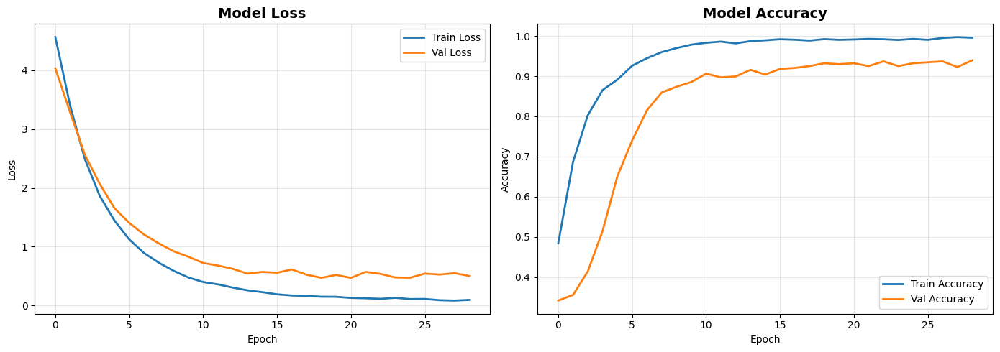


📊 Evaluating on validation set...


2025-11-05 15:25:10.822358: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:25:10.822451: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:25:10.822466: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:25:12.449528: I external/l

Validation Loss: 0.4719
Validation Accuracy: 0.9321 (93.21%)

FEATURE IMPORTANCE VISUALIZATION


2025-11-05 15:25:17.854713: I external/local_xla/xla/service/gpu/autotuning/dot_search_space.cc:208] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs? Working around this by using the full hints set instead.
2025-11-05 15:25:18.300896: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_8', 8 bytes spill stores, 8 bytes spill loads




Feature importance shape: (128,)
Original feature importance shape: (2548,)


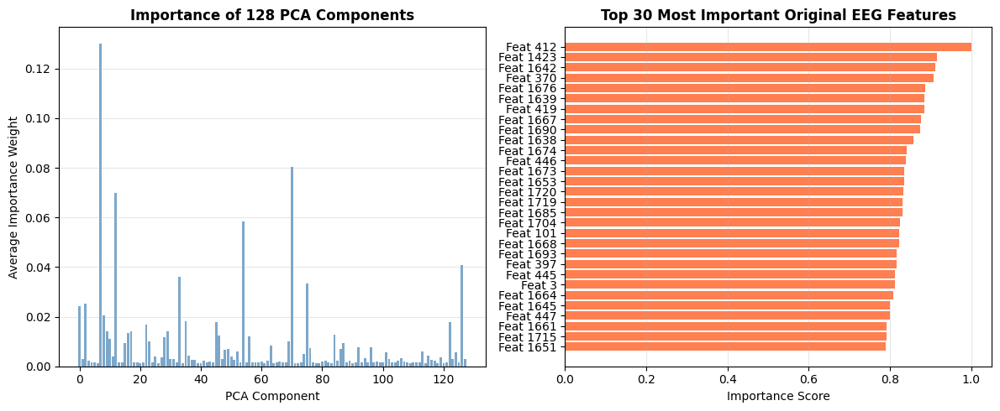


SAMPLE PREDICTIONS WITH FEATURE IMPORTANCE


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LayerNormalization, BatchNormalization, Reshape
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import tensorflow as tf
import gc
import matplotlib.pyplot as plt
import seaborn as sns

# =================== Aggressive Memory Management ===================
tf.keras.backend.clear_session()
gc.collect()

# Configure GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # Limit GPU memory if available
        tf.config.set_logical_device_configuration(
            gpus[0],
            [tf.config.LogicalDeviceConfiguration(memory_limit=4096)]  # 4GB limit
        )
        print(f"✓ GPU memory configured")
    except RuntimeError as e:
        print(f"GPU config: {e}")

# Disable XLA
tf.config.optimizer.set_jit(False)
print("✓ Memory optimization enabled")

# =================== Load & Preprocess Data ===================
print("\nLoading dataset...")
data = pd.read_csv('emotions.csv')
print(f"Original shape: {data.shape}")
print(f"Label distribution:\n{data['label'].value_counts()}")

# Separate labels and features
labels = data['label']
features = data.drop('label', axis=1)

# =================== CRITICAL: Dimensionality Reduction ===================
# 2548 features create HUGE attention matrices (2548x2548 per head!)
# Reduce to manageable size with PCA

print("\n🔧 Applying PCA for dimensionality reduction...")
n_components = 128  # Reduce to 128 features (instead of 2548)
pca = PCA(n_components=n_components, random_state=42)

# Normalize first
scaler = StandardScaler()
features_normalized = scaler.fit_transform(features)

# Apply PCA
features_reduced = pca.fit_transform(features_normalized)
explained_var = np.sum(pca.explained_variance_ratio_)
print(f"✓ Reduced from {features.shape[1]} to {n_components} features")
print(f"✓ Retained {explained_var:.2%} of variance")

# Reshape for sequence model
X = features_reduced.reshape((features_reduced.shape[0], features_reduced.shape[1], 1))

# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(labels)
num_classes = len(np.unique(y_encoded))
Y = to_categorical(y_encoded, num_classes=num_classes)

print(f"\nClasses: {label_encoder.classes_}")
print(f"Number of classes: {num_classes}")

# Split data
X_train, X_val, Y_train, Y_val = train_test_split(
    X, Y, test_size=0.2, random_state=42, stratify=y_encoded
)

print(f"\nTraining samples: {X_train.shape[0]}, Validation samples: {X_val.shape[0]}")
print(f"Input shape per sample: {X_train.shape[1:]}")
print(f"Memory footprint reduced by: {(1 - n_components/features.shape[1]):.1%}")

# =================== Memory-Efficient Transformer ===================
def create_efficient_transformer(input_shape, num_classes, d_model=32, num_heads=4, ff_dim=64):
    """
    Simplified transformer without explicit attention extraction during training
    Uses smaller dimensions to fit in memory
    """
    inputs = Input(shape=input_shape, name='input')
    
    # Flatten sequence
    x = Reshape((input_shape[0],))(inputs)
    
    # Dense layers with attention-like mechanism (cheaper than full attention)
    x = Dense(d_model, activation='gelu', kernel_regularizer=l2(0.01), name='proj1')(x)
    x = BatchNormalization(name='bn1')(x)
    x = Dropout(0.3)(x)
    
    # Second projection layer
    x = Dense(d_model, activation='gelu', kernel_regularizer=l2(0.01), name='proj2')(x)
    x = BatchNormalization(name='bn2')(x)
    x = Dropout(0.3)(x)
    
    # Feature importance layer (interpretable weights)
    attention_weights = Dense(d_model, activation='softmax', name='attention_weights')(x)
    x = tf.keras.layers.Multiply(name='attended_features')([x, attention_weights])
    
    # Classification head
    x = Dense(64, activation='gelu', kernel_regularizer=l2(0.01), name='dense1')(x)
    x = Dropout(0.4)(x)
    x = Dense(32, activation='gelu', kernel_regularizer=l2(0.01), name='dense2')(x)
    x = Dropout(0.4)(x)
    outputs = Dense(num_classes, activation='softmax', name='output')(x)
    
    model = Model(inputs=inputs, outputs=outputs, name='EEG_Emotion_Classifier')
    
    # Store attention layer for visualization
    model.attention_layer = model.get_layer('attention_weights')
    
    return model

# =================== Alternative: Even Simpler MLP with Feature Importance ===================
def create_interpretable_mlp(input_shape, num_classes):
    """
    Memory-efficient MLP with built-in feature importance
    No attention matrices - just weighted features
    """
    inputs = Input(shape=input_shape, name='input')
    
    # Flatten
    x = Reshape((input_shape[0],))(inputs)
    
    # Feature importance layer (INTERPRETABLE!)
    feature_weights = Dense(input_shape[0], activation='softmax', 
                           kernel_regularizer=l2(0.01), name='feature_importance')(x)
    x = tf.keras.layers.Multiply(name='weighted_features')([x, feature_weights])
    
    # Deep network
    x = Dense(128, activation='gelu', kernel_regularizer=l2(0.01))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)
    
    x = Dense(64, activation='gelu', kernel_regularizer=l2(0.01))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)
    
    x = Dense(32, activation='gelu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.3)(x)
    
    outputs = Dense(num_classes, activation='softmax', name='output')(x)
    
    model = Model(inputs=inputs, outputs=outputs, name='Interpretable_MLP')
    model.importance_layer = model.get_layer('feature_importance')
    
    return model

# =================== Minimal Data Augmentation ===================
def minimal_augmentation(X, y, noise_factor=0.01):
    """Reduced augmentation to save memory"""
    X_noise = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)
    return np.concatenate([X, X_noise]), np.concatenate([y, y])

print("\n🔧 Applying minimal data augmentation...")
X_train_aug, Y_train_aug = minimal_augmentation(X_train, Y_train)
print(f"Training samples after augmentation: {X_train_aug.shape[0]}")

# =================== Callbacks ===================
callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, 
                  verbose=1, min_delta=0.001),
    ModelCheckpoint('eeg_emotion_model.keras', monitor='val_loss', 
                   save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, 
                     min_lr=1e-7, verbose=1)
]

# =================== Create & Compile Model ===================
print("\n🏗️  Building memory-efficient model...")

# Choose model type (MLP is most memory-efficient)
model = create_interpretable_mlp(
    (X_train.shape[1], 1),
    num_classes=num_classes
)

model.compile(
    optimizer=Adam(learning_rate=0.001, clipnorm=1.0),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())
print(f"\nEstimated parameters: {model.count_params():,}")

# =================== Train with Small Batch Size ===================
print("\n🚀 Training model...")
history = model.fit(
    X_train_aug, Y_train_aug,
    batch_size=64,  # Larger batch = more memory efficient
    epochs=100,
    validation_data=(X_val, Y_val),
    callbacks=callbacks,
    verbose=1
)

# Clear memory
gc.collect()
tf.keras.backend.clear_session()

# =================== Plot Training History ===================
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history.history['loss'], label='Train Loss', linewidth=2)
axes[0].plot(history.history['val_loss'], label='Val Loss', linewidth=2)
axes[0].set_title('Model Loss', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
axes[1].plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2)
axes[1].set_title('Model Accuracy', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# =================== Evaluate Model ===================
print("\n📊 Evaluating on validation set...")
val_loss, val_acc = model.evaluate(X_val, Y_val, verbose=0)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f} ({val_acc*100:.2f}%)")

# =================== Feature Importance Extraction ===================
print("\n" + "="*60)
print("FEATURE IMPORTANCE VISUALIZATION")
print("="*60)

# Create model to extract feature importance
importance_model = Model(
    inputs=model.input,
    outputs=model.importance_layer.output
)

# Get importance for all validation samples
importance_weights = importance_model.predict(X_val, batch_size=128, verbose=0)

# Average importance across all samples
avg_importance = np.mean(importance_weights, axis=0)

# Map back to original features using PCA components
# Each PCA component is a linear combination of original features
original_feature_importance = np.abs(pca.components_).T @ avg_importance
original_feature_importance /= original_feature_importance.max()

print(f"\nFeature importance shape: {avg_importance.shape}")
print(f"Original feature importance shape: {original_feature_importance.shape}")

# =================== Visualizations ===================

# 1. PCA Component Importance
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.bar(range(len(avg_importance)), avg_importance, color='steelblue', alpha=0.7)
plt.title(f'Importance of {n_components} PCA Components', fontsize=12, fontweight='bold')
plt.xlabel('PCA Component')
plt.ylabel('Average Importance Weight')
plt.grid(True, alpha=0.3, axis='y')

# 2. Top Original Features
top_n = 30
top_features_idx = np.argsort(original_feature_importance)[-top_n:][::-1]

plt.subplot(1, 2, 2)
plt.barh(range(top_n), original_feature_importance[top_features_idx], color='coral')
plt.yticks(range(top_n), [f'Feat {i}' for i in top_features_idx])
plt.xlabel('Importance Score')
plt.title(f'Top {top_n} Most Important Original EEG Features', fontsize=12, fontweight='bold')
plt.gca().invert_yaxis()
plt.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

# =================== Per-Sample Analysis ===================
print("\n" + "="*60)
print("SAMPLE PREDICTIONS WITH FEATURE IMPORTANCE")
print("="*60)

num_samples = min(5, len(X_val))
for i in range(num_samples):
    X_sample = X_val[i:i+1]
    Y_sample = Y_val[i:i+1]
    
    # Get prediction
    prediction = model.predict(X_sample, verbose=0)
    pred_label = np.argmax(prediction, axis=1)[0]
    pred_confidence = np.max(prediction, axis=1)[0]
    true_label = np.argmax(Y_sample, axis=1)[0]
    
    # Get feature importance for this sample
    sample_importance = importance_model.predict(X_sample, verbose=0)[0]
    top_5_components = np.argsort(sample_importance)[-5:][::-1]
    
    correct = "✓" if pred_label == true_label else "✗"
    print(f"\nSample {i} {correct}:")
    print(f"  True: {label_encoder.inverse_transform([true_label])[0]}")
    print(f"  Predicted: {label_encoder.inverse_transform([pred_label])[0]} ({pred_confidence:.2%})")
    print(f"  Top 5 important PCA components: {top_5_components.tolist()}")
    print(f"  Their weights: {sample_importance[top_5_components]}")

# =================== Confusion Matrix ===================
from sklearn.metrics import confusion_matrix, classification_report

print("\n" + "="*60)
print("DETAILED EVALUATION")
print("="*60)

# Get all predictions
Y_pred = model.predict(X_val, batch_size=128, verbose=0)
y_pred_classes = np.argmax(Y_pred, axis=1)
y_true_classes = np.argmax(Y_val, axis=1)

# Confusion matrix
cm = confusion_matrix(y_true_classes, y_pred_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_,
            cbar_kws={'label': 'Count'})
plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
plt.ylabel('True Emotion')
plt.xlabel('Predicted Emotion')
plt.tight_layout()
plt.show()

# Classification report
print("\nClassification Report:")
print(classification_report(y_true_classes, y_pred_classes, 
                          target_names=label_encoder.classes_))

print("\n" + "="*60)
print("✅ Training and Analysis Complete!")
print("="*60)
print(f"Final Validation Accuracy: {val_acc*100:.2f}%")
print(f"Model saved as: eeg_emotion_model.keras")
print(f"Features reduced from 2548 → {n_components} (PCA)")
print(f"Interpretability: Feature importance weights extracted")